# Context 
Post Graduate Program in Data Science and Business Analytics - Supervised Learning: Linear Regression of a fictious company, Cars4U, and their Sales Data.

# Project

***From GreatLearning:***

There is a huge demand for used cars in the *Indian Market* today. As sales of new cars have slowed down in the recent past, the pre-owned car market has continued to grow over the past years and is larger than the new car market now. Cars4U is a budding *tech start-up* that aims to find footholds in this market.

In 2018-19, while new car sales were recorded at 3.6 million units, around 4 million second-hand cars were bought and sold. There is a slowdown in new car sales and that could mean that the *demand is shifting towards the pre-owned market*. In fact, some *car sellers* replace their old cars with pre-owned cars instead of buying new ones. Unlike new cars, where price and supply are fairly deterministic and managed by OEMs (Original Equipment Manufacturer / except for dealership level discounts which come into play only in the last stage of the customer journey), used cars are very different beasts with huge uncertainty in both pricing and supply. Keeping this in mind, the *pricing scheme of these used cars* becomes important in order to grow in the market.

As a senior data scientist at Cars4U, you have to come up with a pricing model that can effectively *predict the price of used cars* and can help the business in devising *profitable strategies using differential pricing.* For example, if the business knows the market price, it will never sell anything below it. 

## Project Assumptions

1. Cars4U is a tech-start-up that is also a business that sells used cars.
2. The past car price is a good predictor of future car price.
3. A linear regression model can accurately predict the future car price by training and testing on sample data.
4. The data is only a sample and may have factors which are not casual to the price variance in the population but we assume that it is a representative sample that can be used to draw inferences and make predictions.

## Project Objectives

1. Explore and visualize the dataset.

2. Build a linear regression model to predict the prices of used cars.

3. Generate a set of insights and recommendations that will help the business.

## Problems & Questions

The business does not know the market price of every used vechicle and the future of those prices and so it cannot come up with a pricing model that can effectively predict the price and therefore give good suggestions to customers on how much to spend.

The problem is also related to the Indian Market. Other influences from exterior markets will be ignored. This is an experiment. The background of the Indian car market would be good to know in this case.

**The dataset aims to answer the following key questions:**
- What are the predictive variables actually affecting used car price?

- What can we avoid looking at to save time?

- What do these relationships tell us about how to consult the selling agent on how to price their used cars?

## Intuitive Hypothesis

At a first glance of the dataset, I can say  that I think that the most predictive variables on price will be Year, Name, and Kilometers_Driven. This is generally thought of as the questions to ask about a car: What make and model? What year or how only is it? How many miles does it have on it? These usually give us a ball-park estimate of the cars value.

## Data Dictionary 

**used_cars_data.csv** -  given by Post Graduate Program in Data Science and Business Analytics. Contains information about fictious cars.

`S.No.` : Serial Number.

`Name` : Name of the car which includes Brand name and Model name.

`Location` : The location in which the car is being sold or is available for purchase (Cities).

`Year` : Manufacturing year of the car.

`Kilometers_driven` : The total kilometers driven in the car by the previous owner(s) in KM.

`Fuel_Type` : The type of fuel used by the car. (Petrol, Diesel, Electric, CNG, LPG).

`Transmission` : The type of transmission used by the car. (Automatic / Manual).

`Owner` : Type of ownership.

`Mileage` : The standard mileage offered by the car company in kmpl or km/kg or number of miles/kilometers a car can travel in one liter/kilogram of fuel.

`Engine` : The displacement volume of the engine in CC.

`Power` : The maximum power of the engine in bhp. ***From GreatLearning Expert:"BHP or Brake Horse Power is the unit of power of an engine which determines the acceleration and top speed of a vehicle. Higher the BHP higher the power of an engine."***

`Seats` : The number of seats in the car.

`New_Price` : The price of a new car of the same model in INR Lakhs.(1 Lakh = $100, 000 INR) If it's lower than the used price then not worth it. *the use the ($) sign to denote monetary units and not USD.

`Price` : The price of the used car in INR Lakhs (1 Lakh = $100, 000 INR)

------------------------
# Table of Contents: Analysis Steps
------------------------
**1. <a href = '#link1'>Data Collection</a>**

**2. <a href = '#link2'>Data Pre-processing</a>**

**3. <a href = '#link3'>Exploratory Data Analysis</a>**

**4. <a href = '#link4'>Model building - Linear Regression</a>**

**5. <a href = '#link5'>Statistics</a>**

**6. <a href = '#link6'>Best Model Predicting</a>**

**7. <a href = '#link7'>Inferences</a>**

**8. <a href = '#link8'>Insights and Recommendations</a>**

**9. <a href = '#link9'>Project Improvement</a>**


# <a id='link1'>Data Collection</a>

## Import Modules and Set Rules

In [1]:
# Install needed libraries
#!pip3 install pandas_profiling
!pip install scipy==1.6.1
!pip install jupyter_nbextensions_configurator
%load_ext nb_black

# Warning packages
import warnings

warnings.filterwarnings("ignore")

# import Python packages
import itertools
from itertools import cycle, chain

# Data analysis packages
import pylab
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np

# Data visualization packages
import seaborn as sns
import matplotlib.pyplot as plt

# To enable plotting graphs in Jupyter notebook
%matplotlib inline
plt.rcParams["figure.figsize"] = [12, 8]  # set default figure size to 10" x 5"

# for statistical packages
from sklearn.preprocessing import RobustScaler
from sklearn import linear_model  # for working with polynomial processing
from sklearn.linear_model import LinearRegression  # To build linear regression_model
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from scipy import stats
import scipy.stats as stats
from scipy.stats import mode, norm, pearsonr, tmean  # for a Pearson Correlation matrix

# Sklearn package's randomized data splitting function
from sklearn.model_selection import train_test_split


# To check model performance
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)

from sklearn.preprocessing import PolynomialFeatures  # for adding features to the model
from sklearn.preprocessing import (
    StandardScaler,
)  # for standard scaling of normalized data (assumed for Linear Regression model)
import pylab  # for making a probability plot

"""perform linear regression using *statsmodels*, 
a Python module that provides functions for the estimation of many statistical models, 
as well as for conducting statistical tests, and statistical data exploration.
"""

# limit or remove from the number of displayed columns and rows.
# This is so I can see the entire dataframe when I print it
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)

<IPython.core.display.Javascript object>

In [2]:
# check scipy version for 1.6.1 for using attributes of testing functions
import scipy

scipy.__version__

'1.6.1'

<IPython.core.display.Javascript object>

## Import and View

`S.No.` of the vehicle is not giving us additional useful information about the used cars that we will need at this level of analysis (trend and prediction) and is acting effectively as an index, which we already have, so I will set it up as the Index in the read_csv.

In [3]:
# import dataset and make a dataframe
df = pd.read_csv("used_cars_data.csv", index_col="S.No.")

pd.set_option(
    "display.float_format", lambda x: "%.2f" % x
)  # To supress numerical display in scientific notations

<IPython.core.display.Javascript object>

In [4]:
# Create a copy of the dataframe
df = df.copy()

# View shape of the dataframe
print(f"The dataframe shape is {df.shape}")

# I'm now going to look at 10 random rows
# I'm setting the random seed via np.random.seed so that
# I get the same random results every time
np.random.seed(1)
df.sample(n=10)

The dataframe shape is (7253, 13)


,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
S.No.,,,,,,,,,,,,,
2397,Ford EcoSport 1.5 Petrol Trend,Kolkata,2016,21460,Petrol,Manual,First,17.0 kmpl,1497 CC,121.36 bhp,5.00,9.47 Lakh,6.00
3777,Maruti Wagon R VXI 1.2,Kochi,2015,49818,Petrol,Manual,First,21.5 kmpl,1197 CC,81.80 bhp,5.00,5.44 Lakh,4.11
4425,Ford Endeavour 4x2 XLT,Hyderabad,2007,130000,Diesel,Manual,First,13.1 kmpl,2499 CC,141 bhp,7.00,NaN,6.00
3661,Mercedes-Benz E-Class E250 CDI Avantgrade,Coimbatore,2016,39753,Diesel,Automatic,First,13.0 kmpl,2143 CC,201.1 bhp,5.00,NaN,35.28
4514,Hyundai Xcent 1.2 Kappa AT SX Option,Kochi,2016,45560,Petrol,Automatic,First,16.9 kmpl,1197 CC,82 bhp,5.00,NaN,6.34
599,Toyota Innova Crysta 2.8 ZX AT,Coimbatore,2019,40674,Diesel,Automatic,First,11.36 kmpl,2755 CC,171.5 bhp,7.00,28.05 Lakh,24.82
186,Mercedes-Benz E-Class E250 CDI Avantgrade,Bangalore,2014,37382,Diesel,Automatic,First,13.0 kmpl,2143 CC,201.1 bhp,5.00,NaN,32.00
305,Audi A6 2011-2015 2.0 TDI Premium Plus,Kochi,2014,61726,Diesel,Automatic,First,17.68 kmpl,1968 CC,174.33 bhp,5.00,NaN,20.77
4582,Hyundai i20 1.2 Magna,Kolkata,2011,36000,Petrol,Manual,First,18.5 kmpl,1197 CC,80 bhp,5.00,NaN,2.50


<IPython.core.display.Javascript object>

**Observations:**

1. We have a lot of variablility in the `Name` column.
2. The `Mileage`, `Power` & `New_Price` has numeric and string values that will need to be processed.
3. `New_Price` has many missing values and we will need to handle this.

It looks lke we are looking at a lot of string values that are not good for modeling in a linear regression model.

In [5]:
# View top 5 rows of dataframe
df.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
S.No.,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.00,NaN,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.00,NaN,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.00,8.61 Lakh,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.00,NaN,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.00,NaN,17.74


<IPython.core.display.Javascript object>

In [6]:
# View bottom 5 rows of dataframe
df.tail()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
S.No.,,,,,,,,,,,,,
7248,Volkswagen Vento Diesel Trendline,Hyderabad,2011,89411,Diesel,Manual,First,20.54 kmpl,1598 CC,103.6 bhp,5.00,NaN,NaN
7249,Volkswagen Polo GT TSI,Mumbai,2015,59000,Petrol,Automatic,First,17.21 kmpl,1197 CC,103.6 bhp,5.00,NaN,NaN
7250,Nissan Micra Diesel XV,Kolkata,2012,28000,Diesel,Manual,First,23.08 kmpl,1461 CC,63.1 bhp,5.00,NaN,NaN
7251,Volkswagen Polo GT TSI,Pune,2013,52262,Petrol,Automatic,Third,17.2 kmpl,1197 CC,103.6 bhp,5.00,NaN,NaN
7252,Mercedes-Benz E-Class 2009-2013 E 220 CDI Avan...,Kochi,2014,72443,Diesel,Automatic,First,10.0 kmpl,2148 CC,170 bhp,5.00,NaN,NaN


<IPython.core.display.Javascript object>

**Observations:**

Looks like there are both NaN and nan values present. This will need to get handled separately.

# <a id="link2">Data Pre-processing</a>

1. **Data Format**
 - Data dimensions
 - Dtypes
2. **Data Consistency**
 - Sanity, Missing, Duplicates checking.
 - Distribution and skewness
 - Outliers
3. **Feature Engineering**
 - Variable transformations (numerics, logs, exponentials..)
 - Feature extraction to meet model assumptions/requirements (make model inputs meaningful, significant coefficients, dropping highly correlated, space transformation....)

## Data Format
Getting all the features into numeric form for modeling.

### Data Dimensions

In [7]:
# get dataframe shape
df.shape

(7253, 13)

<IPython.core.display.Javascript object>

In [8]:
# get dtypes
df.dtypes

Name                  object
Location              object
Year                   int64
Kilometers_Driven      int64
Fuel_Type             object
Transmission          object
Owner_Type            object
Mileage               object
Engine                object
Power                 object
Seats                float64
New_Price             object
Price                float64
dtype: object

<IPython.core.display.Javascript object>

In [9]:
# Get the information on the df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7253 entries, 0 to 7252
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               7253 non-null   object 
 1   Location           7253 non-null   object 
 2   Year               7253 non-null   int64  
 3   Kilometers_Driven  7253 non-null   int64  
 4   Fuel_Type          7253 non-null   object 
 5   Transmission       7253 non-null   object 
 6   Owner_Type         7253 non-null   object 
 7   Mileage            7251 non-null   object 
 8   Engine             7207 non-null   object 
 9   Power              7207 non-null   object 
 10  Seats              7200 non-null   float64
 11  New_Price          1006 non-null   object 
 12  Price              6019 non-null   float64
dtypes: float64(2), int64(2), object(9)
memory usage: 793.3+ KB


<IPython.core.display.Javascript object>

**Observations:**

Many different dtypes that will need to be checked through and maybe changed. Looking at the samples above we can say that the `S.No.`,`Kilometers_Driven`,`Engine`, and `Seats`, is meant clearly to be an int64, while `Name`, `Location``Fuel_Type`,`Owner_Type`, `Year`, and `Transmission`, are string categoricals, and `Mileage`,`Power`, are floats. `New_Price` and `Price` since they are given a conversion rate in the description, I can decide to conver them to not. Given that  the other units are metric, I will keep the dollar value to the Indian currency. This will leave them as dtype=float.

Insights:

- The `Transmission` column has 2 unique values - "*Manual*" and "*Automatic*"
- The `Engine` column has 150 unique values, i.e., the data is collected from 150 Engine sizes.
- `Year` ranges from 1996 to 2019.
- Average `Power` is 112.31 CC's.

In [10]:
# Get the dataframe columns list
df.columns

Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_Price', 'Price'],
      dtype='object')

<IPython.core.display.Javascript object>

### Dtypes


In [11]:
cat_vars = [
    "Name",
    "Location",
    "Fuel_Type",
    "Transmission",
    "Owner_Type",
    # "Year",
]

for colname in cat_vars:
    df[colname] = df[colname].astype("category")

df.info()  # Explore dataframe information, check dtype, and nulls.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7253 entries, 0 to 7252
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Name               7253 non-null   category
 1   Location           7253 non-null   category
 2   Year               7253 non-null   int64   
 3   Kilometers_Driven  7253 non-null   int64   
 4   Fuel_Type          7253 non-null   category
 5   Transmission       7253 non-null   category
 6   Owner_Type         7253 non-null   category
 7   Mileage            7251 non-null   object  
 8   Engine             7207 non-null   object  
 9   Power              7207 non-null   object  
 10  Seats              7200 non-null   float64 
 11  New_Price          1006 non-null   object  
 12  Price              6019 non-null   float64 
dtypes: category(5), float64(2), int64(2), object(4)
memory usage: 633.9+ KB


<IPython.core.display.Javascript object>

**Observations:**

1. New_Price has many missing values and we will need to handle this.
2. Price has a number of missing values and will need to be pre-processed in order to make it into our model.
3. In all, not many missing values and a simple small data-set at 7k+ records.

**Numerics**

Before I can go on to do analysis I need to make sure the numeric types are set correctly by removing string values from them. These units of measurement are important for understanding the data so I will move them to the column headers to keep them top of mind when doing insights and recommendations.

In [12]:
# looking at value counts for non-categorical features

num_to_display = 10  # defining this up here so it's easy to change later if I want
for colname in df.dtypes[df.dtypes == "object"].index:  # call the mixed-dtype class
    val_counts = df[colname].value_counts(dropna=False)  # i want to see NA counts
    print(colname, "\n", "\n", val_counts[:num_to_display])
    if len(val_counts) > num_to_display:
        print(f"Only displaying first {num_to_display} of {len(val_counts)} values.")
    print("\n\n")  # just for more space

Mileage 
 
 17.0 kmpl     207
18.9 kmpl     201
18.6 kmpl     144
21.1 kmpl     106
20.36 kmpl    105
17.8 kmpl      98
18.0 kmpl      89
12.8 kmpl      87
18.5 kmpl      86
16.0 kmpl      85
Name: Mileage, dtype: int64
Only displaying first 10 of 451 values.



Engine 
 
 1197 CC    732
1248 CC    610
1498 CC    370
998 CC     309
1198 CC    281
2179 CC    278
1497 CC    273
1968 CC    266
1995 CC    212
1461 CC    188
Name: Engine, dtype: int64
Only displaying first 10 of 151 values.



Power 
 
 74 bhp       280
98.6 bhp     166
73.9 bhp     152
140 bhp      142
null bhp     129
78.9 bhp     128
67.1 bhp     126
67.04 bhp    125
82 bhp       124
88.5 bhp     120
Name: Power, dtype: int64
Only displaying first 10 of 387 values.



New_Price 
 
 NaN           6247
63.71 Lakh       6
33.36 Lakh       6
95.13 Lakh       6
4.78 Lakh        6
11.67 Lakh       5
20.74 Lakh       5
11.75 Lakh       5
4.98 Lakh        5
15.05 Lakh       5
Name: New_Price, dtype: int64
Only displaying first 1

<IPython.core.display.Javascript object>

**Observations:**

1. Looking at our non-numeric features we can see better that there are many numerics buried there that will need to be  extracted and converted into numeric types by cleaning up the units of measurement out of them.

2. Power has a value "null" which needs to be treated.

#### `Power`

Power is in bhp. We need to split the values into numeric and string so we will have two columns.

In [13]:
# change missing values in Power to actualy NaN values.
df["Power"] = df["Power"].replace("null bhp", np.nan)
"null bhp" in df.Power

False

<IPython.core.display.Javascript object>

In [14]:
def floats(n):
    """In the Mileage and Power  columns I'm replacing the terminal 'km/kg','kmpl', 'bhp' and  with
    the empty string and converting to a float. Non-strings are
    np.nans and are kept as np.nans."""
    if isinstance(n, str):
        return float(n.replace(" bhp", ""))
    else:
        return np.nan

<IPython.core.display.Javascript object>

In [15]:
col_transforms = {"Power": floats}

# k is the key, so the column name here
# v is the value, which a function in this case and is
#     either `height_to_num` or `weight_to_num`
for k, v in col_transforms.items():
    df[k] = df[k].map(v)

<IPython.core.display.Javascript object>

In [16]:
# Look at the head
df.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
S.No.,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16,5.00,NaN,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.20,5.00,NaN,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.70,5.00,8.61 Lakh,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76,7.00,NaN,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.80,5.00,NaN,17.74


<IPython.core.display.Javascript object>

Verify the unit matches the fuel type

In [17]:
# check that function worked
for i in col_transforms:
    display(df[i].head())

S.No.
0    58.16
1   126.20
2    88.70
3    88.76
4   140.80
Name: Power, dtype: float64

<IPython.core.display.Javascript object>

In [18]:
# print dtypes
df.dtypes

Name                 category
Location             category
Year                    int64
Kilometers_Driven       int64
Fuel_Type            category
Transmission         category
Owner_Type           category
Mileage                object
Engine                 object
Power                 float64
Seats                 float64
New_Price              object
Price                 float64
dtype: object

<IPython.core.display.Javascript object>

#### `Engine`

In [19]:
# Strip and create new column
df["Engine_num"] = (
    df["Engine"].apply(lambda x: x.replace("CC", "").strip() if type(x) == str else x)
).astype(float)

<IPython.core.display.Javascript object>

In [20]:
# check head
df.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price,Engine_num
S.No.,,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16,5.00,NaN,1.75,998.00
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.20,5.00,NaN,12.50,1582.00
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.70,5.00,8.61 Lakh,4.50,1199.00
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76,7.00,NaN,6.00,1248.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.80,5.00,NaN,17.74,1968.00


<IPython.core.display.Javascript object>

We don't need the Engine column anymore since we only want the numbers.

In [21]:
# drop column
df.drop(columns="Engine", inplace=True, axis=1)

<IPython.core.display.Javascript object>

`Engine_num` and `Seats` are a float that is really a Int64 dtype (real number vs a float). First handle the missingness in each to allow conversion. We will use mean replacement.

In [22]:
numeric_columns = ["Engine_num"]

# for every item in the list print the mean
for i in numeric_columns:
    print(i, df[i].mean())

medianFiller = lambda x: x.fillna(
    x.median()
)  # use the median of the column to fill in na values

df[numeric_columns] = df[numeric_columns].apply(
    medianFiller, axis=0
)  # apply the median filling function

for i in numeric_columns:
    print("After filling in medians", i, df[i].mean())  # print the post-function mean

Engine_num 1616.5734702372692
After filling in medians Engine_num 1615.7897421756516


<IPython.core.display.Javascript object>

It has only changed by ~1 unit which is enough to be used.

In [23]:
# check for na values
df["Engine_num"].isna().sum()

0

<IPython.core.display.Javascript object>

In [24]:
# dtype conversion
# df[["Engine_num","Seats"]].convert_dtypes(True,False,True,False,False)

df["Engine_num"] = df["Engine_num"].astype("int64", copy=False)

<IPython.core.display.Javascript object>

In [25]:
# check dtypes
df.dtypes

Name                 category
Location             category
Year                    int64
Kilometers_Driven       int64
Fuel_Type            category
Transmission         category
Owner_Type           category
Mileage                object
Power                 float64
Seats                 float64
New_Price              object
Price                 float64
Engine_num              int64
dtype: object

<IPython.core.display.Javascript object>

It looks that `Engine_num` is correct. Now we need to look at `Seats`.

#### `Seats`

In [26]:
# Get missing
df.Seats.isna().sum()

53

<IPython.core.display.Javascript object>

After checking for missing lets treat these values with standard mean replacement.

In [27]:
numeric_columns = ["Seats"]

# for every item in the list print the mean
for i in numeric_columns:
    print(i, df[i].mean())

medianFiller = lambda x: x.fillna(
    x.median()
)  # use the median of the column to fill in na values

df[numeric_columns] = df[numeric_columns].apply(
    medianFiller, axis=0
)  # apply the median filling function

for i in numeric_columns:
    print("After filling in medians", i, df[i].mean())  # print the post-function mean

Seats 5.279722222222222
After filling in medians Seats 5.277678202123259


<IPython.core.display.Javascript object>

Hardly changed the mean. We will use.

In [28]:
# check dtype
df.Seats = df.Seats.astype("int64", copy=False)
df.Seats.dtype

dtype('int64')

<IPython.core.display.Javascript object>

That has been fixed. Now we need to continue with the parsing of object columns.

#### `Mileage`

For `Mileage` we need to get the units into another column and numerics into another still. kmpl - kilometers per litre - is used for petrol and diesel cars.
km/kg - kilometers per kg - is used for CNG and LPG based engines.
We can check this in our data by comparing it to the `Fuel_Type` variable.

In [29]:
# split the name on number vs string
df["Mileage_num"] = (
    df["Mileage"].apply(
        lambda x: x.replace(" kmpl", "").replace(" km/kg", "").strip()
        if type(x) == str
        else x
    )
).astype(float)

<IPython.core.display.Javascript object>

In [30]:
# check the df
df.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Power,Seats,New_Price,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,58.16,5,NaN,1.75,998,26.60
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,126.20,5,NaN,12.50,1582,19.67
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,88.70,5,8.61 Lakh,4.50,1199,18.20
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,88.76,7,NaN,6.00,1248,20.77
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,140.80,5,NaN,17.74,1968,15.20


<IPython.core.display.Javascript object>

In [31]:
# extract text
df["Mileage_unit"] = (
    df["Mileage"].str.extract("([a-zA-Z ]+)", expand=False).str.strip()
).astype("category")
df.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Power,Seats,New_Price,Price,Engine_num,Mileage_num,Mileage_unit
S.No.,,,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,58.16,5,NaN,1.75,998,26.60,km
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,126.20,5,NaN,12.50,1582,19.67,kmpl
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,88.70,5,8.61 Lakh,4.50,1199,18.20,kmpl
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,88.76,7,NaN,6.00,1248,20.77,kmpl
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,140.80,5,NaN,17.74,1968,15.20,kmpl


<IPython.core.display.Javascript object>

In [32]:
# Let us check if the units correspond to the fuel types as expected.
df.groupby(by=["Fuel_Type", "Mileage_unit"]).size()

Fuel_Type  Mileage_unit
CNG        km                62
           kmpl               0
Diesel     km                 0
           kmpl            3852
Electric   km                 0
           kmpl               0
LPG        km                12
           kmpl               0
Petrol     km                 0
           kmpl            3325
dtype: int64

<IPython.core.display.Javascript object>

As expected, km/kg is for CNG/LPG cars and kmpl is for Petrol and Diesel cars.

Now that `Mileage` is separated we can drop the original column and the unit column knowing how to pair them to `Fuel_Type`.

In [33]:
# drop column
df.drop(labels=["Mileage", "Mileage_unit"], inplace=True, axis=1)

<IPython.core.display.Javascript object>

In [34]:
# check columns
df.columns

Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Power', 'Seats', 'New_Price', 'Price',
       'Engine_num', 'Mileage_num'],
      dtype='object')

<IPython.core.display.Javascript object>

In [35]:
# check conversion
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7253 entries, 0 to 7252
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Name               7253 non-null   category
 1   Location           7253 non-null   category
 2   Year               7253 non-null   int64   
 3   Kilometers_Driven  7253 non-null   int64   
 4   Fuel_Type          7253 non-null   category
 5   Transmission       7253 non-null   category
 6   Owner_Type         7253 non-null   category
 7   Power              7078 non-null   float64 
 8   Seats              7253 non-null   int64   
 9   New_Price          1006 non-null   object  
 10  Price              6019 non-null   float64 
 11  Engine_num         7253 non-null   int64   
 12  Mileage_num        7251 non-null   float64 
dtypes: category(5), float64(3), int64(4), object(1)
memory usage: 891.9+ KB


<IPython.core.display.Javascript object>

## Data Consistency

### Sanity

Remove unneeded car types: "Electric" is a new market and will sway the pricing.

In [36]:
df.Fuel_Type.value_counts()

Diesel      3852
Petrol      3325
CNG           62
LPG           12
Electric       2
Name: Fuel_Type, dtype: int64

<IPython.core.display.Javascript object>

In [37]:
# subset columns
elec = df.loc[df.Fuel_Type == "Electric"]
display(elec)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,New_Price,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,,
4446,Mahindra E Verito D4,Chennai,2016,50000,Electric,Automatic,First,41.00,5,13.58 Lakh,13.00,72,NaN
4904,Toyota Prius 2009-2016 Z4,Mumbai,2011,44000,Electric,Automatic,First,73.00,5,NaN,12.75,1798,NaN


<IPython.core.display.Javascript object>

In [38]:
# drop rows
df.drop(labels=[4446, 4904], axis=0, inplace=True)

<IPython.core.display.Javascript object>

In [39]:
# check drop
df.loc[df.Fuel_Type == "Electric"]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,New_Price,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,,


<IPython.core.display.Javascript object>

In [40]:
# check the drop
df.Fuel_Type.value_counts().to_frame()

,Fuel_Type
Diesel,3852
Petrol,3325
CNG,62
LPG,12
Electric,0


<IPython.core.display.Javascript object>

In [41]:
# update the Catgorical dtype of Fuel_Type (https://pandas.pydata.org/pandas-docs/stable/user_guide/categorical.html)
# Values which are removed are replaced by np.nan.
display(df.Fuel_Type.cat.categories)
df.Fuel_Type = df.Fuel_Type.cat.remove_categories(["Electric"])
display(df.Fuel_Type.cat.categories)

Index(['CNG', 'Diesel', 'Electric', 'LPG', 'Petrol'], dtype='object')

Index(['CNG', 'Diesel', 'LPG', 'Petrol'], dtype='object')

<IPython.core.display.Javascript object>

**`Mileage` may have odd values in it. Let's check**

Extreme values in `Mileage`

In [42]:
# check the minimum
df.Mileage_num.min()

0.0

<IPython.core.display.Javascript object>

In [43]:
# get subset
mil = df.loc[df.Mileage_num == df.Mileage_num.min()]
display(mil)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,New_Price,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,,
14,Land Rover Freelander 2 TD4 SE,Pune,2012,85000,Diesel,Automatic,Second,115.00,5,NaN,17.50,2179,0.00
67,Mercedes-Benz C-Class Progressive C 220d,Coimbatore,2019,15369,Diesel,Automatic,First,194.00,5,49.14 Lakh,35.67,1950,0.00
79,Hyundai Santro Xing XL,Hyderabad,2005,87591,Petrol,Manual,First,NaN,5,NaN,1.30,1086,0.00
194,Honda City 1.5 GXI,Ahmedabad,2007,60006,Petrol,Manual,First,NaN,5,NaN,2.95,1493,0.00
229,Ford Figo Diesel,Bangalore,2015,70436,Diesel,Manual,First,99.00,5,NaN,3.60,1498,0.00
262,Hyundai Santro Xing XL,Hyderabad,2006,99000,Petrol,Manual,First,NaN,5,NaN,1.75,1086,0.00
307,Hyundai Santro Xing XL,Chennai,2006,58000,Petrol,Manual,Second,NaN,5,NaN,1.50,1086,0.00
424,Volkswagen Jetta 2007-2011 1.9 L TDI,Hyderabad,2010,42021,Diesel,Manual,First,NaN,5,NaN,5.45,1968,0.00
443,Hyundai Santro GLS I - Euro I,Coimbatore,2012,50243,Petrol,Manual,First,NaN,5,NaN,3.35,1086,0.00


<IPython.core.display.Javascript object>

There should be no 0's mpkm. This could be a data-entry error or system mistake. Let's investigate further.

Let's treat them as missing and handle all missing values later.

In [44]:
# replace with np.nan
df["Mileage_num"] = df["Mileage_num"].replace(df.Mileage_num.min(), np.nan)

<IPython.core.display.Javascript object>

In [45]:
# subset with loc
df.loc[df.Mileage_num == df.Mileage_num.min()]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,New_Price,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,,
5781,Lamborghini Gallardo Coupe,Delhi,2011,6500,Petrol,Automatic,Third,560.00,2,NaN,120.00,5204,6.40


<IPython.core.display.Javascript object>

### Missing Values

There are lots of ways to handle missing values. I'm going to start by investigating the patterns in the missingness.



In [46]:
# looking at which columns have the most missing values
df.isna().sum().sort_values(ascending=False)

New_Price            6246
Price                1234
Power                 175
Mileage_num            81
Name                    0
Location                0
Year                    0
Kilometers_Driven       0
Fuel_Type               0
Transmission            0
Owner_Type              0
Seats                   0
Engine_num              0
dtype: int64

<IPython.core.display.Javascript object>

Calculate the percentage of the data points missing per variable and if any variable has more than 50% missing values in it those are generally not useful and dropping those variables instead is recommended.

In [47]:
# Find percentage missing per column
df.isna().mean().sort_values(ascending=False).round(4) * 100

New_Price           86.14
Price               17.02
Power                2.41
Mileage_num          1.12
Name                 0.00
Location             0.00
Year                 0.00
Kilometers_Driven    0.00
Fuel_Type            0.00
Transmission         0.00
Owner_Type           0.00
Seats                0.00
Engine_num           0.00
dtype: float64

<IPython.core.display.Javascript object>

In [48]:
# counting the number of missing values per row
df.isnull().sum(axis=1).value_counts()

1    5212
2    1142
0     819
3      72
4       6
dtype: int64

<IPython.core.display.Javascript object>

There are 32 rows with 3 missing values, and 1163 with atleast 2. This is quite messy still and will need correcting.

In [49]:
# print a df of the null values
null_data = df[df.isnull().any(axis=1)]
display(null_data)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,New_Price,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,58.16,5,NaN,1.75,998,26.60
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,126.20,5,NaN,12.50,1582,19.67
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,88.76,7,NaN,6.00,1248,20.77
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,140.80,5,NaN,17.74,1968,15.20
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,LPG,Manual,First,55.20,5,NaN,2.35,814,21.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7248,Volkswagen Vento Diesel Trendline,Hyderabad,2011,89411,Diesel,Manual,First,103.60,5,NaN,NaN,1598,20.54
7249,Volkswagen Polo GT TSI,Mumbai,2015,59000,Petrol,Automatic,First,103.60,5,NaN,NaN,1197,17.21
7250,Nissan Micra Diesel XV,Kolkata,2012,28000,Diesel,Manual,First,63.10,5,NaN,NaN,1461,23.08


<IPython.core.display.Javascript object>

Re-check missing after dropping.

In [50]:
# create a list of columns with empty, or na values
nulls = df.columns[df.isna().any().tolist()]

<IPython.core.display.Javascript object>

In [51]:
# looking at which columns have the most missing values
df.isna().sum().sort_values(ascending=False)

New_Price            6246
Price                1234
Power                 175
Mileage_num            81
Name                    0
Location                0
Year                    0
Kilometers_Driven       0
Fuel_Type               0
Transmission            0
Owner_Type              0
Seats                   0
Engine_num              0
dtype: int64

<IPython.core.display.Javascript object>

**Observations**

In [52]:
# Find percentage missing per column
df.isna().mean().sort_values(ascending=False).round(4) * 100

New_Price           86.14
Price               17.02
Power                2.41
Mileage_num          1.12
Name                 0.00
Location             0.00
Year                 0.00
Kilometers_Driven    0.00
Fuel_Type            0.00
Transmission         0.00
Owner_Type           0.00
Seats                0.00
Engine_num           0.00
dtype: float64

<IPython.core.display.Javascript object>

**Observations:**

1. The `New_Price` column has a lot of missing values. These could be cars that do not have an equivalent model on the new-car market. Since I'm not particularly interested in this column as the description of the project states that these two markets are very different and I can't confidently say that there is a strong relationship between new car price and used car price (even though in common knowledge there is a jolt in used car sales when new car prices are high), I'll drop it for the sake of our analysis.

2. `Power` will need to be fixed as well.



#### Imputing Missing Values

`New_Price`

In [53]:
# Drop any unneeded columns
df.drop(["New_Price"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [54]:
df.isna().mean().sort_values(ascending=False).round(4) * 100

Price               17.02
Power                2.41
Mileage_num          1.12
Name                 0.00
Location             0.00
Year                 0.00
Kilometers_Driven    0.00
Fuel_Type            0.00
Transmission         0.00
Owner_Type           0.00
Seats                0.00
Engine_num           0.00
dtype: float64

<IPython.core.display.Javascript object>

##### Standard Replacement

We will replace missing values in every needed column with its median increasing it's distortion <5% shouldnt matter (or drop all together).


Including `Price` here as opposed to dropping it or filling in with mean to not skew to outliers, even though it has 16% blanks, I want to keep as many data points as possible for the modeling.

In [55]:
# count the number missing
df.Price.isna().sum()

1234

<IPython.core.display.Javascript object>

In [56]:
numeric_columns = ["Power", "Price", "Mileage_num"]

for i in numeric_columns:
    print(i, df[i].mean())

medianFiller = lambda x: x.fillna(x.median())

df[numeric_columns] = df[numeric_columns].apply(medianFiller, axis=0)

for i in numeric_columns:
    print("After filling in medians", i, df[i].mean())

Power 112.78097583380348
Price 9.478339704171498
Mileage_num 18.346527196652747
After filling in medians Power 112.33591021927913
After filling in medians Price 8.825117914770264
After filling in medians Mileage_num 18.344890359950362


<IPython.core.display.Javascript object>

Very little difference after missing value filling.  `Price` moved down .6 Lakhs.

### Duplicates

In [57]:
# check for duplicated items
df.duplicated(keep=False).value_counts()

False    7249
True        2
dtype: int64

<IPython.core.display.Javascript object>

In [58]:
# dropping duplicate rows
df.drop_duplicates(keep=False, inplace=True)

<IPython.core.display.Javascript object>

In [59]:
df[df.duplicated(keep=False)]  # check drop

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num
S.No.,,,,,,,,,,,,


<IPython.core.display.Javascript object>

No duplicates found.

In [60]:
# check the number of unique values in each column of the dataframe
df.nunique().sort_values(ascending=False)

Kilometers_Driven    3660
Name                 2039
Price                1373
Mileage_num           437
Power                 383
Engine_num            149
Year                   23
Location               11
Seats                   9
Fuel_Type               4
Owner_Type              4
Transmission            2
dtype: int64

<IPython.core.display.Javascript object>

In [61]:
# View the unique items in each row
for i in df.columns:
    display(i, pd.DataFrame(df[i].unique()))

'Name'

,0
0,Maruti Wagon R LXI CNG
1,Hyundai Creta 1.6 CRDi SX Option
2,Honda Jazz V
3,Maruti Ertiga VDI
4,Audi A4 New 2.0 TDI Multitronic
...,...
2034,Skoda Superb Petrol Ambition
2035,Tata Tiago 1.05 Revotorq XT Option
2036,Ford EcoSport 1.5 Petrol Ambiente
2037,Jeep Compass 1.4 Sport


'Location'

,0
0,Mumbai
1,Pune
2,Chennai
3,Coimbatore
4,Hyderabad
5,Jaipur
6,Kochi
7,Kolkata
8,Delhi
9,Bangalore


'Year'

,0
0,2010
1,2015
2,2011
3,2012
4,2013
5,2016
6,2018
7,2014
8,2017
9,2007


'Kilometers_Driven'

,0
0,72000
1,41000
2,46000
3,87000
4,40670
...,...
3655,18242
3656,21190
3657,89411
3658,52262


'Fuel_Type'

,0
0,CNG
1,Diesel
2,Petrol
3,LPG


'Transmission'

,0
0,Manual
1,Automatic


'Owner_Type'

,0
0,First
1,Second
2,Fourth & Above
3,Third


'Power'

,0
0,58.16
1,126.20
2,88.70
3,88.76
4,140.80
...,...
378,147.40
379,328.50
380,98.63
381,360.00


'Seats'

,0
0,5
1,7
2,8
3,4
4,6
5,2
6,10
7,9
8,0


'Price'

,0
0,1.75
1,12.50
2,4.50
3,6.00
4,17.74
...,...
1368,1.39
1369,30.54
1370,2.27
1371,17.56


'Engine_num'

,0
0,998
1,1582
2,1199
3,1248
4,1968
5,814
6,1461
7,2755
8,1598
9,1462


'Mileage_num'

,0
0,26.60
1,19.67
2,18.20
3,20.77
4,15.20
...,...
432,11.88
433,12.08
434,15.56
435,14.50


<IPython.core.display.Javascript object>

**Observations:**

1. `Name` has many unique values as expected.
2. We have some simple options in `Transmission`, `Owner_Type`, and `Fuel_type` that will make visual analysis simpler.

### Distribution and Skewness

#### Log Transformations
Since we are using a Linear Regression model which assumes normality, I will transform variables with high skewness. H

If the skewness is between -0.5 and 0.5, the data are fairly symmetrical.

If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed.

If the skewness is less than -1 or greater than 1, the data are highly skewed.

In [62]:
# Subset the dataframe based on numeric and categorical types
numerical_features = df.select_dtypes(include=["int64", "float64"])
global numerical_features
[numerical_features]

[       Year  Kilometers_Driven  Power  Seats  Price  Engine_num  Mileage_num
 S.No.                                                                       
 0      2010              72000  58.16      5   1.75         998        26.60
 1      2015              41000 126.20      5  12.50        1582        19.67
 2      2011              46000  88.70      5   4.50        1199        18.20
 3      2012              87000  88.76      7   6.00        1248        20.77
 4      2013              40670 140.80      5  17.74        1968        15.20
 ...     ...                ...    ...    ...    ...         ...          ...
 7248   2011              89411 103.60      5   5.64        1598        20.54
 7249   2015              59000 103.60      5   5.64        1197        17.21
 7250   2012              28000  63.10      5   5.64        1461        23.08
 7251   2013              52262 103.60      5   5.64        1197        17.20
 7252   2014              72443 170.00      5   5.64        2148

<IPython.core.display.Javascript object>

In [63]:
# get skew
numerical_features.skew()

Year                -0.84
Kilometers_Driven   61.57
Power                2.00
Seats                1.91
Price                3.73
Engine_num           1.42
Mileage_num          0.21
dtype: float64

<IPython.core.display.Javascript object>

In [64]:
# get normality check: std of 1 and mean of 0
display("mean", numerical_features.mean())
display("std", numerical_features.std())

'mean'

Year                 2013.37
Kilometers_Driven   58704.14
Power                 112.33
Seats                   5.28
Price                   8.83
Engine_num           1616.01
Mileage_num            18.35
dtype: float64

'std'

Year                    3.25
Kilometers_Driven   84450.70
Power                  52.93
Seats                   0.81
Price                  10.30
Engine_num            593.35
Mileage_num             4.14
dtype: float64

<IPython.core.display.Javascript object>

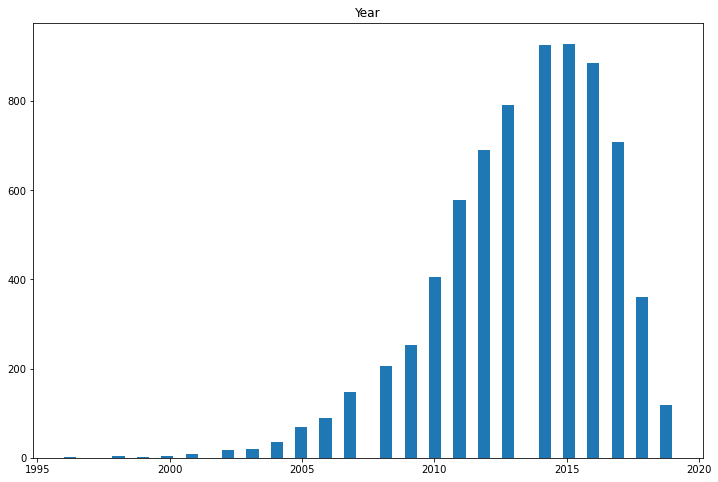

0


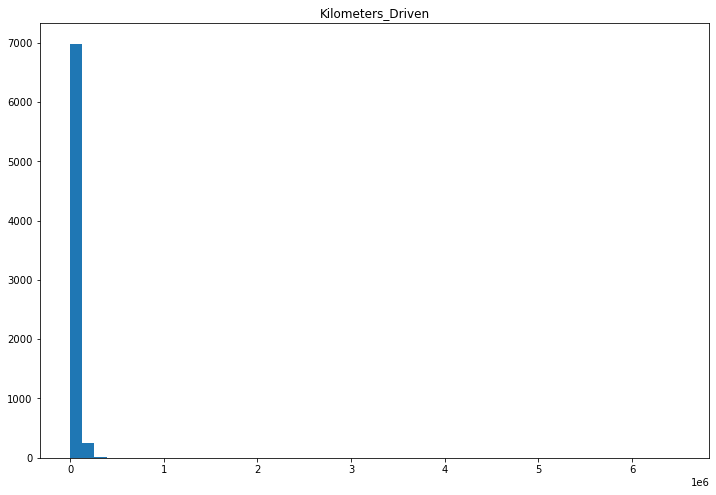

0


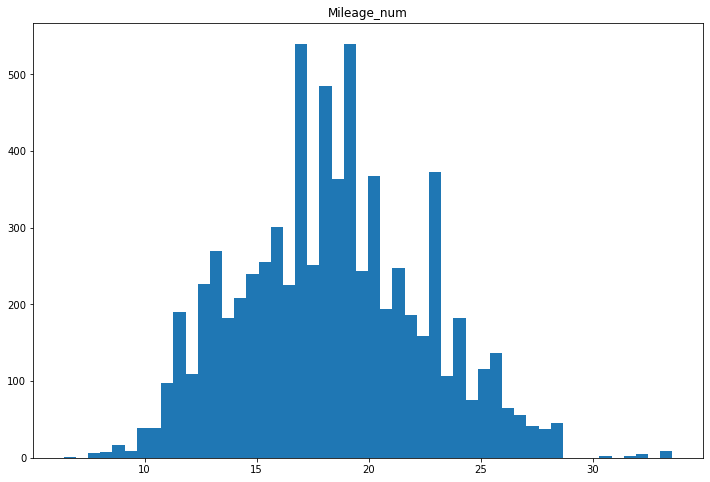

0


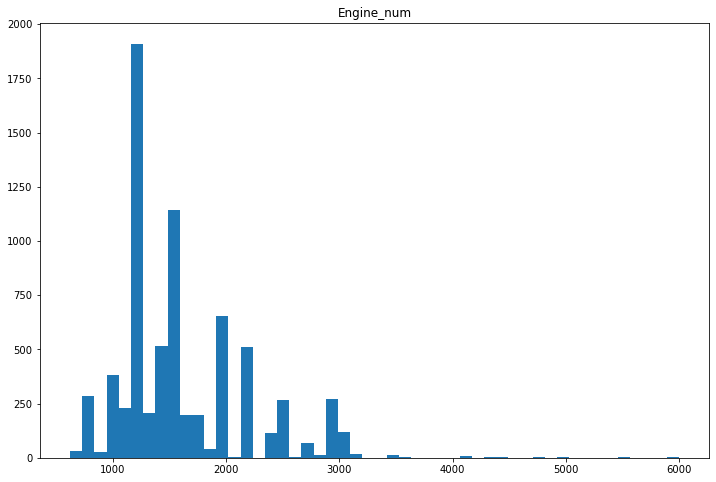

0


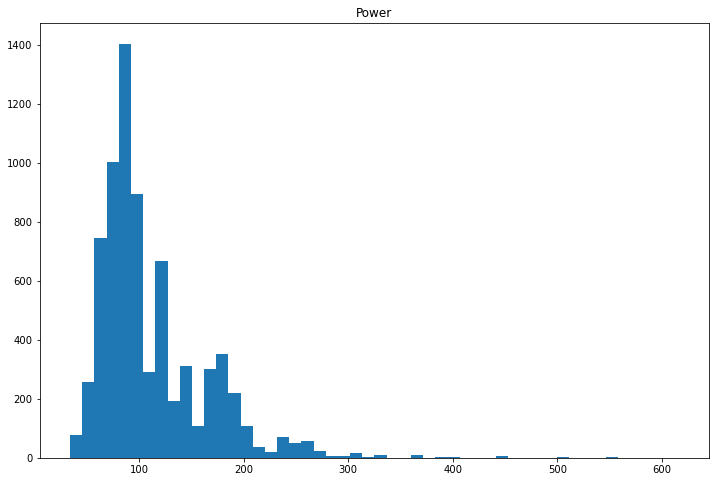

0


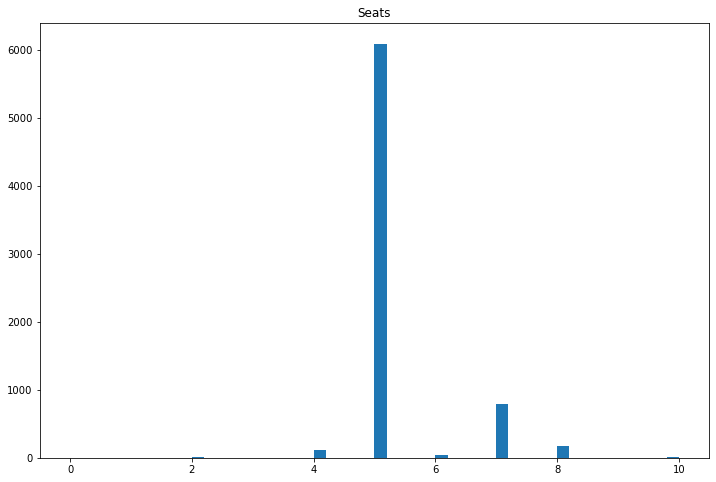

1


<IPython.core.display.Javascript object>

In [65]:
cols_to_log = [
    "Year",
    "Kilometers_Driven",
    "Mileage_num",
    "Engine_num",
    "Power",
    "Seats",
]

# print histogram for each column
for colname in cols_to_log:
    plt.hist(df[colname], bins=50)
    plt.title(colname)
    plt.show()
    print(np.sum(df[colname] <= 0))  # check for values <0

**Observations**

- `Year`, `Engine_num`, `Power`and `Kilometer_Driven` have strong skewness.
- `Mileage_num` and`Seats`  look fairly nicely normally distributed.

Time to consider other transformations.  Another option is to use `np.arcsinh` which is like the log for large values but handles negative and zero values as well.

**Testing Transformations**

'Year'

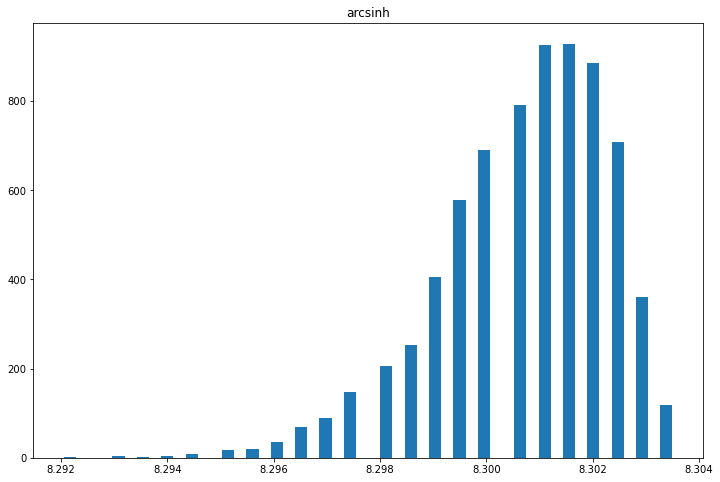

'Kilometers_Driven'

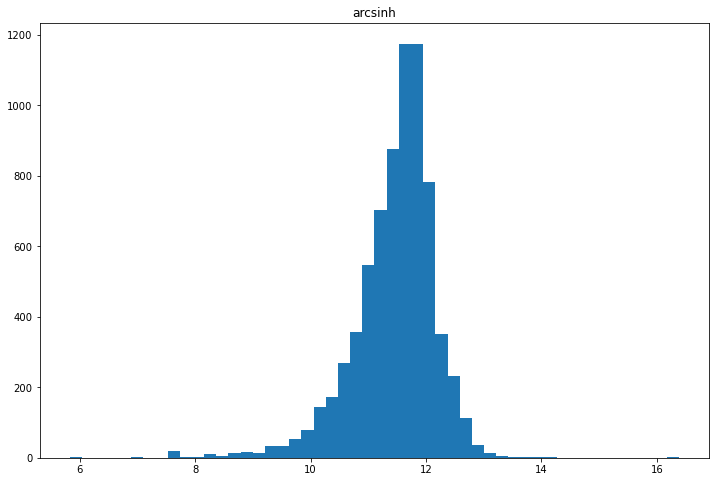

'Power'

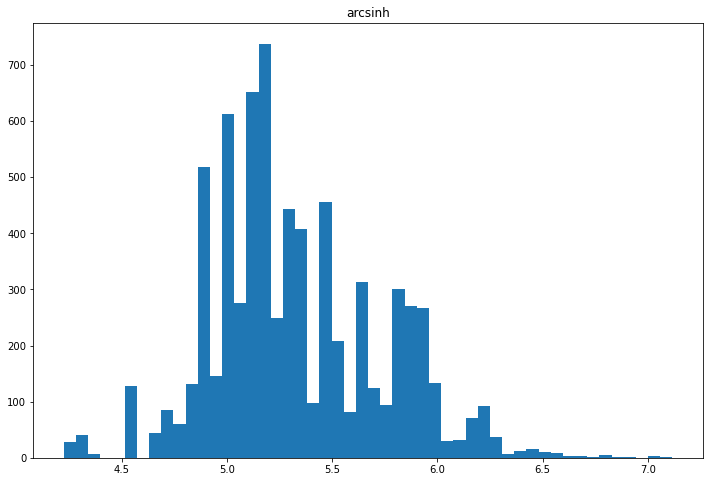

'Engine_num'

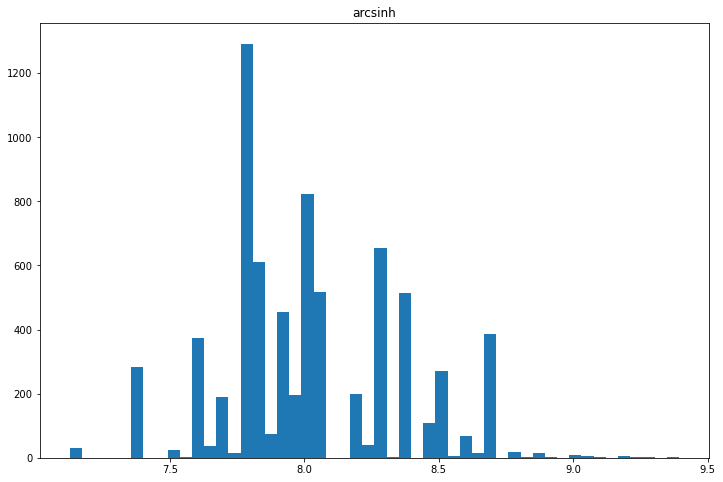

'Mileage_num'

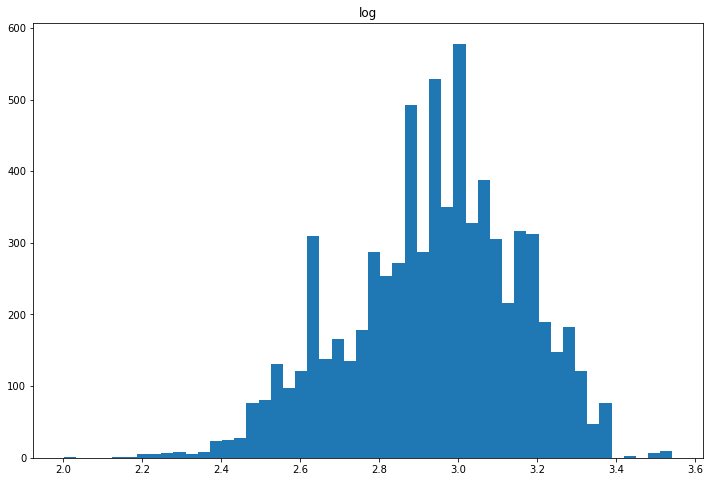

'Seats'

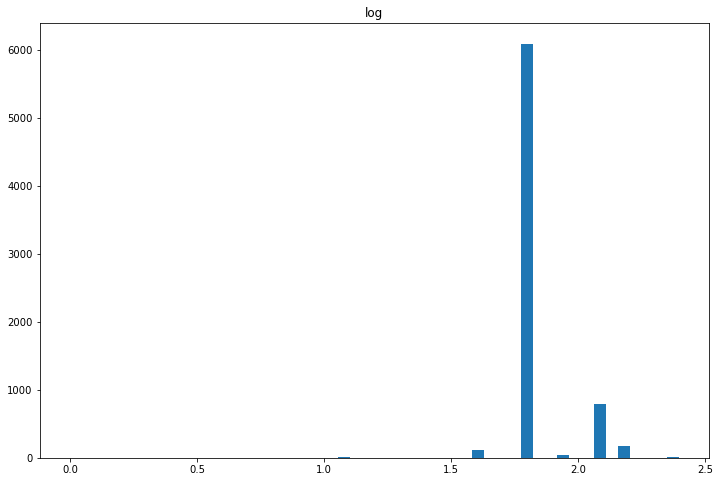

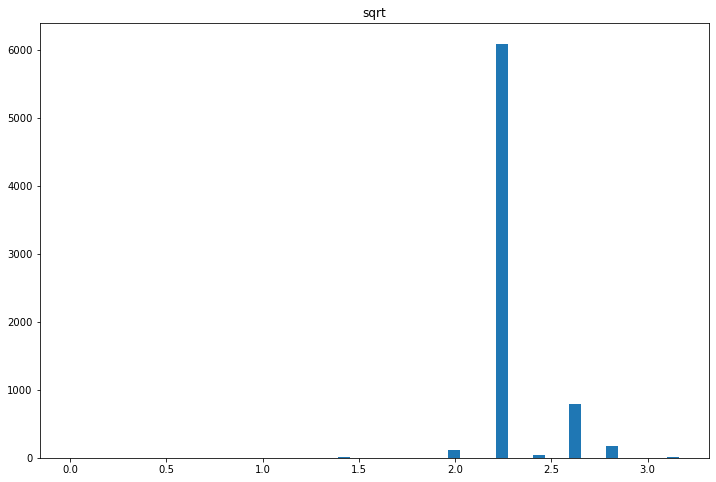

<IPython.core.display.Javascript object>

In [66]:
high_skew = ["Year", "Kilometers_Driven", "Power", "Engine_num"]
med_skew = ["Mileage_num", "Seats"]

for i in high_skew:

    # on higher skew
    plt.hist(np.arcsinh(df[i]), 50)
    display(i)
    plt.title("arcsinh")
    plt.show()

for i in med_skew:

    # try a regular log transform
    plt.hist(np.log(df[i] + 1), 50)
    display(i)
    plt.title("log")
    plt.show()


# on weaker skewness
plt.hist(np.sqrt(df["Seats"]), 50)
plt.title("sqrt")
plt.show()

**Observations**

**`Year` mean has moved closer to 0 and our standard deviation closer to 1.**

#### `Price`

Text(0.5, 1.0, 'Distribution of Price')

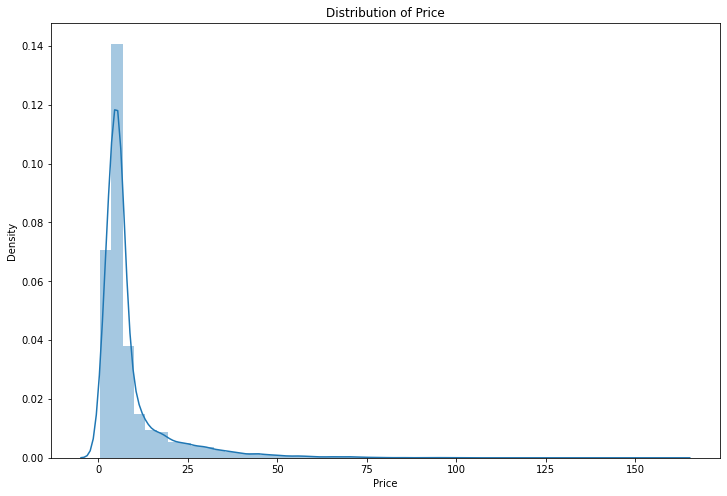

<IPython.core.display.Javascript object>

In [67]:
# look at the distribution
sns.distplot(df.Price).set_title("Distribution of Price")

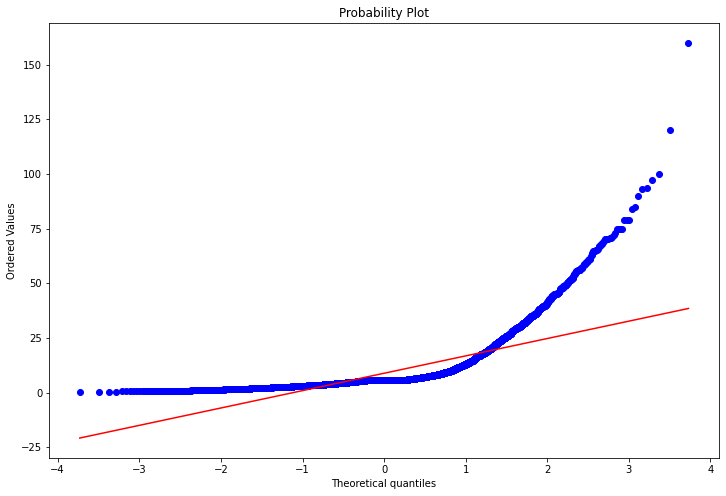

<IPython.core.display.Javascript object>

In [68]:
# create probability plot
stats.probplot(df.Price, dist="norm", plot=pylab)
plt.show()

**Observations**

- `Price` does not follow a normal distribution.
- The probability curve shows that it is not on a linear trend.

**Decision:** What would it look like if we transformed `Price` on a log-scale?

In [69]:
x_bar, sigma = norm.fit(df.Price)
print("\n mean = {:2f} and std-dev = {:2f}\n".format(x_bar, sigma))


 mean = 8.825997 and std-dev = 10.295087



<IPython.core.display.Javascript object>

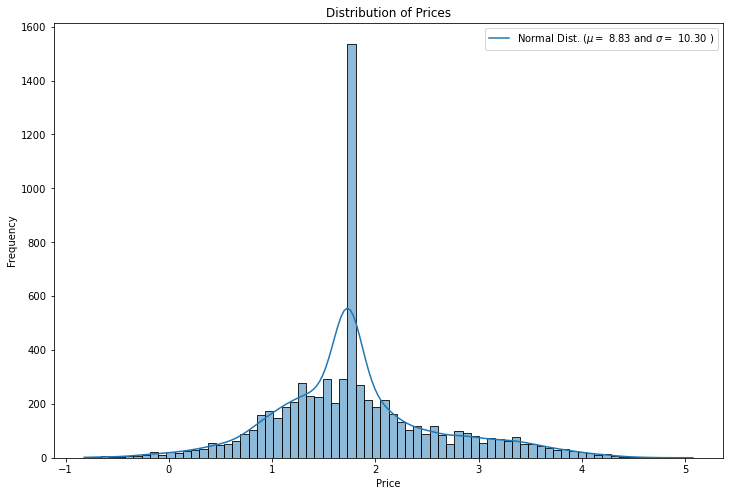

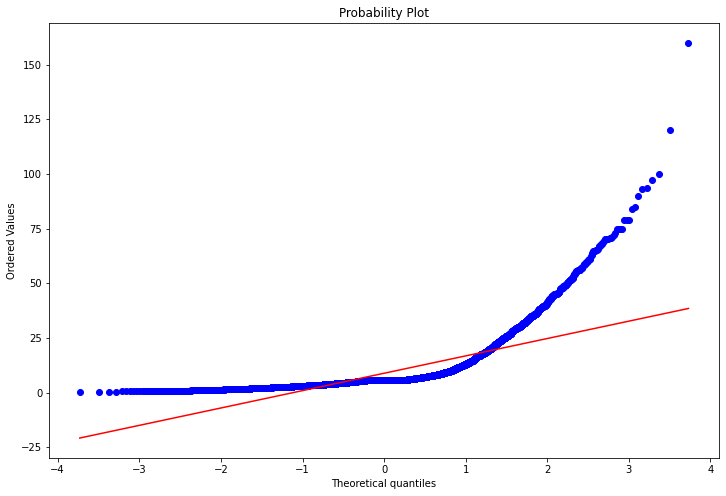

<IPython.core.display.Javascript object>

In [70]:
# plot the distribution with log-distribution
sns.histplot(np.log(df.Price), kde=True)
plt.title("log")

plt.legend(
    ["Normal Dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )".format(x_bar, sigma)],
    loc="best",
)
plt.ylabel("Frequency")
plt.title("Distribution of Prices")
plt.show()

# QQ plot
fig = plt.figure()
res = stats.probplot(df.Price, plot=plt)
plt.show()

**Observations:**
The log transformation decreases the scale of the distributions, even with the huge range of `Price`. It seems the outliers caused the log-transformed distributions to still be a bit skewed, but it is closer to normal than the original distribution.


In [71]:
# Log Transformation has definitely helped in reducing the skew
# Creating a new column with the transformed variable.
df["price_log"] = np.log(df["Price"])

<IPython.core.display.Javascript object>

### Outliers & Treatment

***Notes from GreatLearning:***

"An outlier is a data point that is distant from other similar points. 

Outliers in the data can distort predictions and affect the accuracy so it's important to flag them for review. This is especially the case with regression models.  

The challenge with outlier detection is determining if a point is truly a problem or simply a large value. If a point is genuine then it is very important to keep it in the data as otherwise we're removing the most interesting pdata points. Regardless, it is essential to understand their impact on our predictive models and statistics, and the extent to which a small number of outlying points are dominating the fit of the model (for example, the mean is much more sensitive to outliers than the median). It is left to the best judgement of the investigator to decide whether treating outliers is necessary and how to go about it. Knowledge of domain and impact of the business problem tend to drive this decision.
"

#### Detection using Z-Score

**Notes from GreatLearning:**

"The z-transformation used earlier can flag a point as being far away from the mean. If the data are normally distributed then we expect the vast majority of points to be within 3 standard deviations of the mean, which corresponds to a z score with an absolute value of at most 3. 

If the data are not normal, however, the situation is more complicated."

In [72]:
# get a sub-df of independent variables to transform
trans = df[["Year", "Kilometers_Driven", "Mileage_num", "Engine_num", "Power", "Seats"]]

<IPython.core.display.Javascript object>

Year


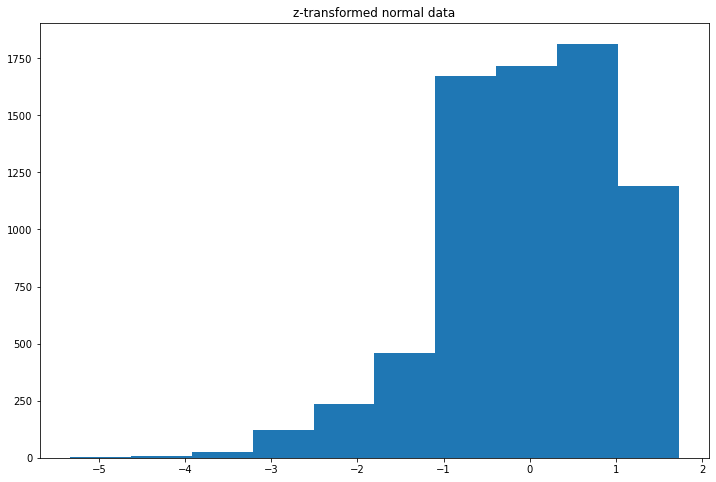

Kilometers_Driven


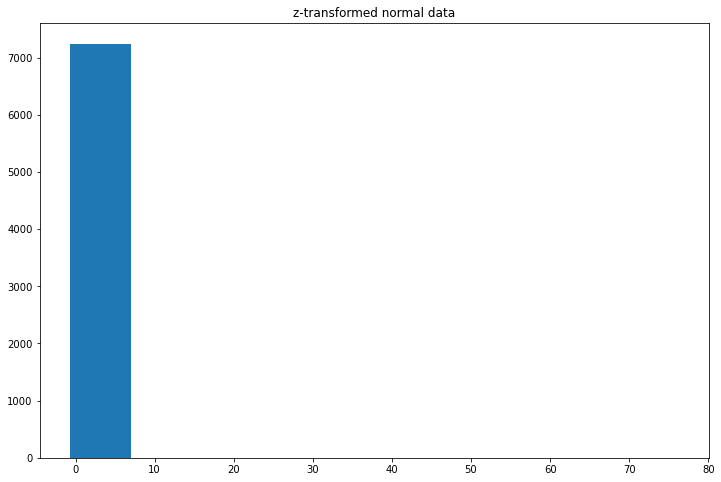

Mileage_num


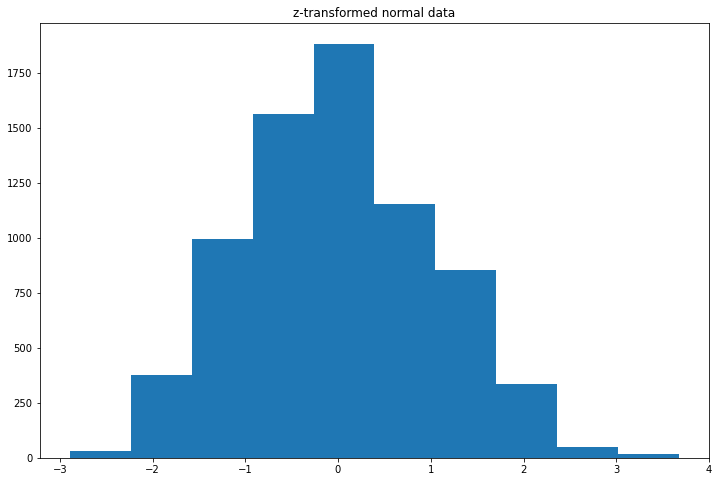

Engine_num


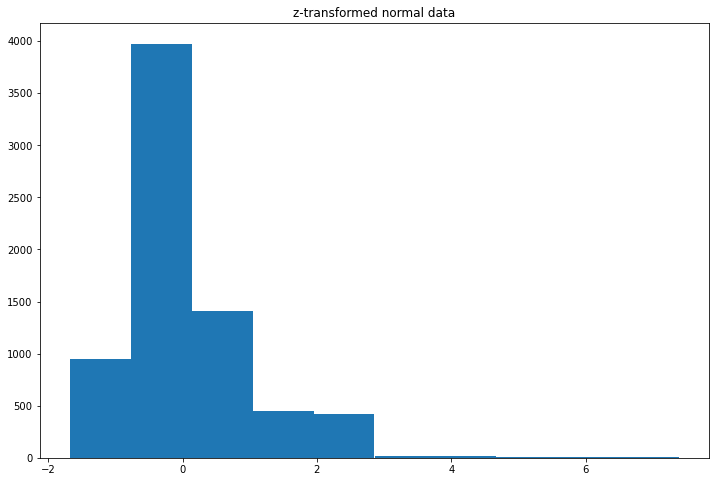

Power


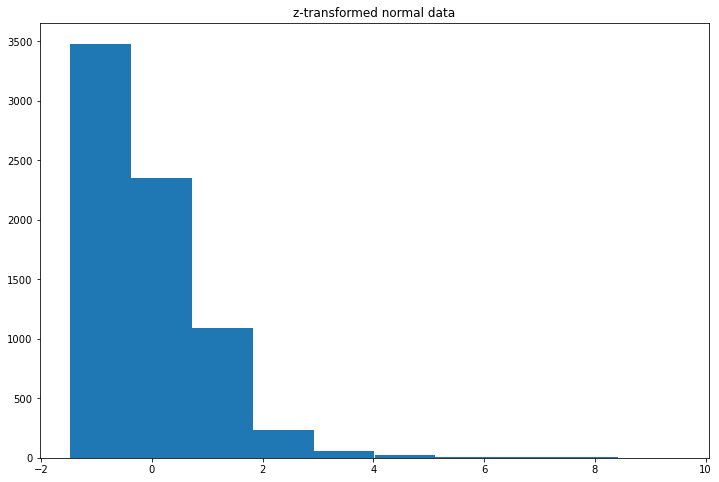

Seats


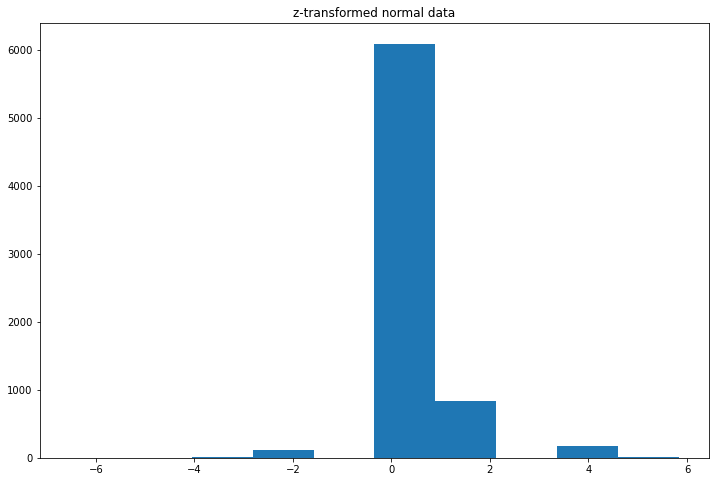

<IPython.core.display.Javascript object>

In [73]:
def z_transform(x):
    return (x - np.mean(x)) / np.std(x)

"""
for i in list(numerical_features):
    plt.hist(z_transform(df[i].values))
    plt.title('z-transformed normal data')
    plt.show()
"""
    
for (column_name, column_data) in trans.iteritems():
    plt.hist(z_transform(column_data))
    plt.title('z-transformed normal data')
    print(column_name)
    plt.show()


In [74]:
numerical_features = df.select_dtypes(include=["int64", "float64"])
# numerical_features

<IPython.core.display.Javascript object>

All of the points in each plot are drawn from the exact same distribution, so it's not fair to call any of the points outliers in the sense of there being bad data. 

It looks like every column tested has outliers using this method.

But depending on the distribution in question, we may have almost all of the z-scores between -3 and 3 or instead there could be extremely large values. 

In [75]:
# set parameters for -3 to +3 cut-off
upper = numerical_features.mean() + 3 * numerical_features.std()
lower = numerical_features.mean() - 3 * numerical_features.std()

# create a new dataframe with those outliers
out_df = df[(numerical_features < upper) & (numerical_features > lower)]
display(out_df)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,
0,NaN,NaN,2010.00,72000.00,NaN,NaN,NaN,58.16,5.00,1.75,998.00,26.60,0.56
1,NaN,NaN,2015.00,41000.00,NaN,NaN,NaN,126.20,5.00,12.50,1582.00,19.67,2.53
2,NaN,NaN,2011.00,46000.00,NaN,NaN,NaN,88.70,5.00,4.50,1199.00,18.20,1.50
3,NaN,NaN,2012.00,87000.00,NaN,NaN,NaN,88.76,7.00,6.00,1248.00,20.77,1.79
4,NaN,NaN,2013.00,40670.00,NaN,NaN,NaN,140.80,5.00,17.74,1968.00,15.20,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7248,NaN,NaN,2011.00,89411.00,NaN,NaN,NaN,103.60,5.00,5.64,1598.00,20.54,1.73
7249,NaN,NaN,2015.00,59000.00,NaN,NaN,NaN,103.60,5.00,5.64,1197.00,17.21,1.73
7250,NaN,NaN,2012.00,28000.00,NaN,NaN,NaN,63.10,5.00,5.64,1461.00,23.08,1.73


<IPython.core.display.Javascript object>

Now let's create a new column to do a z-score test with.

In [76]:
for i in numerical_features:
    df["zscore"] = (df[i] - df[i].mean()) / df[i].std()
df.head(4)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log,zscore
S.No.,,,,,,,,,,,,,,
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,58.16,5,1.75,998,26.60,0.56,-1.57
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,126.20,5,12.50,1582,19.67,2.53,0.90
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,88.70,5,4.50,1199,18.20,1.50,-0.38
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,88.76,7,6.00,1248,20.77,1.79,-0.02


<IPython.core.display.Javascript object>

Now let's look for rows that would need to be cut using this method.

In [77]:
display(df[df["zscore"] > 3].shape)
display(df[df["zscore"] < -3].shape)

(31, 14)

(12, 14)

<IPython.core.display.Javascript object>

We would lose a total of 22 rows using this method. I'd rather go column by column so I will drop this column.

In [78]:
df.drop("zscore", inplace=True, axis=1)

<IPython.core.display.Javascript object>

#### Detection using IQR

In [79]:
# Function from GreatLearning
"""
Another way to flag points as outliers is to compute the IQR, 
which is the interval going from the 1st quartile to the 3rd quartile of the data in question, 
and then flag a point for investigation if it is outside 1.5 * IQR.
"""


def frac_outside_1pt5_IQR(x):
    length = 1.5 * np.diff(np.quantile(x, [0.25, 0.75]))
    return np.mean(np.abs(x - np.median(x)) > length)


for (column_name, column_data) in numerical_features.iteritems():

    print(column_name, frac_outside_1pt5_IQR(column_data.to_numpy()) * 100)

Year 3.4487515519381984
Kilometers_Driven 6.387087874189544
Power 9.049524072285832
Seats 15.90564215753897
Price 16.73334253000414
Engine_num 7.366533314939992
Mileage_num 2.552076148434267
price_log 15.422816940267623


<IPython.core.display.Javascript object>

`Seats`  and `Price` data has over 15% of the sample is flagged as outliers using this method.

#### Detection using 4* Interquartile range method: Hamel Method

In [80]:
for (column_name, column_data) in numerical_features.iteritems():
    quartiles = np.quantile(df[column_name][df[column_name].notnull()], [0.25, 0.75])
    column_name_4iqr = 4 * (quartiles[1] - quartiles[0])
    print(
        "\n",
        column_name,
        f"Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 4*IQR = {column_name_4iqr}",
    )

    # create a dataframe of each place where the difference between value and median for that variable are greater than 4*IQR for that variable
    outlier_column_name = df.loc[
        np.abs(df[column_name] - df[column_name].median()) > column_name_4iqr,
        column_name,
    ]

    # check len and values for each
    print("\n", outlier_column_name)


 Year Q1 = 2011.0, Q3 = 2016.0, 4*IQR = 20.0

 Series([], Name: Year, dtype: int64)

 Kilometers_Driven Q1 = 34000.0, Q3 = 73000.0, 4*IQR = 156000.0

 S.No.
29       262000
77       230000
181      216000
340      775000
358      620000
838      215000
1068     225000
1101     248000
1442     231673
1528     299322
1766     220000
1846     255000
1860     720000
1975     282000
2267     215750
2328    6500000
2346     234000
2823     480000
2988     240000
3092     480000
3649     300000
3713     232000
3894     250000
4491     445000
4719     250000
4792     242000
5647     227000
5800     210000
5834     250000
6919     290000
6921     350000
Name: Kilometers_Driven, dtype: int64

 Power Q1 = 77.0, Q3 = 138.03, 4*IQR = 244.12

 S.No.
70     500.00
134    362.07
148    444.00
152    362.90
418    367.00
589    364.90
1930   364.90
2095   362.07
2100   550.00
2978   394.30
3132   340.00
3341   402.00
4061   444.00
4342   364.90
4451   395.00
4627   450.00
4691   421.00
4722   387.30
4

<IPython.core.display.Javascript object>

**Observations**

1. `Year`,`Engine` and `Power` is not generating a series to view the values and so has none outside in the 4*IQR
2. `Kilometers_Driven`  has relatively few outliers and could simply drop them or replace with nan.
3. `Price ` and `Seats` have many outliers in this range and need to be dealt with without dropping or replacing with nans on all values.

#### Visualizing Outliers

'Year'

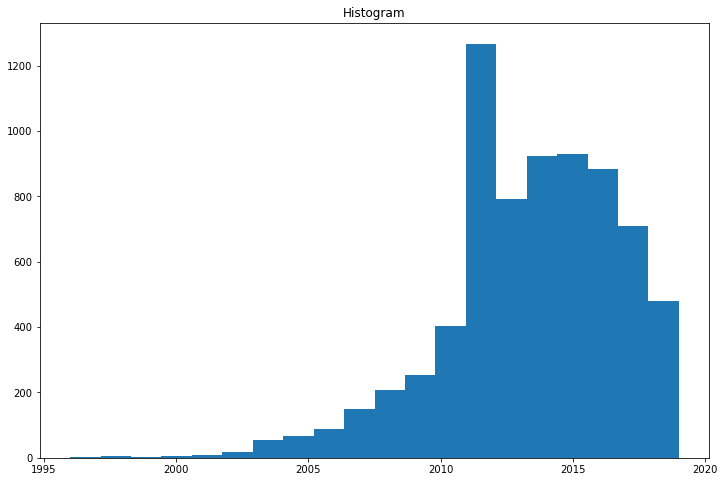

'Year'

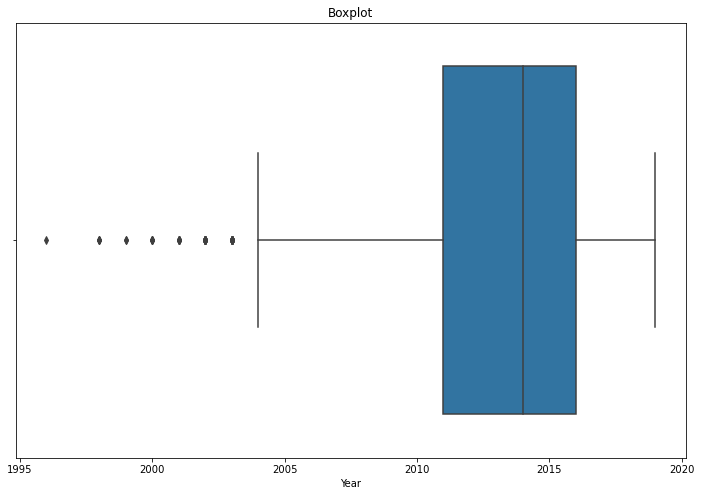

'Kilometers_Driven'

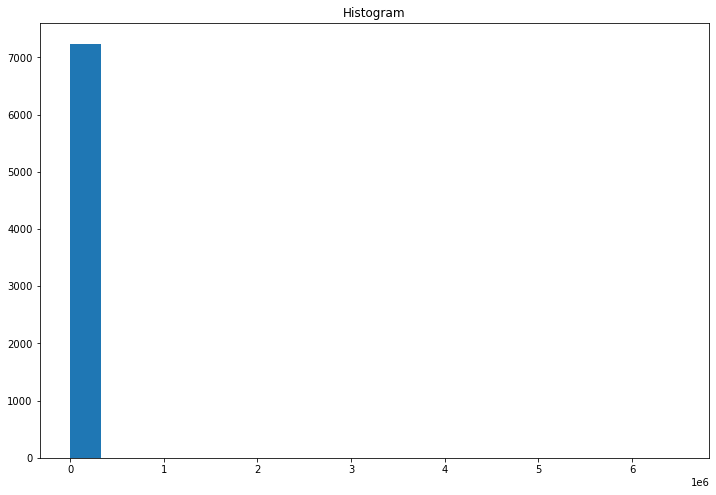

'Kilometers_Driven'

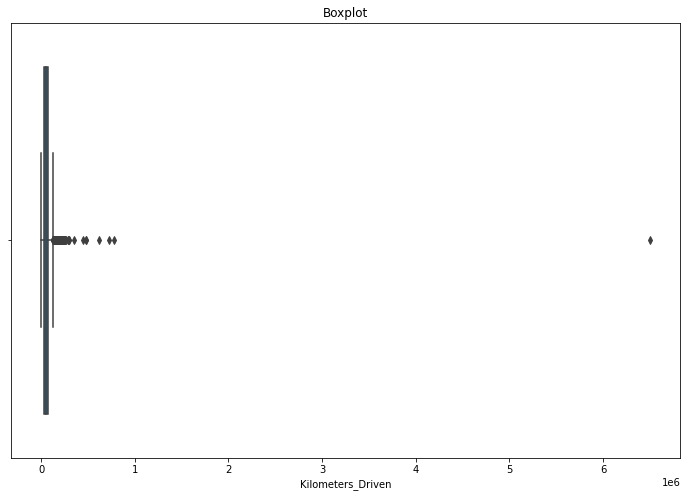

'Power'

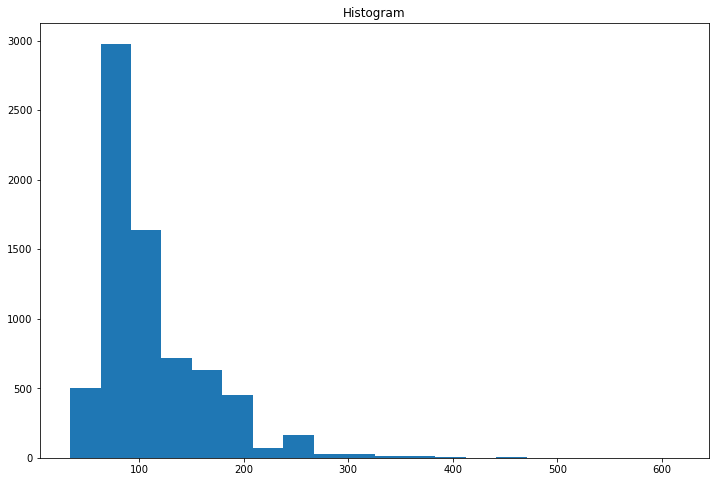

'Power'

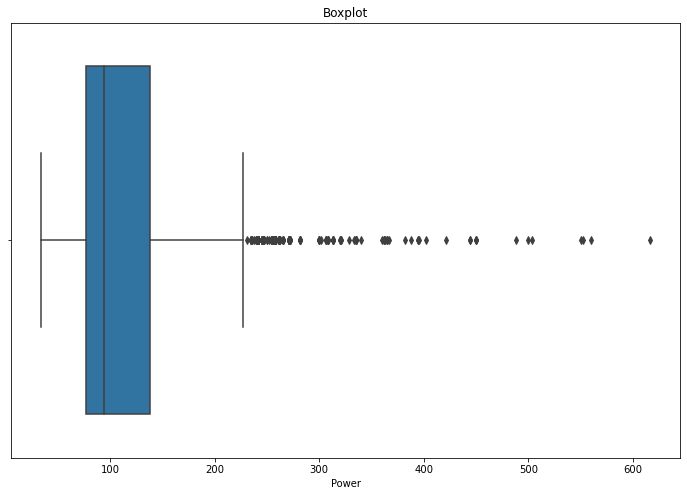

'Seats'

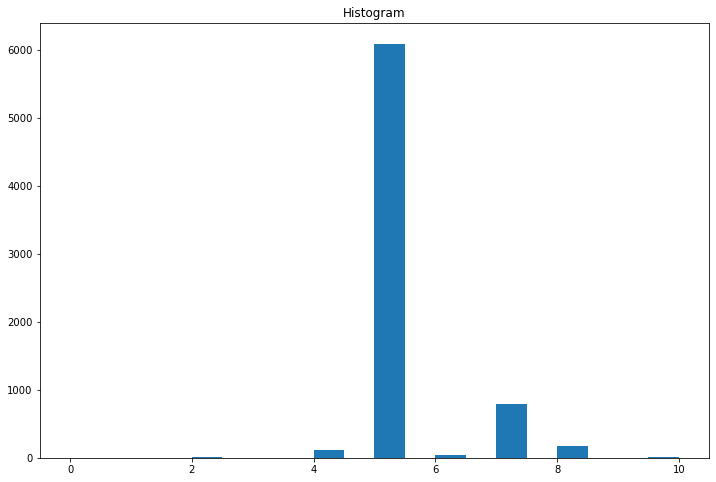

'Seats'

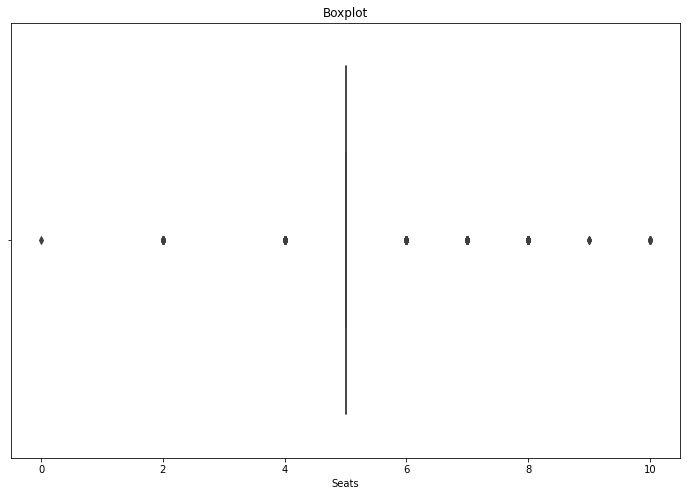

'Price'

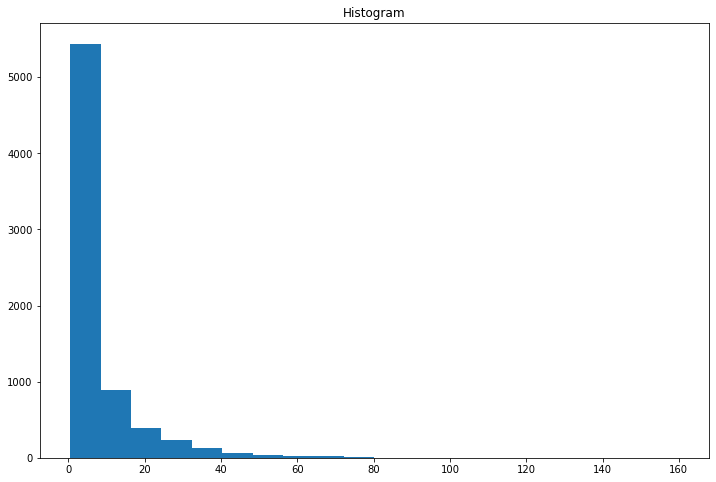

'Price'

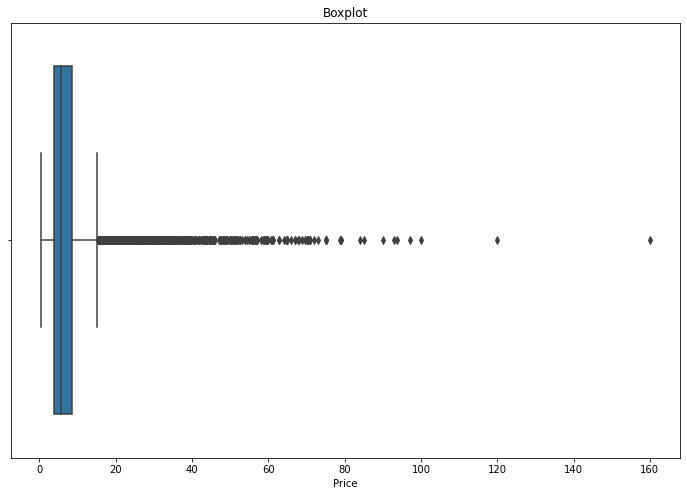

'Engine_num'

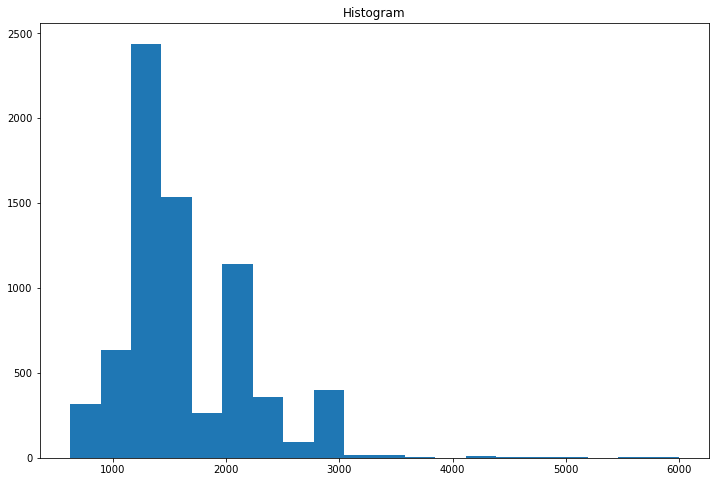

'Engine_num'

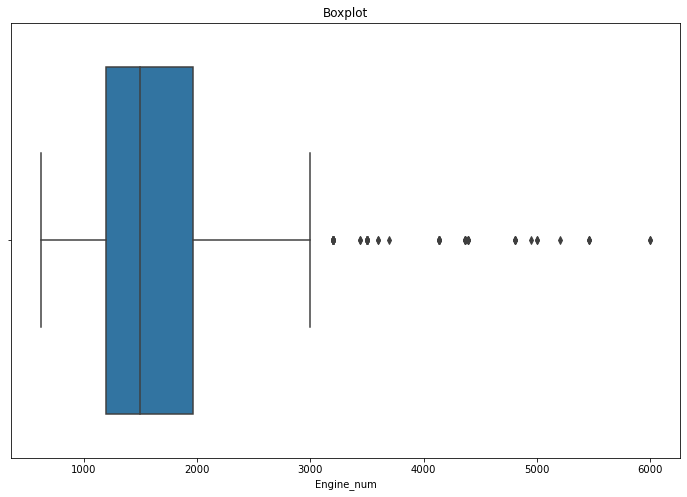

'Mileage_num'

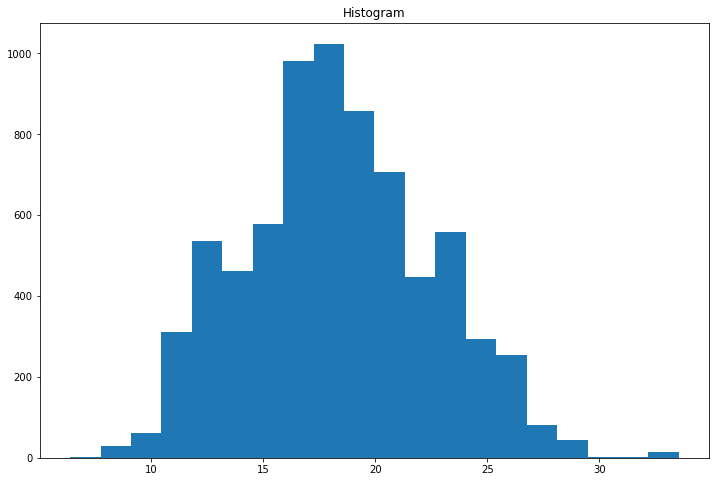

'Mileage_num'

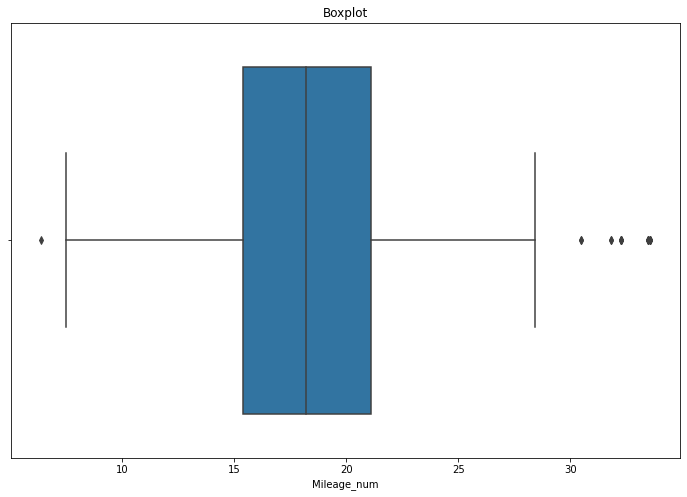

'price_log'

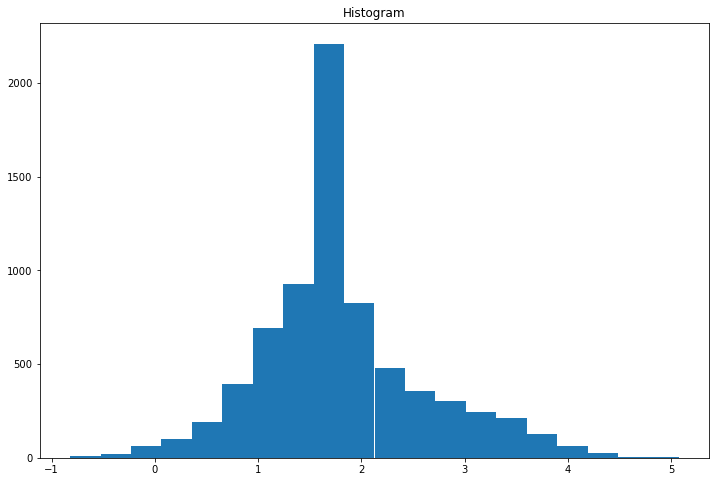

'price_log'

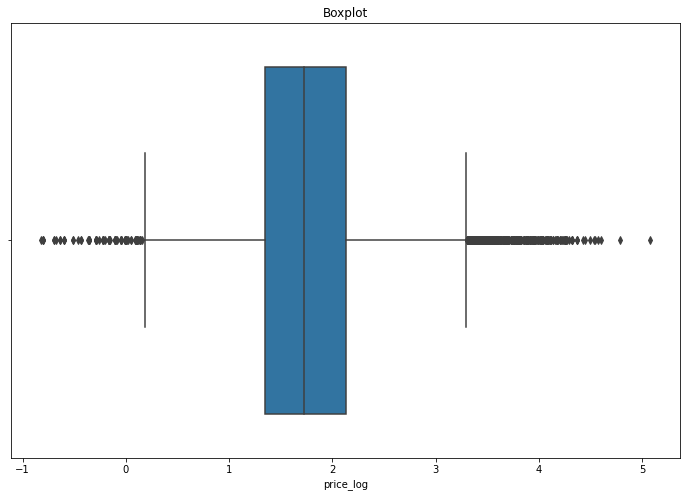

<IPython.core.display.Javascript object>

In [81]:
for (column_name, column_data) in numerical_features.iteritems():
    plt.hist(column_data, 20)
    plt.title("Histogram")
    display(column_name)
    plt.show()

    sns.boxplot(column_data)
    plt.title("Boxplot")
    display(column_name)
    plt.show()

`Kilometers_Driven`, `Power`, `Price` "have a lot of values that are flagged as suspicious by the boxplot, but in the histogram we can see that the distribution is skewed so these points aren't inconsistent with the overall distribution of the data. Nevertheless, having a heavy tail means we might want to consider statistics less sensitive to large values, so e.g. the median may be a better measure of central tendancy."

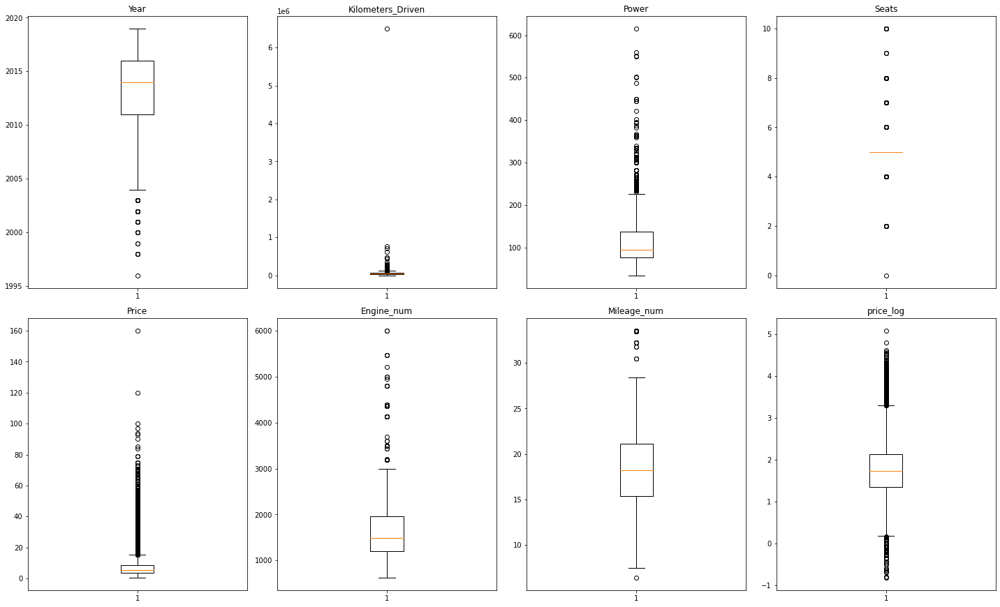

<IPython.core.display.Javascript object>

In [82]:
# let's plot the boxplots of all columns to check for outliers
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_features):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

Let's check outliers against the target variable and see where they are. We see `price`, `Kilometers_Driven` and `Power` have heavy outliers. And some exist in every column.

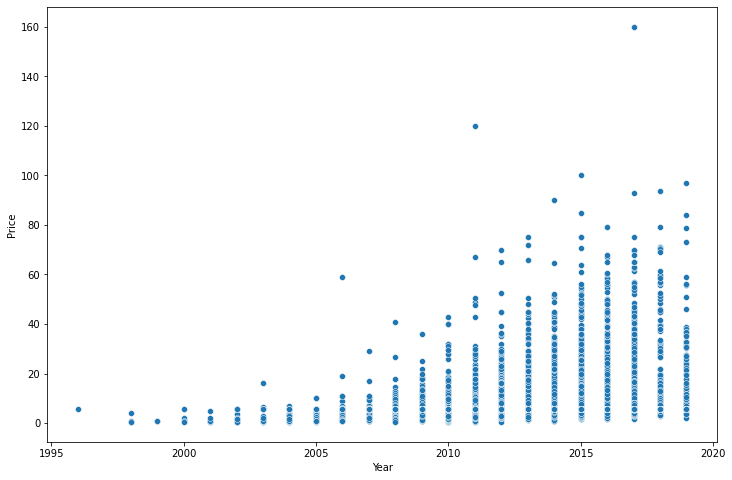

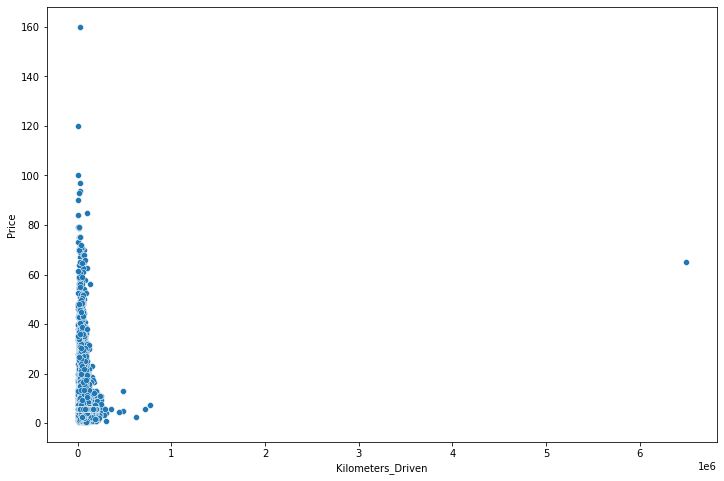

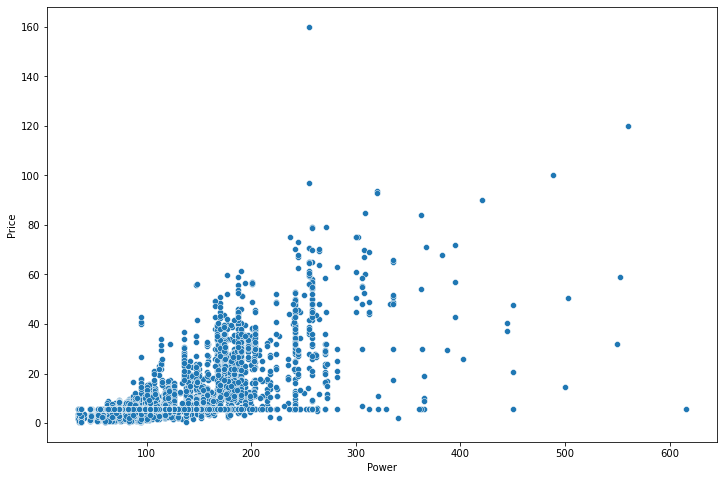

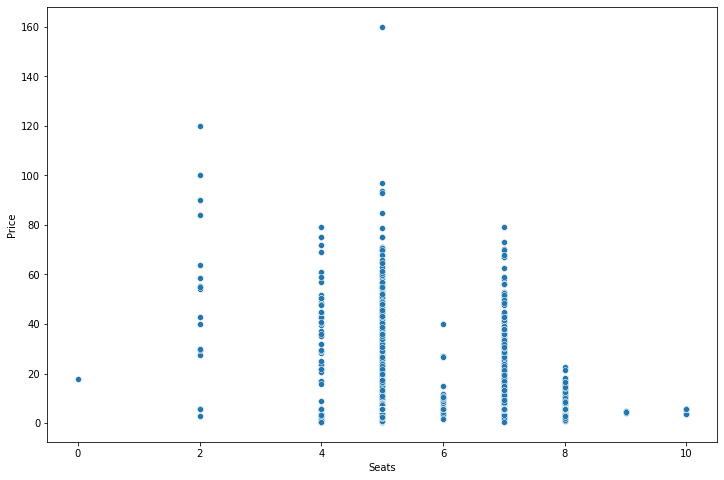

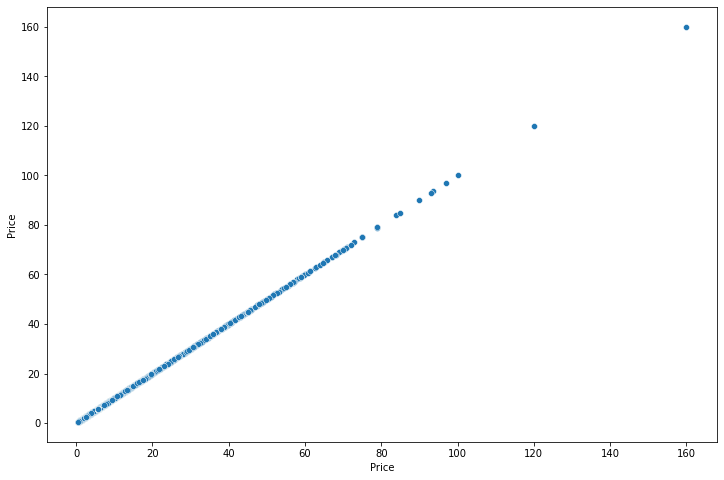

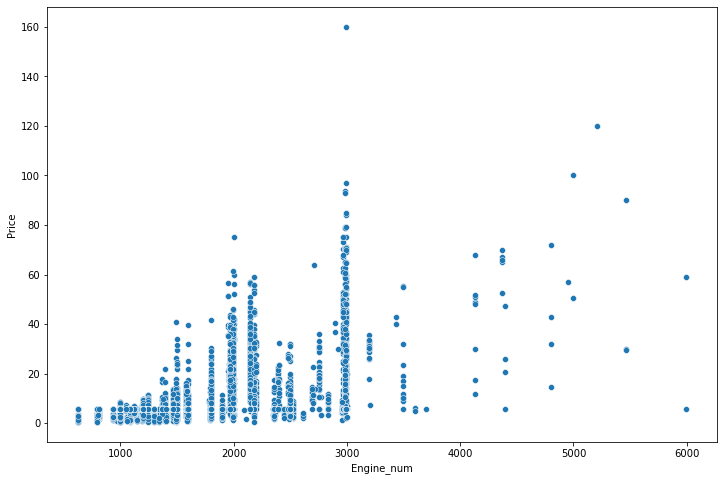

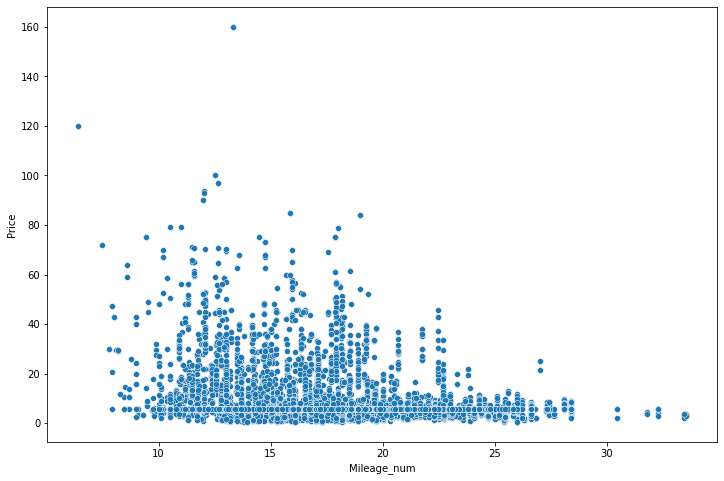

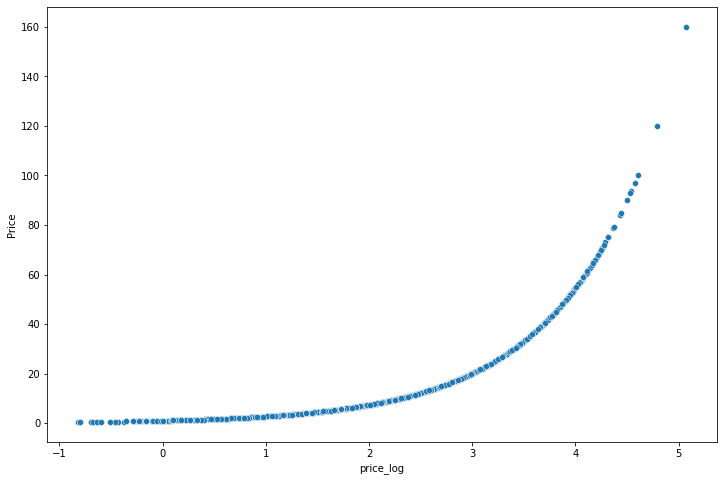

<IPython.core.display.Javascript object>

In [83]:
# plot indepdents against dependent
for i, variable in enumerate(numerical_features):
    sns.scatterplot(x=df[variable], y=df.Price)
    plt.show()

**Observations**

`Year`, `Seats`, `Mileage` has outliers in the upper and lower left regions.
`Kilometers_Driven`  is different with outliers on either end.

* There are many upper-end outliers in `Power`, `Price`, and `Engine`.

* "We will treat these outliers as these might adversely affect the predictive power of linear model. However, in real life, these outliers may be due to non-linear pattern in the data or can be important information. Sometimes outliers in the independent variable can adversely impact the linear model. This can be checked by building the model with and without outliers and comparing the model performances."

**Decision**:

For the sake of trying to make the data fit a normal distribution more easily, I will go ahead and drop outliers from these keys columns.

#### Treatment

***Notes from GreatLearning:***

"If we decide that we do actually have some problematic outliers, we have a few options.

- If the point seems truly nonsensical it may be best to treat it as missing

- Alternatively, we could drop that observation or we could use statistics that are robust to outliers

- Could replace with the max value from the column or a string value

It's often a good idea to examine the sensitivity to outliers by running an analysis with and without them. If they are because of the types of data then don't drop. But statistically, it is better to cut them off. "

Let's examine some of the maximum values that stand out as outliers. They could be data entry errors.

Extreme values in `Kilometers_Driven`.

<AxesSubplot:xlabel='Kilometers_Driven'>

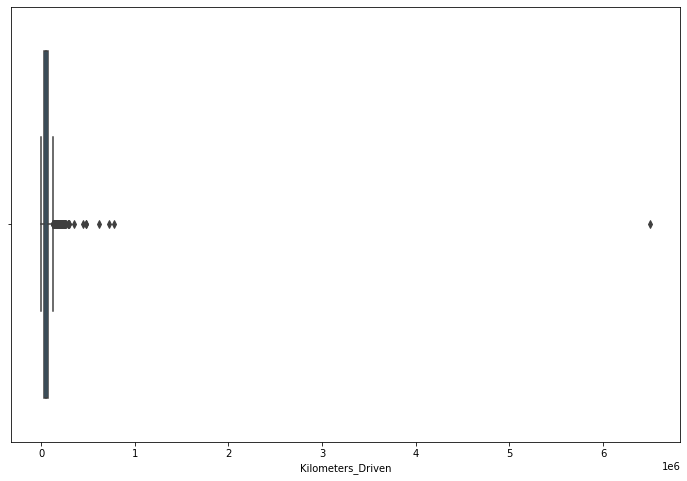

<IPython.core.display.Javascript object>

In [84]:
# box plot
sns.boxplot(df.Kilometers_Driven)

In [85]:
# view the highest and lowest values
df[~(df["Kilometers_Driven"] < 750000)]  # | (df["Kilometers_Driven"] > 41000)]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,
340,Skoda Octavia Ambition Plus 2.0 TDI AT,Kolkata,2013,775000,Diesel,Automatic,First,141.00,5,7.50,1968,19.30,2.01
2328,BMW X5 xDrive 30d M Sport,Chennai,2017,6500000,Diesel,Automatic,First,258.00,5,65.00,2993,15.97,4.17


<IPython.core.display.Javascript object>

650k KM doesn't make sense in 4 year span. so we'll drop it.

In [86]:
# drop the high values by row
df.drop(labels=[2328], axis=0, inplace=True)

<IPython.core.display.Javascript object>

Check the drop.

In [87]:
# view the high values
df[~(df["Kilometers_Driven"] < 750000)]  # | (df["Kilometers_Driven"] > +15)]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,
340,Skoda Octavia Ambition Plus 2.0 TDI AT,Kolkata,2013,775000,Diesel,Automatic,First,141.00,5,7.50,1968,19.30,2.01


<IPython.core.display.Javascript object>

Fixing extreme values in `Seats`

In [88]:
df.sort_values(by=["Seats"], ascending=True)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,
3999,Audi A4 3.2 FSI Tiptronic Quattro,Hyderabad,2012,125000,Petrol,Automatic,First,94.34,0,18.00,3197,10.50,2.89
5781,Lamborghini Gallardo Coupe,Delhi,2011,6500,Petrol,Automatic,Third,560.00,2,120.00,5204,6.40,4.79
4722,Mercedes-Benz SL-Class SL 500,Kolkata,2010,35000,Petrol,Automatic,First,387.30,2,29.50,5461,8.10,3.38
6842,Nissan 370Z AT,Kolkata,2012,14850,Petrol,Automatic,First,328.50,2,5.64,3696,10.00,1.73
926,Porsche Cayman 2009-2012 S,Hyderabad,2010,10000,Petrol,Manual,First,94.34,2,40.00,3436,9.00,3.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1907,Toyota Qualis FS B3,Bangalore,2002,63000,Diesel,Manual,Third,75.00,10,3.65,2446,13.10,1.29
2267,Toyota Qualis RS E2,Pune,2004,215750,Diesel,Manual,Second,94.34,10,3.50,2446,18.20,1.25
2575,Chevrolet Tavera LS B3 10 Seats BSIII,Hyderabad,2015,120000,Diesel,Manual,First,80.00,10,5.50,2499,14.80,1.70


<IPython.core.display.Javascript object>

Here we will drop the 0 value in `Seats` which is likely a data-entry error.

In [89]:
# drop the high value
df.drop(labels=3999, axis=0, inplace=True)

<IPython.core.display.Javascript object>

In [90]:
# sort df by column
df.sort_values(by=["Seats"], ascending=True)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,
5781,Lamborghini Gallardo Coupe,Delhi,2011,6500,Petrol,Automatic,Third,560.00,2,120.00,5204,6.40,4.79
6960,Mercedes-Benz SLC 43 AMG,Coimbatore,2018,18338,Petrol,Automatic,First,362.07,2,5.64,2996,19.00,1.73
1078,Porsche Boxster S tiptronic,Kolkata,2015,10512,Petrol,Automatic,First,265.00,2,64.00,2706,8.60,4.16
2305,Porsche Cayman 2009-2012 S tiptronic,Mumbai,2011,8000,Petrol,Automatic,First,94.34,2,43.00,3436,9.00,3.76
5919,Jaguar F Type 5.0 V8 S,Hyderabad,2015,8000,Petrol,Automatic,First,488.10,2,100.00,5000,12.50,4.61
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6875,Toyota Qualis FS B3,Pune,2002,119613,Diesel,Manual,Second,75.00,10,5.64,2446,13.10,1.73
814,Toyota Qualis FS B2,Pune,2004,77757,Diesel,Manual,Second,75.00,10,3.50,2446,13.10,1.25
1907,Toyota Qualis FS B3,Bangalore,2002,63000,Diesel,Manual,Third,75.00,10,3.65,2446,13.10,1.29


<IPython.core.display.Javascript object>

In [91]:
# id row where Seats = 0
df[df.Seats == 0.00]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,


<IPython.core.display.Javascript object>

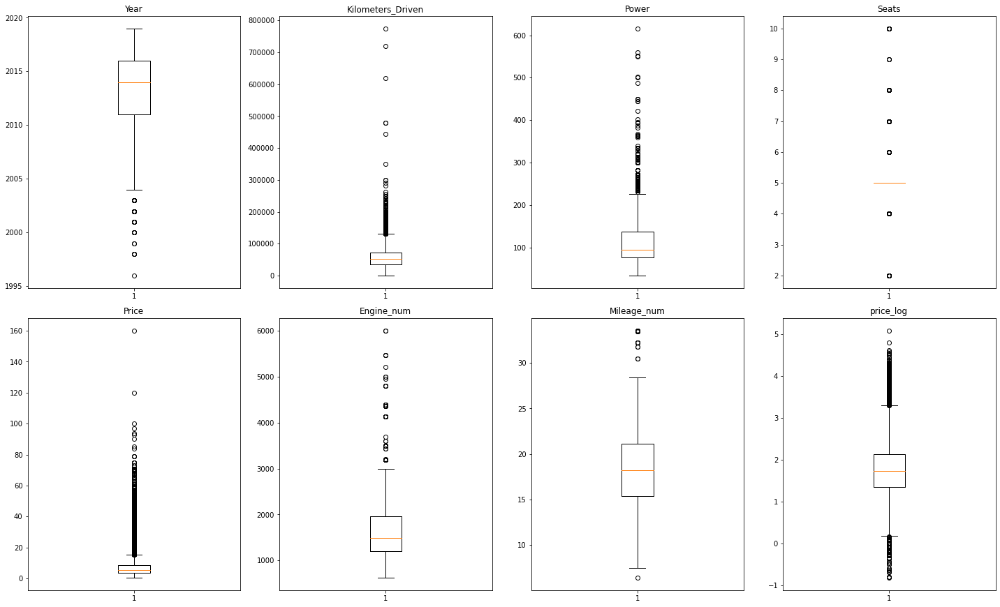

<IPython.core.display.Javascript object>

In [92]:
# let's look at box plot to see if outliers have been treated or not
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_features):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

`Price`

**Decision**:

Without having more information about the target market for this business its hard to decide whether to remove the highest price Used Cars over 150Lahks. I imagine in many cases they are purchased new and not used. I am only losing ~1% of the dataset which seems reasonable. For the sake the modeling we are doing here and the need to normalize it, I will drop them.

In [93]:
# check the drop
df[df.Price >= 150.00]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log
S.No.,,,,,,,,,,,,,
4079,Land Rover Range Rover 3.0 Diesel LWB Vogue,Hyderabad,2017,25000,Diesel,Automatic,First,255.00,5,160.00,2993,13.33,5.08


<IPython.core.display.Javascript object>

In [94]:
# drop rows
df.drop(df[df.Price >= 150.00].index, inplace=True)

<IPython.core.display.Javascript object>

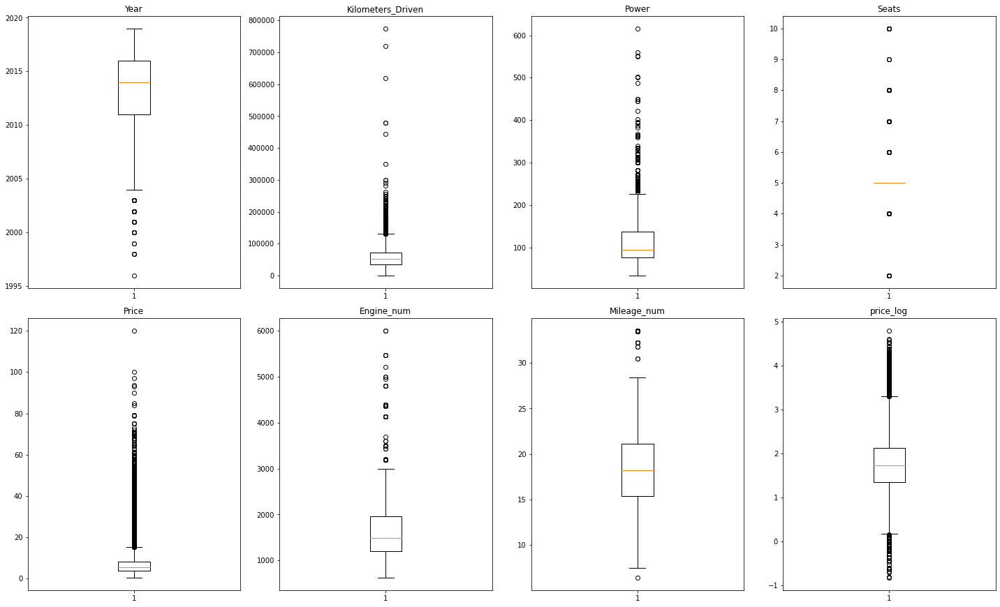

<IPython.core.display.Javascript object>

In [95]:
# let's look at box plot to see if outliers have been treated or not
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_features):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

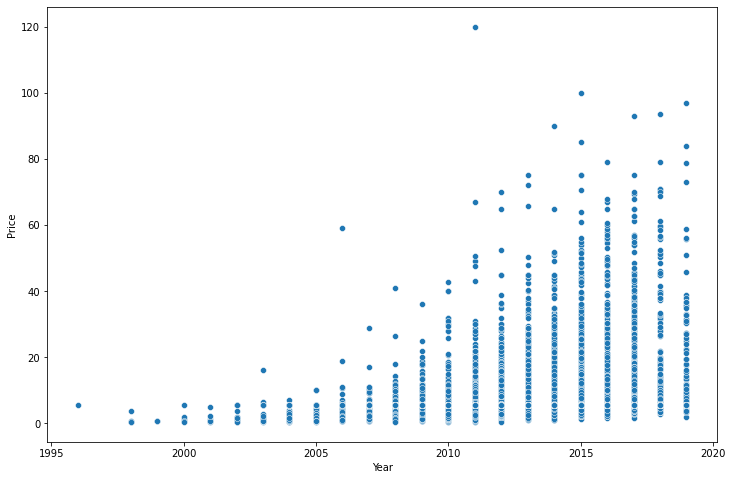

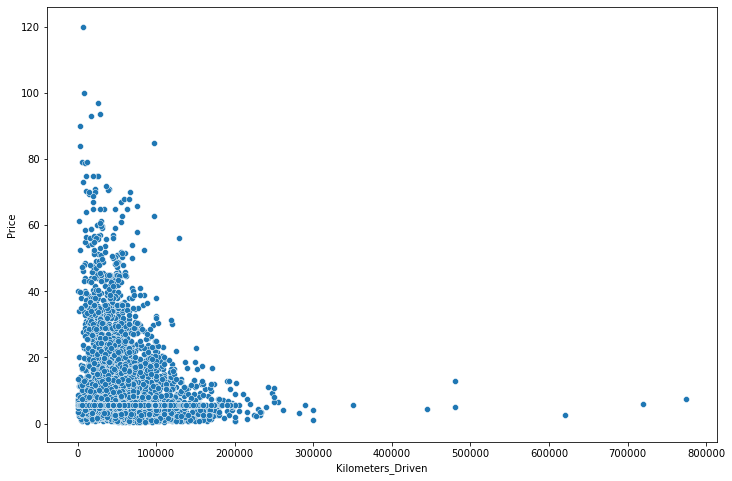

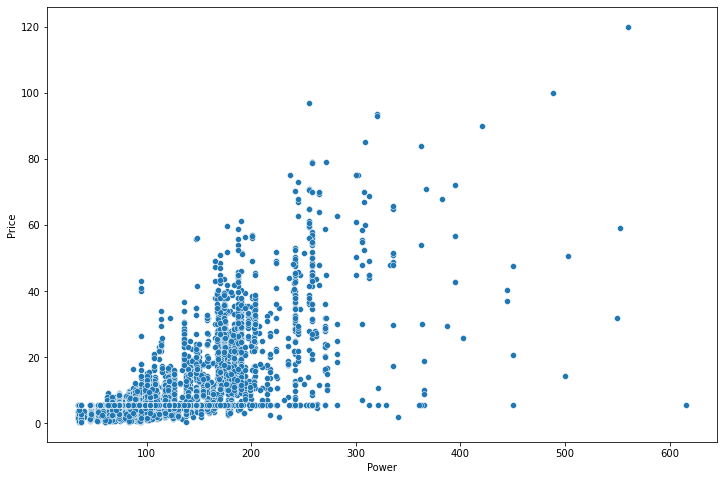

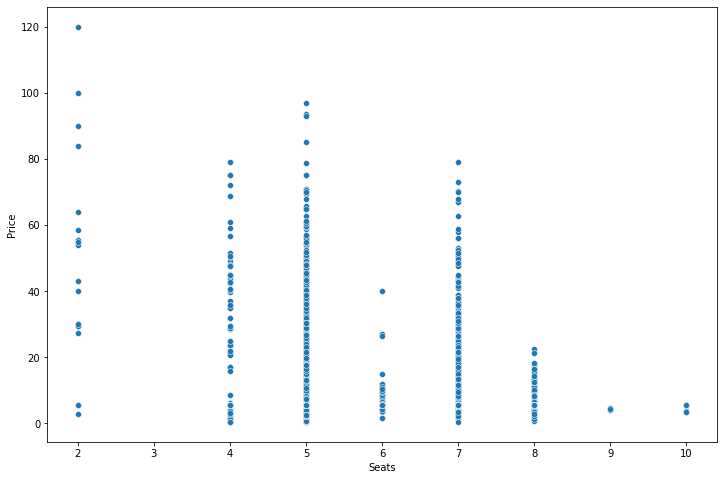

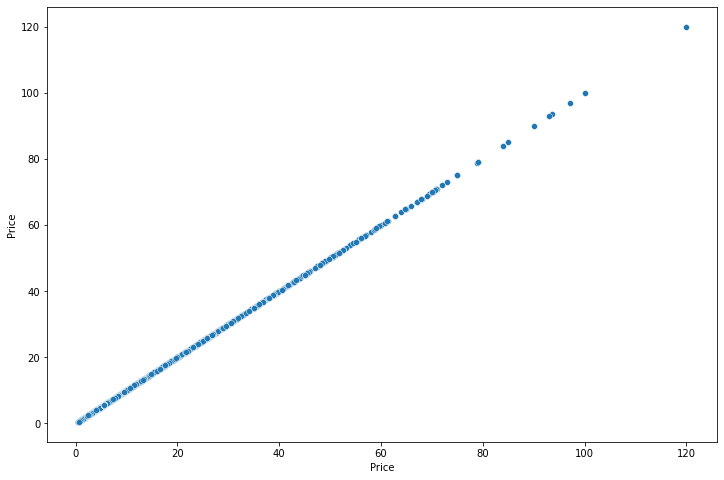

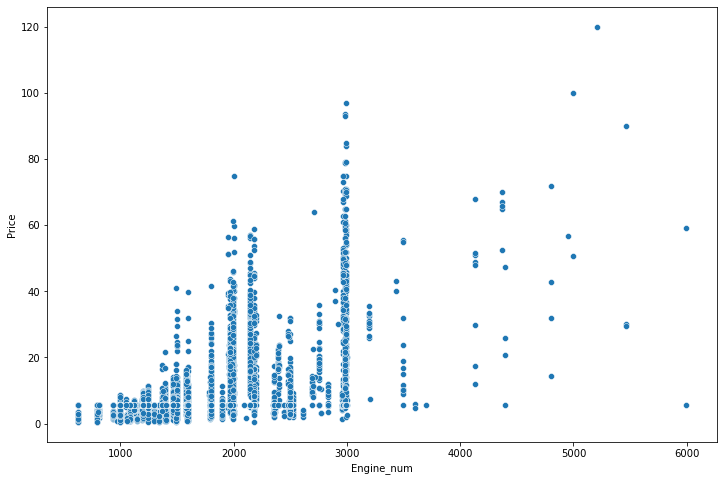

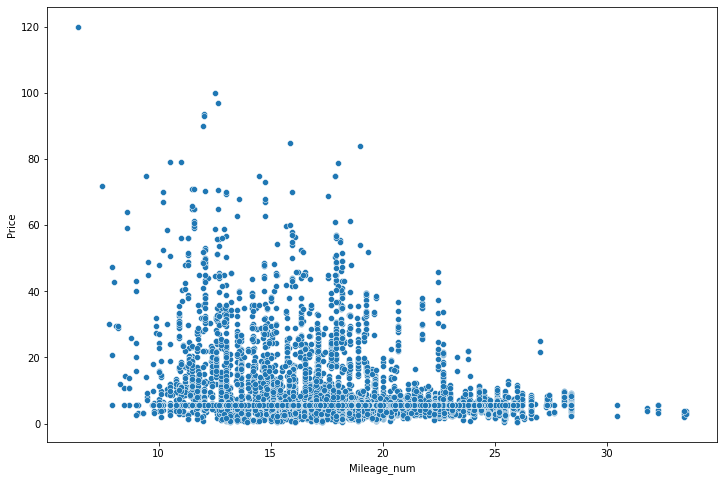

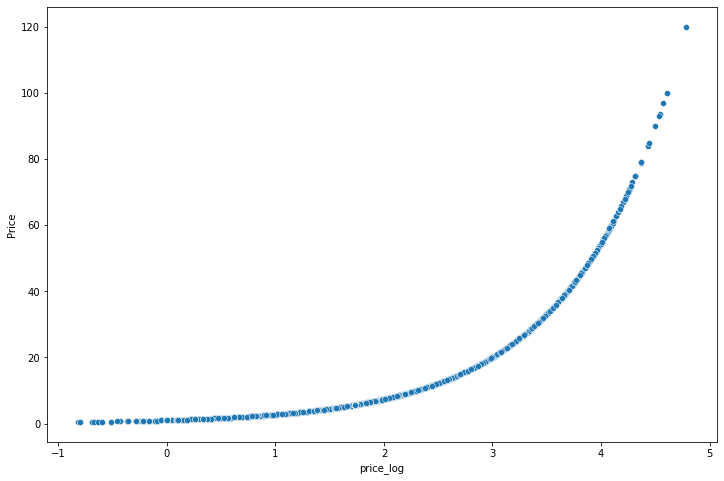

<IPython.core.display.Javascript object>

In [96]:
# plot indepdents against dependent
for i, variable in enumerate(numerical_features):
    sns.scatterplot(x=df[variable], y=df.Price)
    plt.show()

In [97]:
# get the size of the current df vs the original
display(len(df))
display("retained", (len(df) / 7253) * 100, "% of original data")

7246

'retained'

99.90348821177444

'% of original data'

<IPython.core.display.Javascript object>

**After treatment we only lost 5 records from our original 7253 records.**

**Observations**

 - After treating outliers we have a largely cleaned dataframe for extreme values.
 - After removing them there is still 98% of our original records  in place.
 - This should be a good set-up for distribution and skewness adjustments

## Feature Engineering

### `Names`

As a key feature against our target varialbe (`Price`), `Name` needs to get reassigned into two separate variables to account for the inherent data-structure (Brand + Model)

In [98]:
df["Name"].nunique()

2037

<IPython.core.display.Javascript object>

I will try to pull out the Make vs the Model to make it simpler.

In [99]:
# import module for Categorical
from pandas.api.types import CategoricalDtype

# split the column after the first space
cat_type = CategoricalDtype(categories=list("abcd"), ordered=True)
df[["Brand", "Model"]] = df.Name.str.split(" ", 1, expand=True)

# convert to categorical
df["Brand"] = pd.Categorical(df.Brand)
df["Model"] = pd.Categorical(df.Model)
df[["Brand", "Model"]].dtypes

Brand    category
Model    category
dtype: object

<IPython.core.display.Javascript object>

In [100]:
# value counts
df["Brand"].value_counts()

Maruti           1444
Hyundai          1340
Honda             741
Toyota            506
Mercedes-Benz     380
Volkswagen        374
Ford              351
Mahindra          330
BMW               311
Audi              284
Tata              228
Skoda             202
Renault           170
Chevrolet         151
Nissan            117
Land               66
Jaguar             48
Fiat               38
Mitsubishi         36
Mini               31
Volvo              28
Jeep               19
Porsche            19
Datsun             17
ISUZU               3
Force               3
Isuzu               2
Bentley             2
Ambassador          1
Smart               1
OpelCorsa           1
Hindustan           1
Lamborghini         1
Name: Brand, dtype: int64

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='count', ylabel='Brand'>

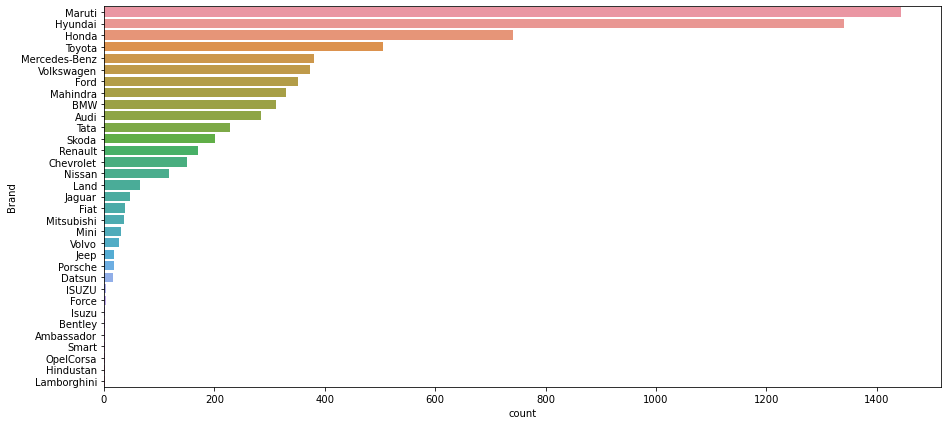

<IPython.core.display.Javascript object>

In [101]:
# plot
plt.figure(figsize=(15, 7))
sns.countplot(y="Brand", data=df, order=df["Brand"].value_counts().index)

After separating out the Name I can safely drop it.

In [102]:
# drop a column
df.drop("Name", inplace=True, axis=1)

<IPython.core.display.Javascript object>

Let's review our new columns

#### `Brand`.

Let's check out our `Brand` by `Price` to find breakdowns of car classes. Here we look at mean price by brand.

In [103]:
# find unique count
df.Brand.nunique()

33

<IPython.core.display.Javascript object>

Correct Model for first name.

In [104]:
df["Model"] = df.Model.str.split(" ", 1, expand=True)

<IPython.core.display.Javascript object>

In [105]:
# find unique count
df.Model.nunique()

217

<IPython.core.display.Javascript object>

In [106]:
# Check the data
df["Model"].value_counts()

Swift         418
City          316
i20           303
Innova        203
Verna         200
             ... 
Countryman      1
Beetle          1
CLS-Class       1
Boxster         1
1000            1
Name: Model, Length: 217, dtype: int64

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='count', ylabel='Model'>

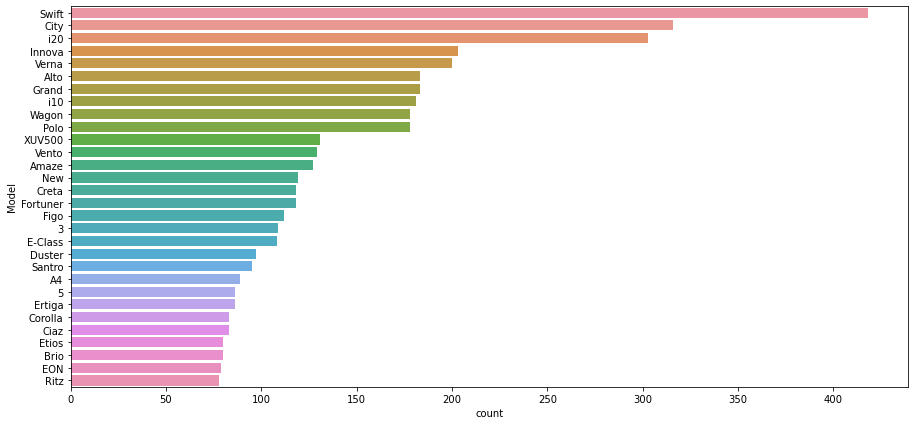

<IPython.core.display.Javascript object>

In [107]:
plt.figure(figsize=(15, 7))
sns.countplot(y="Model", data=df, order=df["Model"].value_counts().index[:30])

Since there are so many models lets see if we can reduce the load on the visualizations and modeling to come up with some more generalized accounts of different models.

217 unique values is better than over 2000 but is still alot. For the sake of a better model, let's drop this level of specificity and focus on `Brand`. We will create categories based on price.

In [108]:
# View mean of one variable by another
df.groupby(["Brand"])["Price"].mean().sort_values(ascending=False)

Brand
Lamborghini     120.00
Porsche          46.10
Land             33.86
Bentley          32.32
Jaguar           32.30
Mini             23.47
Mercedes-Benz    23.36
BMW              22.28
Audi             22.13
Jeep             15.97
Volvo            15.51
Isuzu            12.82
Toyota           10.45
ISUZU             9.91
Mitsubishi        9.70
Force             9.33
Mahindra          7.60
Skoda             7.28
Ford              6.71
Renault           5.78
OpelCorsa         5.64
Hindustan         5.64
Honda             5.45
Hyundai           5.40
Volkswagen        5.36
Nissan            4.94
Maruti            4.70
Tata              3.95
Fiat              3.89
Datsun            3.66
Chevrolet         3.56
Smart             3.00
Ambassador        1.35
Name: Price, dtype: float64

<IPython.core.display.Javascript object>

**Observations**
1. Notice that "ISUZU" and "Isuzu" are both found so let's title-case the series.
2. We can see our outliers makes: Lambourghini and Ambassador - lets check them.
3. We have some general price breaks that we might use.

In [109]:
# make lower case
df.Brand = df.Brand.str.title()

<IPython.core.display.Javascript object>

In [110]:
# View mean of one variable by another
df.Brand.unique()

array(['Maruti', 'Hyundai', 'Honda', 'Audi', 'Nissan', 'Toyota',
       'Volkswagen', 'Tata', 'Land', 'Mitsubishi', 'Renault',
       'Mercedes-Benz', 'Bmw', 'Mahindra', 'Ford', 'Porsche', 'Datsun',
       'Jaguar', 'Volvo', 'Chevrolet', 'Skoda', 'Mini', 'Fiat', 'Jeep',
       'Smart', 'Ambassador', 'Isuzu', 'Force', 'Bentley', 'Lamborghini',
       'Hindustan', 'Opelcorsa'], dtype=object)

<IPython.core.display.Javascript object>

In [111]:
# get lowest and highest car values
df.loc[(df.Brand == "Ambassador") | (df.Brand == "Lamborghini")]

,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log,Brand,Model
S.No.,,,,,,,,,,,,,,
1221,Chennai,2003,80000,Diesel,Manual,Third,35.50,5,1.35,1489,12.80,0.30,Ambassador,Classic
5781,Delhi,2011,6500,Petrol,Automatic,Third,560.00,2,120.00,5204,6.40,4.79,Lamborghini,Gallardo


<IPython.core.display.Javascript object>

#### Binning `Brand`

We will bucket the Brands or Makes into Economic Types.

Let's bin by generalized appearance of breakdown from the `Price` column.

In [112]:
df["Car_category"] = pd.cut(df.Price, bins=[0, 15, 30, 50, 200])
df.head()

,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log,Brand,Model,Car_category
S.No.,,,,,,,,,,,,,,,
0,Mumbai,2010,72000,CNG,Manual,First,58.16,5,1.75,998,26.60,0.56,Maruti,Wagon,"(0, 15]"
1,Pune,2015,41000,Diesel,Manual,First,126.20,5,12.50,1582,19.67,2.53,Hyundai,Creta,"(0, 15]"
2,Chennai,2011,46000,Petrol,Manual,First,88.70,5,4.50,1199,18.20,1.50,Honda,Jazz,"(0, 15]"
3,Chennai,2012,87000,Diesel,Manual,First,88.76,7,6.00,1248,20.77,1.79,Maruti,Ertiga,"(0, 15]"
4,Coimbatore,2013,40670,Diesel,Automatic,Second,140.80,5,17.74,1968,15.20,2.88,Audi,A4,"(15, 30]"


<IPython.core.display.Javascript object>

In [113]:
# value counts
df["Car_category"].value_counts().sort_index()

(0, 15]      6265
(15, 30]      634
(30, 50]      259
(50, 200]      88
Name: Car_category, dtype: int64

<IPython.core.display.Javascript object>

It's clear that the majority of the used cars are between 0 - 10 Lakh's. Let's label the bins by some generic car terminology.

In [114]:
# drop column
df.drop(columns="Car_category", inplace=True)

<IPython.core.display.Javascript object>

In [115]:
# make cut with labels
df["Car_category"] = pd.cut(
    df.Price,
    bins=[0, 15, 30, 50, 100],
    labels=["Budget_Friendly", "Mid_Range", "Luxury_Cars", "Ultra_luxury"],
)
df.head()

,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Power,Seats,Price,Engine_num,Mileage_num,price_log,Brand,Model,Car_category
S.No.,,,,,,,,,,,,,,,
0,Mumbai,2010,72000,CNG,Manual,First,58.16,5,1.75,998,26.60,0.56,Maruti,Wagon,Budget_Friendly
1,Pune,2015,41000,Diesel,Manual,First,126.20,5,12.50,1582,19.67,2.53,Hyundai,Creta,Budget_Friendly
2,Chennai,2011,46000,Petrol,Manual,First,88.70,5,4.50,1199,18.20,1.50,Honda,Jazz,Budget_Friendly
3,Chennai,2012,87000,Diesel,Manual,First,88.76,7,6.00,1248,20.77,1.79,Maruti,Ertiga,Budget_Friendly
4,Coimbatore,2013,40670,Diesel,Automatic,Second,140.80,5,17.74,1968,15.20,2.88,Audi,A4,Mid_Range


<IPython.core.display.Javascript object>

I will need to one-hot-encode these categories for modeling. For now lets make sure they are categorical types.

In [116]:
cat_vars = ["Car_category", "Model", "Brand"]

for colname in cat_vars:
    df[colname] = df[colname].astype("category")

df.info()  # Explore dataframe information, check dtype, and nulls.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7246 entries, 0 to 7252
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Location           7246 non-null   category
 1   Year               7246 non-null   int64   
 2   Kilometers_Driven  7246 non-null   int64   
 3   Fuel_Type          7246 non-null   category
 4   Transmission       7246 non-null   category
 5   Owner_Type         7246 non-null   category
 6   Power              7246 non-null   float64 
 7   Seats              7246 non-null   int64   
 8   Price              7246 non-null   float64 
 9   Engine_num         7246 non-null   int64   
 10  Mileage_num        7246 non-null   float64 
 11  price_log          7246 non-null   float64 
 12  Brand              7246 non-null   category
 13  Model              7246 non-null   category
 14  Car_category       7245 non-null   category
dtypes: category(7), float64(4), int64(4)
memory usage: 836.

<IPython.core.display.Javascript object>

In [117]:
# get value counts
df.Car_category.value_counts()

Budget_Friendly    6265
Mid_Range           634
Luxury_Cars         259
Ultra_luxury         87
Name: Car_category, dtype: int64

<IPython.core.display.Javascript object>

# <a id='link3'>Exploratory Data Analysis</a>

## Summary statistics

In [118]:
# 5 (Quantile) Statistics for numerical variables
df.describe()

,Year,Kilometers_Driven,Power,Seats,Price,Engine_num,Mileage_num,price_log
count,7246.00,7246.00,7246.00,7246.00,7246.00,7246.00,7246.00,7246.00
mean,2013.37,57810.70,112.30,5.28,8.80,1615.41,18.35,1.81
std,3.25,37504.19,52.88,0.81,10.12,592.75,4.13,0.80
min,1996.00,171.00,34.20,2.00,0.44,624.00,6.40,-0.82
25%,2011.00,34000.00,77.00,5.00,3.85,1198.00,15.40,1.35
50%,2014.00,53469.50,94.34,5.00,5.64,1493.00,18.20,1.73
75%,2016.00,73000.00,138.03,5.00,8.40,1968.00,21.10,2.13
max,2019.00,775000.00,616.00,10.00,120.00,5998.00,33.54,4.79


<IPython.core.display.Javascript object>

In [119]:
# Basic statistics for Categorical variables
df.describe(include=["category"])

,Location,Fuel_Type,Transmission,Owner_Type,Brand,Model,Car_category
count,7246,7246,7246,7246,7246,7246,7245
unique,11,4,2,4,32,217,4
top,Mumbai,Diesel,Manual,First,Maruti,Swift,Budget_Friendly
freq,946,3850,5202,5945,1444,418,6265


<IPython.core.display.Javascript object>

## Set-up for visualization

In [120]:
# Function from GreatLearning on %'s for bar graphs
def per_on_bar(plot, feature):
    total = len(feature)
    for p in ax.patches:
        perc = "{:1.f}%".format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + g.get_height()
        ax.annotate(perc, (x, y), size=12)
    plt.show()

<IPython.core.display.Javascript object>

In [121]:
categoricals = df.select_dtypes(include=["object", "category", "string"])
global categoricals
[categoricals]

[         Location Fuel_Type Transmission Owner_Type          Brand    Model  \
 S.No.                                                                         
 0          Mumbai       CNG       Manual      First         Maruti    Wagon   
 1            Pune    Diesel       Manual      First        Hyundai    Creta   
 2         Chennai    Petrol       Manual      First          Honda     Jazz   
 3         Chennai    Diesel       Manual      First         Maruti   Ertiga   
 4      Coimbatore    Diesel    Automatic     Second           Audi       A4   
 ...           ...       ...          ...        ...            ...      ...   
 7248    Hyderabad    Diesel       Manual      First     Volkswagen    Vento   
 7249       Mumbai    Petrol    Automatic      First     Volkswagen     Polo   
 7250      Kolkata    Diesel       Manual      First         Nissan    Micra   
 7251         Pune    Petrol    Automatic      Third     Volkswagen     Polo   
 7252        Kochi    Diesel    Automati

<IPython.core.display.Javascript object>

## Univariate

In [122]:
# Function to perform statistical analysis on every numeric and categorical variable in the dataframe
pd.set_option("display.max_colwidth", 5000)


def univar_num(dataframe):  # argument is the whole dataframe

    # Print statistics for numeric variables
    print("\n Mode Analysis \n", df.mode("index")[0:2])  # Mode (or most popular)
    print("\n Sum Analysis \n", numerical_features.sum())  # Sum analysis
    print("\n Variance analysis \n", numerical_features.var())  # Variance analysis
    print(
        "\n Absolute Deviation or Mean Absolute Deviation \n", numerical_features.mad()
    )  # Absolute Deviation or Mean Absolute Deviation
    print("\n  Skew analysis \n ", numerical_features.skew())  # Skew analysis

    return

<IPython.core.display.Javascript object>

In [123]:
# Run dataframe through function
univar_num(numerical_features)


 Mode Analysis 
   Location  Year  Kilometers_Driven Fuel_Type Transmission Owner_Type  Power  \
0   Mumbai  2015              60000    Diesel       Manual      First  74.00   

   Seats  Price  Engine_num  Mileage_num  price_log   Brand  Model  \
0      5   5.64        1197        17.00       1.73  Maruti  Swift   

      Car_category  
0  Budget_Friendly  

 Sum Analysis 
 Year                 14594892.00
Kilometers_Driven   425546305.00
Power                  814311.69
Seats                   38259.00
Price                   63979.65
Engine_num           11714459.00
Mileage_num            132984.80
price_log               13111.35
dtype: float64

 Variance analysis 
 Year                        10.59
Kilometers_Driven   7131921139.95
Power                     2801.12
Seats                        0.65
Price                      106.00
Engine_num              352069.92
Mileage_num                 17.10
price_log                    0.64
dtype: float64

 Absolute Deviation or Mean Abso

<IPython.core.display.Javascript object>

In [124]:
# Frequency tables for every feature
for (
    column_name,
    column_data,
) in (
    df.iteritems()
):  # for every column in the dataframe return the column name and Series of data
    display((column_name, column_data.value_counts()))

('Location',
 Mumbai        946
 Hyderabad     874
 Coimbatore    772
 Kochi         772
 Pune          765
 Delhi         660
 Kolkata       654
 Chennai       589
 Jaipur        499
 Bangalore     440
 Ahmedabad     275
 Name: Location, dtype: int64)

('Year',
 2015    929
 2014    925
 2016    885
 2013    791
 2017    707
 2012    689
 2011    578
 2010    405
 2018    361
 2009    252
 2008    207
 2007    148
 2019    119
 2006     89
 2005     68
 2004     35
 2003     20
 2002     18
 2001      8
 2000      5
 1998      4
 1999      2
 1996      1
 Name: Year, dtype: int64)

('Kilometers_Driven',
 60000    96
 45000    86
 65000    86
 70000    77
 50000    71
          ..
 24350     1
 58217     1
 60268     1
 21363     1
 64917     1
 Name: Kilometers_Driven, Length: 3659, dtype: int64)

('Fuel_Type',
 Diesel    3850
 Petrol    3322
 CNG         62
 LPG         12
 Name: Fuel_Type, dtype: int64)

('Transmission',
 Manual       5202
 Automatic    2044
 Name: Transmission, dtype: int64)

('Owner_Type',
 First             5945
 Second            1152
 Third              137
 Fourth & Above      12
 Name: Owner_Type, dtype: int64)

('Power',
 74.00     280
 94.34     174
 98.60     166
 73.90     152
 140.00    142
          ... 
 328.50      1
 174.57      1
 560.00      1
 231.10      1
 83.11       1
 Name: Power, Length: 383, dtype: int64)

('Seats',
 5     6094
 7      796
 8      170
 4      119
 6       38
 2       18
 10       8
 9        3
 Name: Seats, dtype: int64)

('Price',
 5.64     1238
 4.50       88
 5.50       84
 3.50       82
 4.25       73
          ... 
 14.29       1
 21.26       1
 55.70       1
 43.74       1
 2.22        1
 Name: Price, Length: 1372, dtype: int64)

('Engine_num',
 1197    732
 1248    610
 1498    370
 998     309
 1198    281
 2179    278
 1497    271
 1968    266
 1995    212
 1461    188
 2143    184
 1199    177
 1582    174
 1396    170
 1598    164
 796     164
 2494    154
 1086    129
 1591    113
 1399    106
 2993    104
 2982    103
 1493    103
 1798     99
 2987     78
 814      74
 2967     67
 1120     60
 1373     59
 1364     58
 1196     57
 2354     53
 1298     48
 2755     42
 1991     41
 799      40
 1896     39
 1799     39
 999      36
 1998     35
 1496     33
 1061     32
 624      31
 1796     29
 2393     28
 1586     26
 2498     26
 1499     25
 936      25
 1405     25
 1794     24
 1193     24
 1984     22
 2523     22
 1997     22
 1999     21
 2148     21
 1495     20
 1186     18
 2477     17
 2199     17
 1956     17
 1368     17
 2499     16
 995      15
 3198     15
 2497     14
 993      14
 2696     14
 3498     13
 2400     13
 1595     13
 1599     13
 2835     12
 1341     11
 1388     

('Mileage_num',
 17.00    206
 18.90    201
 18.60    144
 18.20    115
 21.10    107
         ... 
 16.12      1
 12.97      1
 22.80      1
 11.62      1
 7.50       1
 Name: Mileage_num, Length: 437, dtype: int64)

('price_log',
 1.73    1238
 1.50      88
 1.70      84
 1.25      82
 1.45      73
         ... 
 0.63       1
 1.43       1
 4.17       1
 1.38       1
 4.53       1
 Name: price_log, Length: 1372, dtype: int64)

('Brand',
 Maruti           1444
 Hyundai          1340
 Honda             741
 Toyota            506
 Mercedes-Benz     380
 Volkswagen        374
 Ford              351
 Mahindra          330
 Bmw               311
 Audi              284
 Tata              228
 Skoda             202
 Renault           170
 Chevrolet         151
 Nissan            117
 Land               66
 Jaguar             48
 Fiat               38
 Mitsubishi         36
 Mini               31
 Volvo              28
 Jeep               19
 Porsche            19
 Datsun             17
 Isuzu               5
 Force               3
 Bentley             2
 Lamborghini         1
 Opelcorsa           1
 Hindustan           1
 Smart               1
 Ambassador          1
 Name: Brand, dtype: int64)

('Model',
 Swift       418
 City        316
 i20         303
 Innova      203
 Verna       200
            ... 
 Fusion        1
 Venture       1
 Gallardo      1
 Land          1
 Motors        1
 Name: Model, Length: 217, dtype: int64)

('Car_category',
 Budget_Friendly    6265
 Mid_Range           634
 Luxury_Cars         259
 Ultra_luxury         87
 Name: Car_category, dtype: int64)

<IPython.core.display.Javascript object>

**Observations:**

1. Top `Brand` is Maruti and `Model` is Swift.

2. The top `Year` for Used Cars is 2015.

3. Most `Owners` are first time for these cars.

### Visualizations

In [125]:
# Function to create distribution and statistical plots for each numerical feature in the dataframe
def univar_vis(dataframe):

    sns.set(style="ticks")
    sns.set_style("darkgrid")

    # Univariate visualization of categoricals variables
    for (column_name_c, column_data_c) in categoricals.iteritems():

        print(column_name_c, "Count Plot")
        plt.figure(figsize=(20, 10))
        sns.countplot(x=column_data_c)  # Bar plot against a numeric variable
        plt.show()

        """
        print(column_name_c, "Distribution Plot")
        plt.figure(figsize=(20, 10))
        sns.displot(data=column_data_c)  # distribution plot
        plt.show()
        """

    # Univariate visualization of numeric variables
    for (column_name, column_data) in numerical_features.iteritems():

        print(column_name, "Histogram")
        sns.histplot(df[column_name], kde=True)  # histogram
        plt.figure(figsize=(20, 10))
        plt.show()

        """
        print(column_name, "Distribution Plot")
        plt.figure(figsize=(20, 10))
        sns.displot(data=column_data)  # distribution plot
        plt.show()
        """

        print(column_name, "Density Plot")
        sns.kdeplot(
            data=column_data, x=numerical_features[column_name]
        )  # Kernel distribution
        plt.figure(figsize=(20, 10))
        plt.show()

        print(column_name, "Box Plot")
        sns.boxplot(data=column_data, y=df[column_name])  # Box plot
        plt.figure(figsize=(20, 10))
        plt.show()

        # raise Exception("End to kill infinite loop")

    return

<IPython.core.display.Javascript object>

Location Count Plot


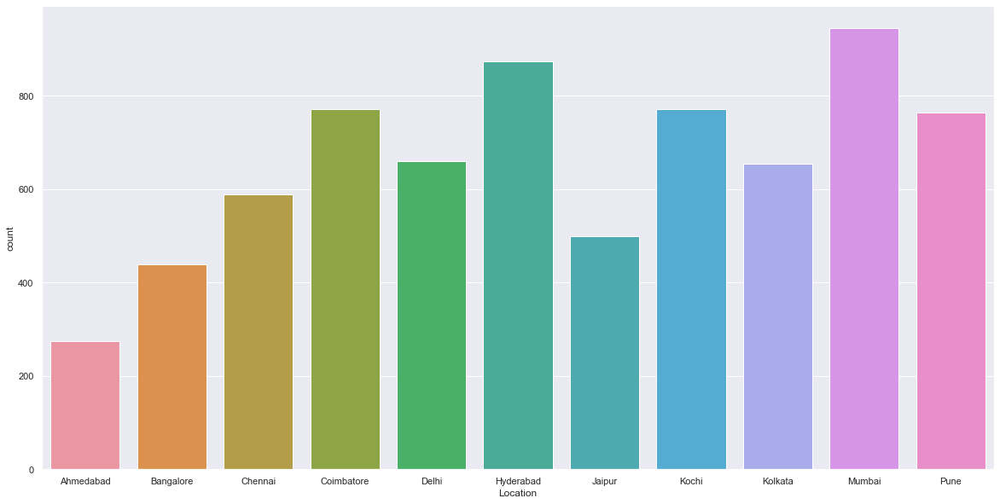

Fuel_Type Count Plot


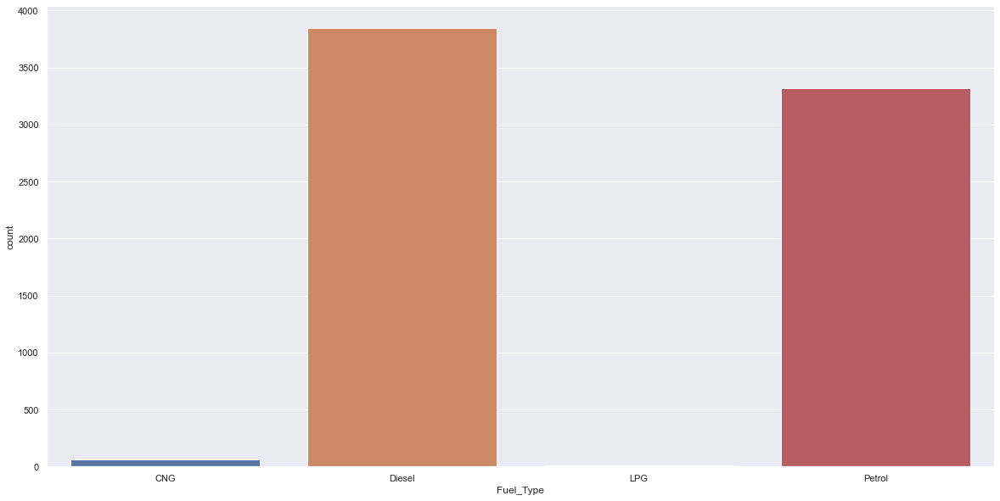

Transmission Count Plot


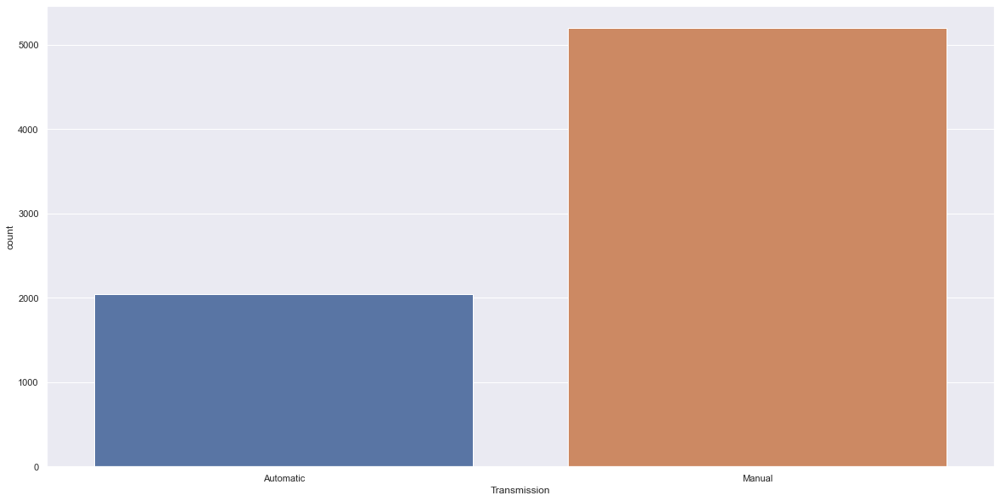

Owner_Type Count Plot


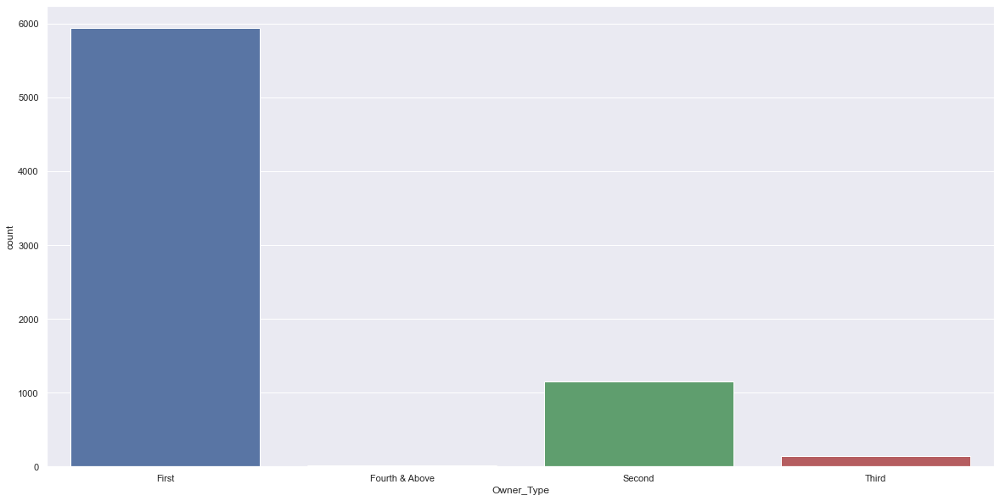

Brand Count Plot


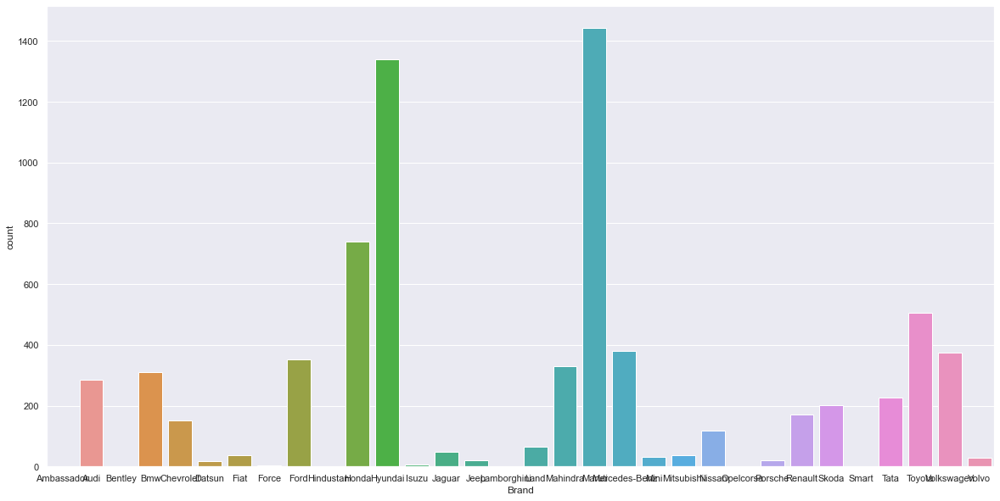

Model Count Plot


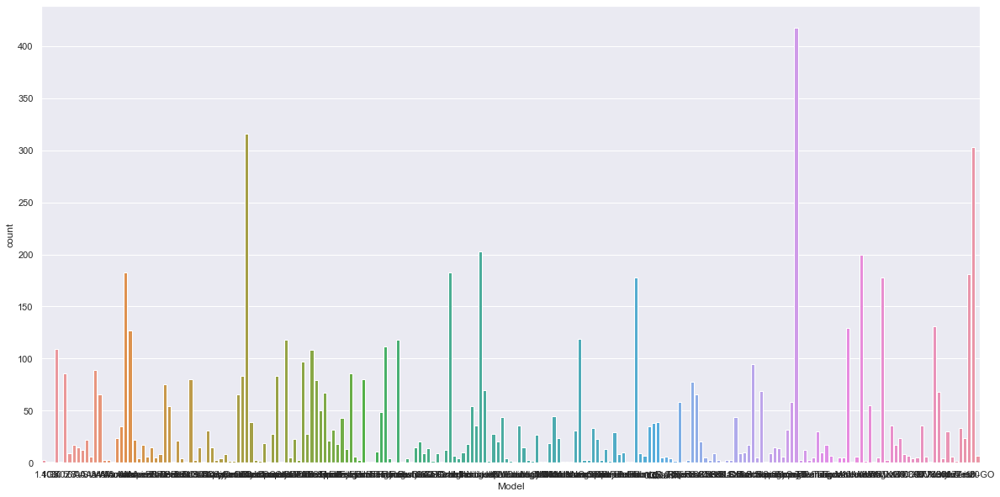

Car_category Count Plot


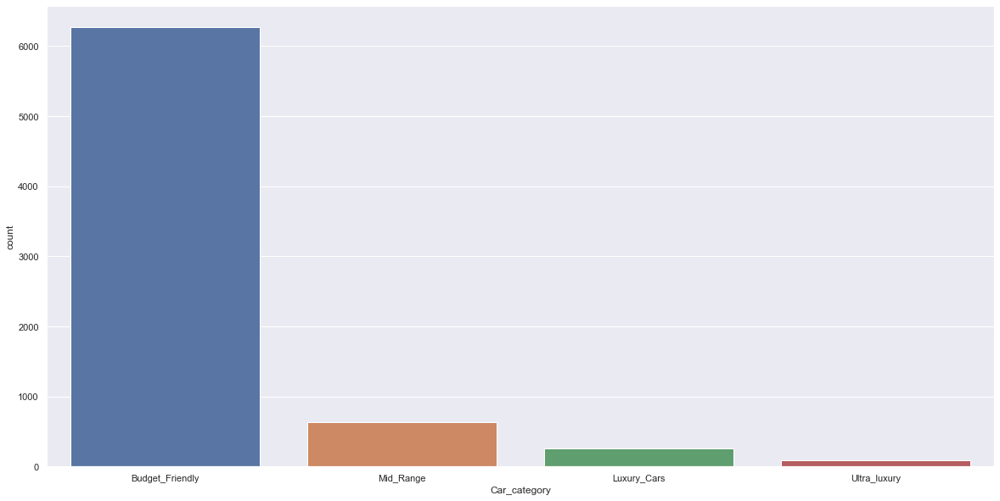

Year Histogram


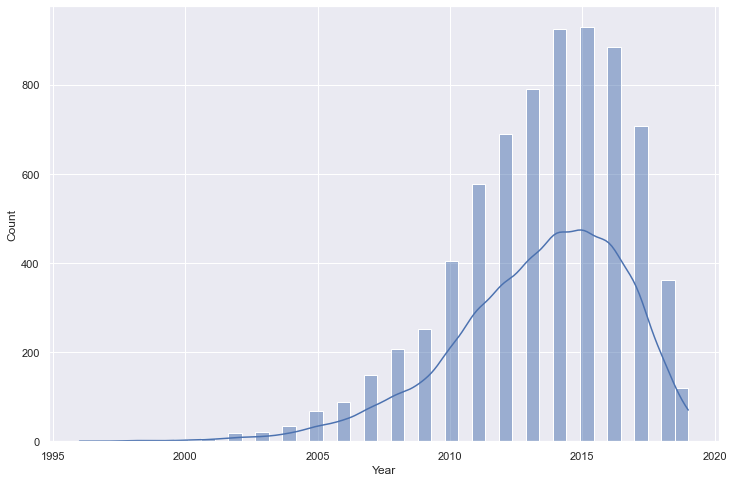

<Figure size 1440x720 with 0 Axes>

Year Density Plot


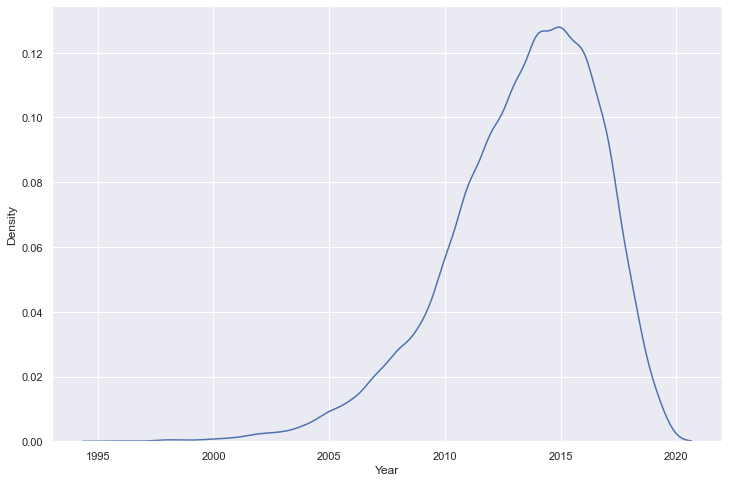

<Figure size 1440x720 with 0 Axes>

Year Box Plot


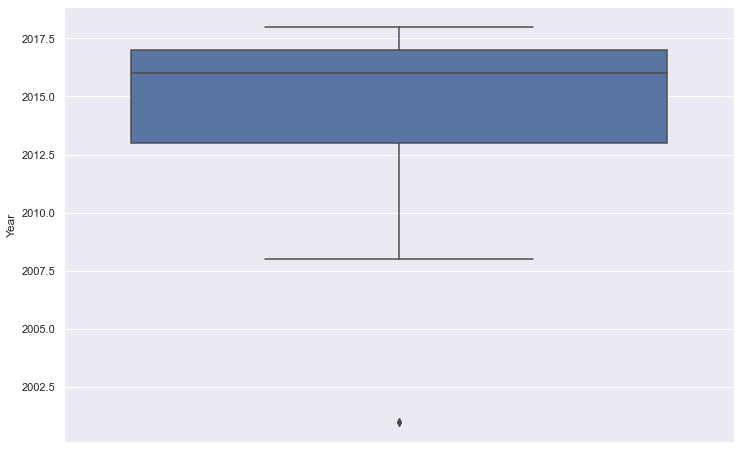

<Figure size 1440x720 with 0 Axes>

Kilometers_Driven Histogram


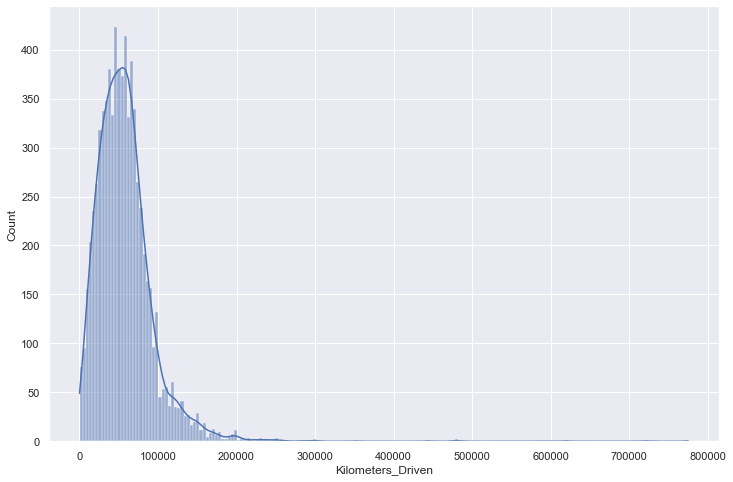

<Figure size 1440x720 with 0 Axes>

Kilometers_Driven Density Plot


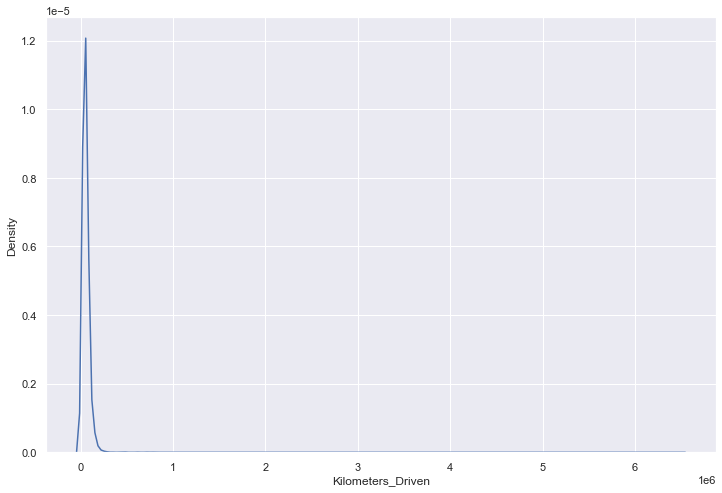

<Figure size 1440x720 with 0 Axes>

Kilometers_Driven Box Plot


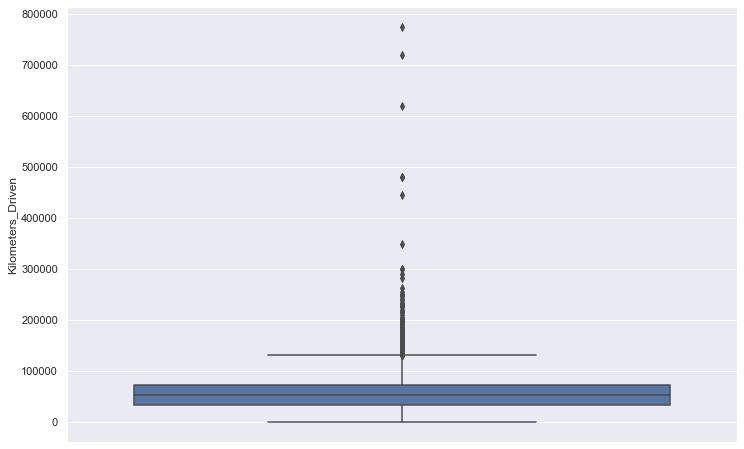

<Figure size 1440x720 with 0 Axes>

Power Histogram


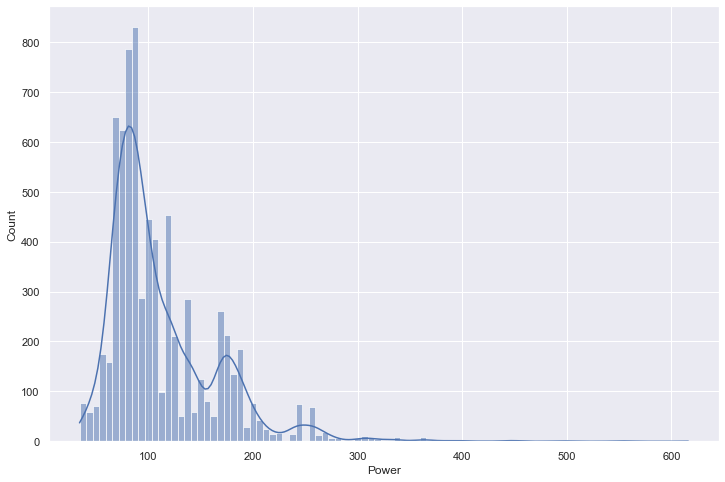

<Figure size 1440x720 with 0 Axes>

Power Density Plot


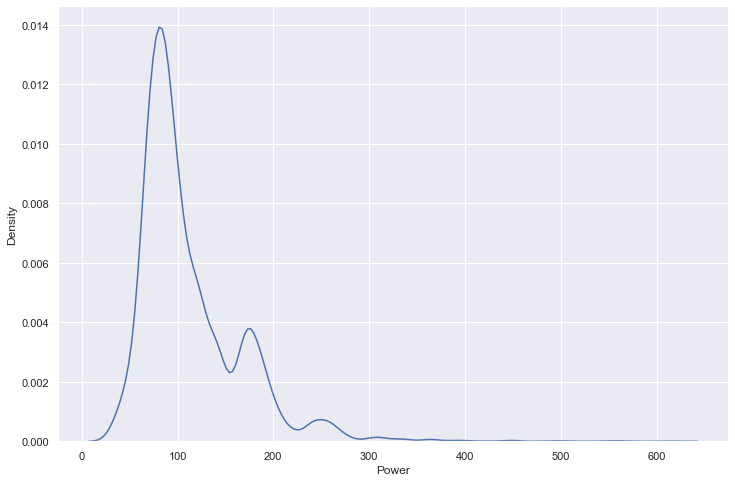

<Figure size 1440x720 with 0 Axes>

Power Box Plot


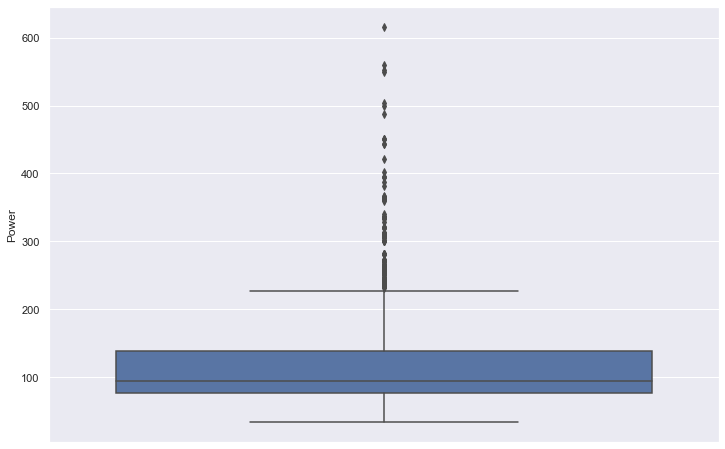

<Figure size 1440x720 with 0 Axes>

Seats Histogram


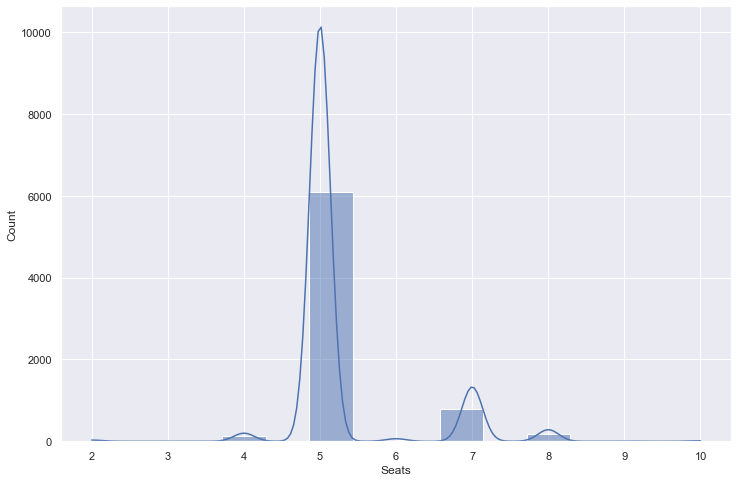

<Figure size 1440x720 with 0 Axes>

Seats Density Plot


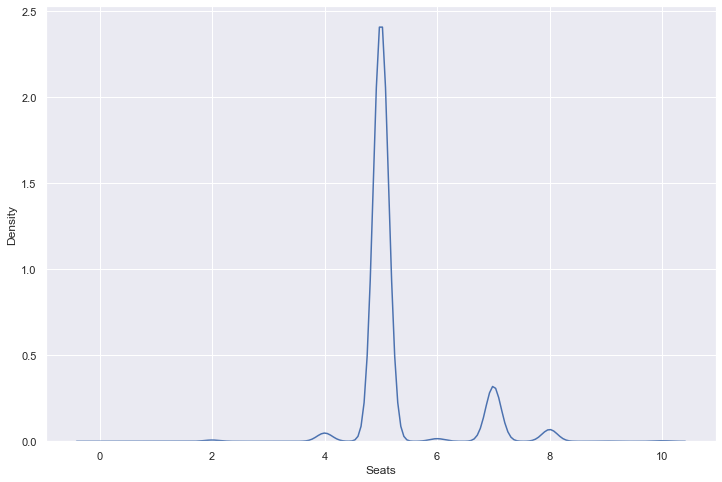

<Figure size 1440x720 with 0 Axes>

Seats Box Plot


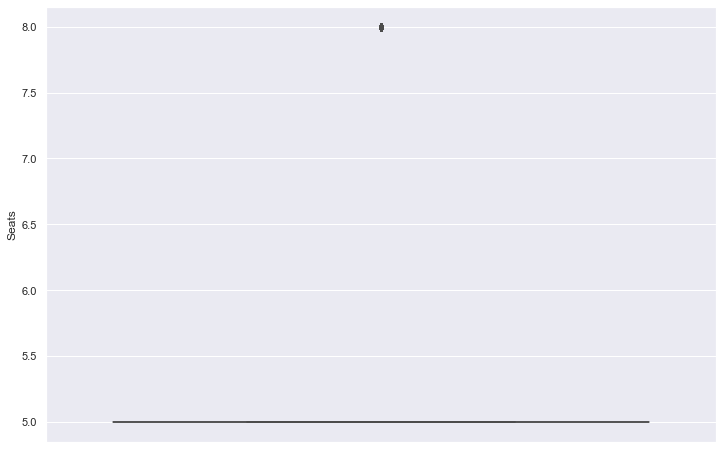

<Figure size 1440x720 with 0 Axes>

Price Histogram


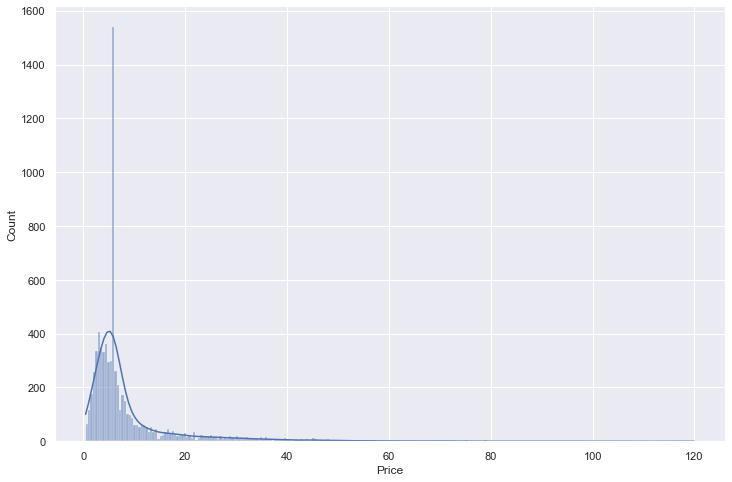

<Figure size 1440x720 with 0 Axes>

Price Density Plot


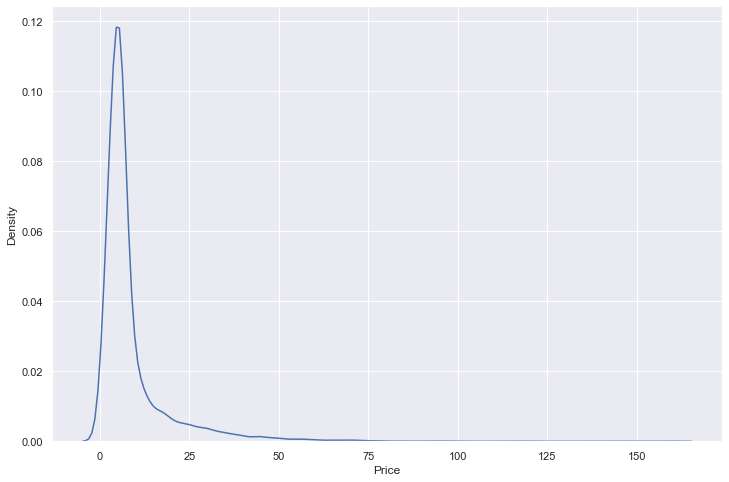

<Figure size 1440x720 with 0 Axes>

Price Box Plot


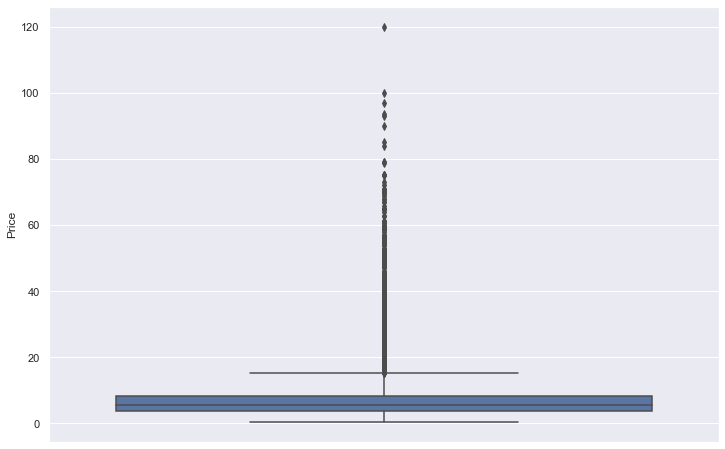

<Figure size 1440x720 with 0 Axes>

Engine_num Histogram


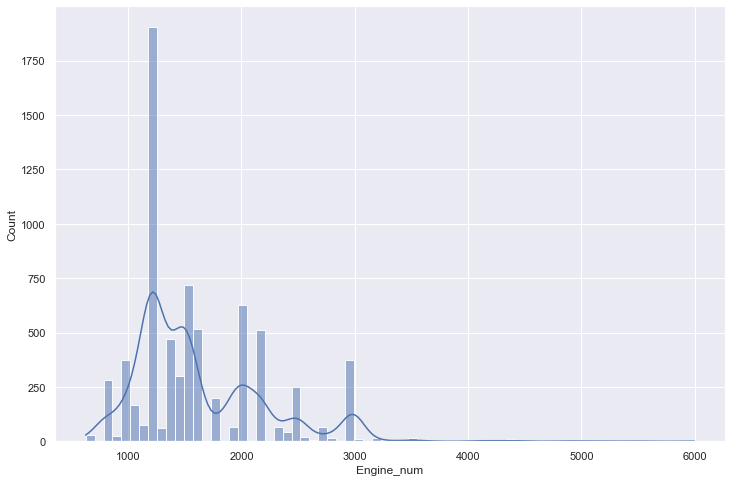

<Figure size 1440x720 with 0 Axes>

Engine_num Density Plot


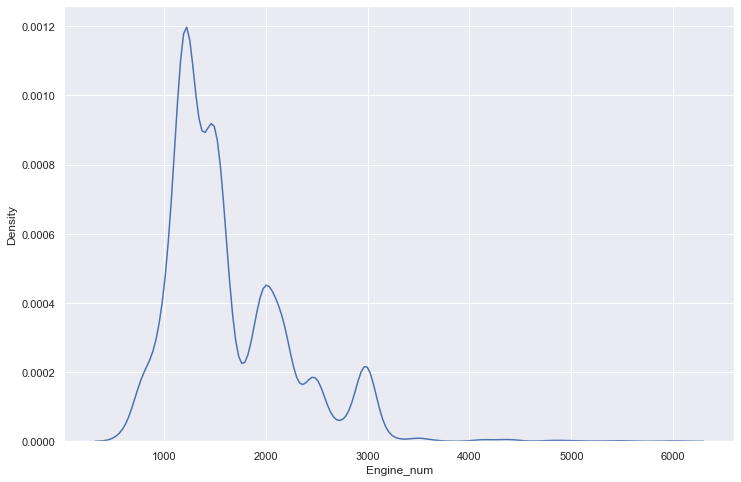

<Figure size 1440x720 with 0 Axes>

Engine_num Box Plot


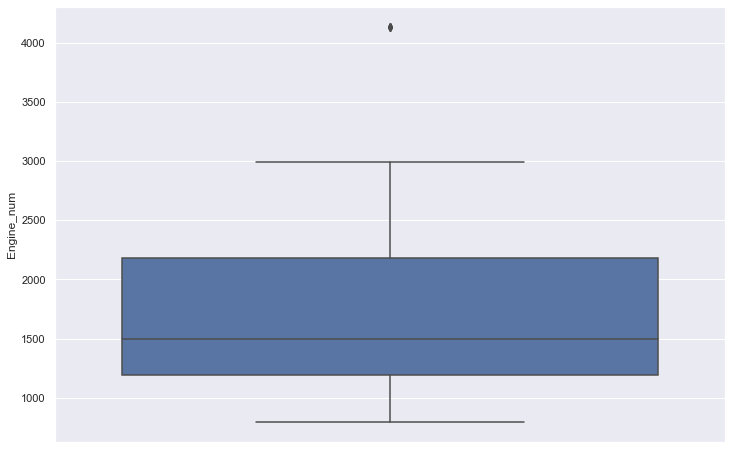

<Figure size 1440x720 with 0 Axes>

Mileage_num Histogram


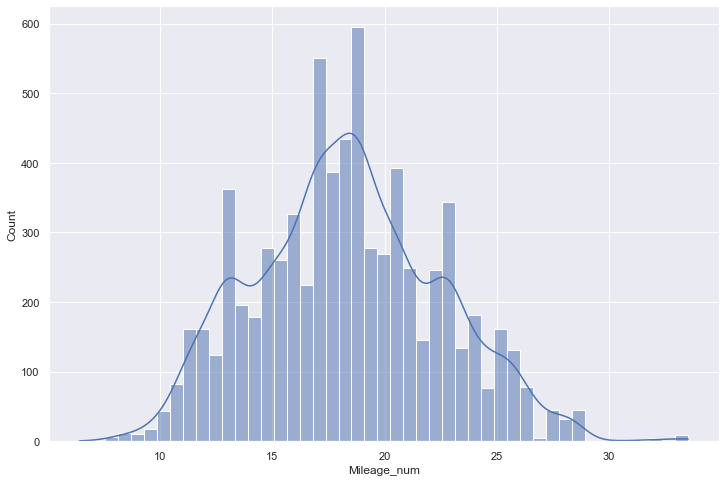

<Figure size 1440x720 with 0 Axes>

Mileage_num Density Plot


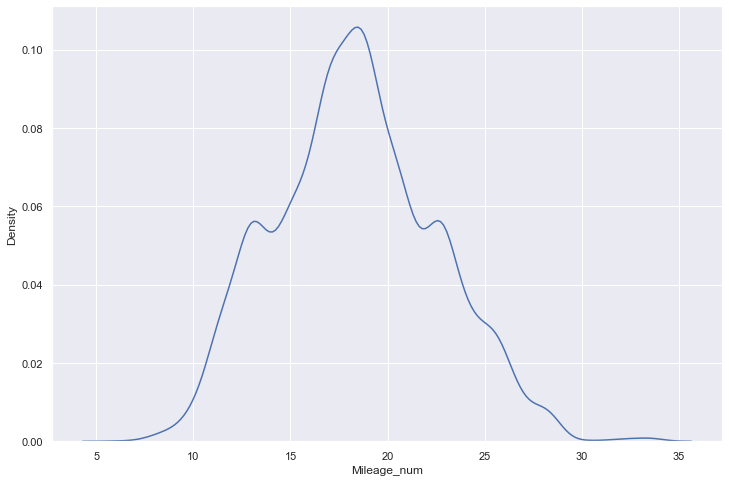

<Figure size 1440x720 with 0 Axes>

Mileage_num Box Plot


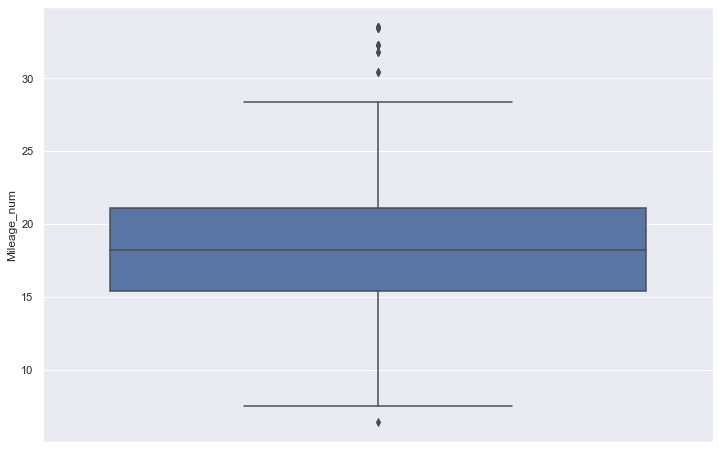

<Figure size 1440x720 with 0 Axes>

price_log Histogram


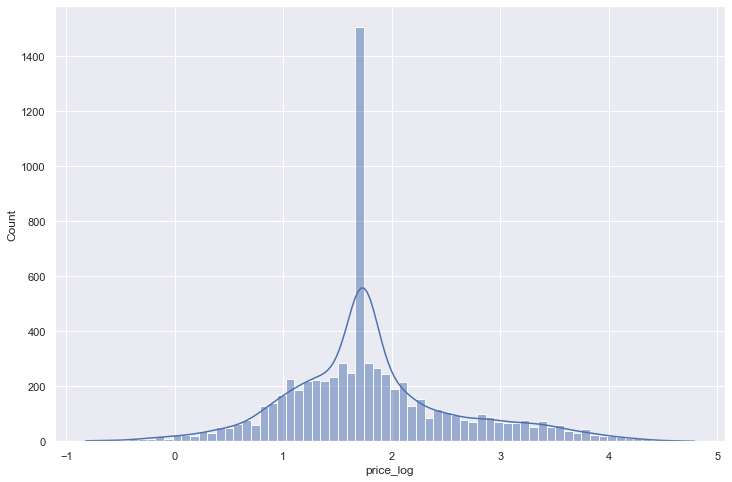

<Figure size 1440x720 with 0 Axes>

price_log Density Plot


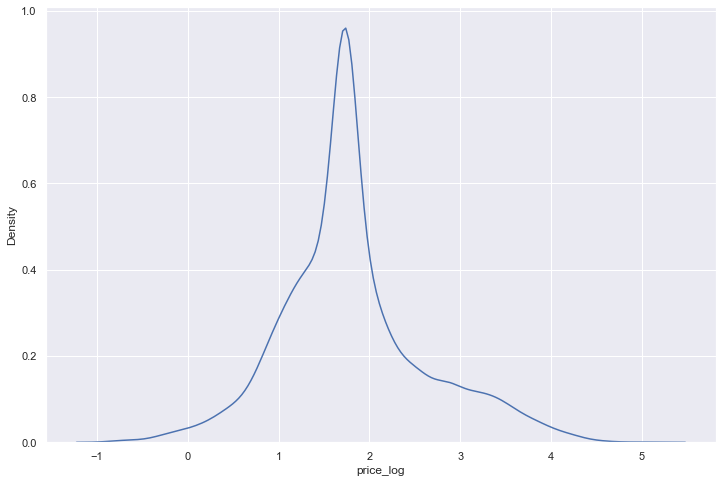

<Figure size 1440x720 with 0 Axes>

price_log Box Plot


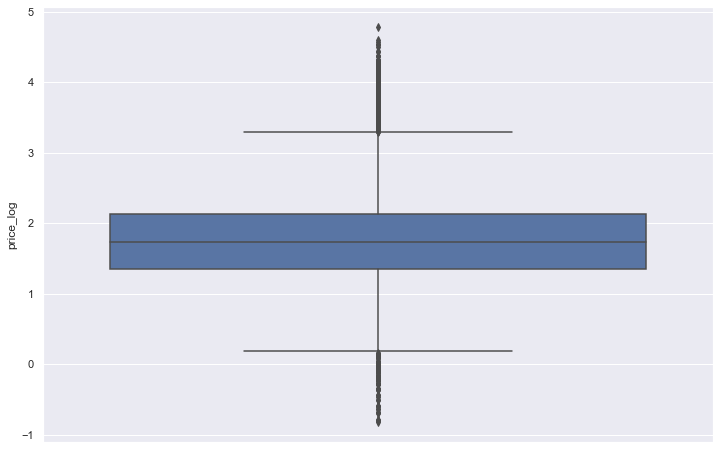

<Figure size 1440x720 with 0 Axes>

<IPython.core.display.Javascript object>

In [126]:
# Run dataframe through function
univar_vis(df)

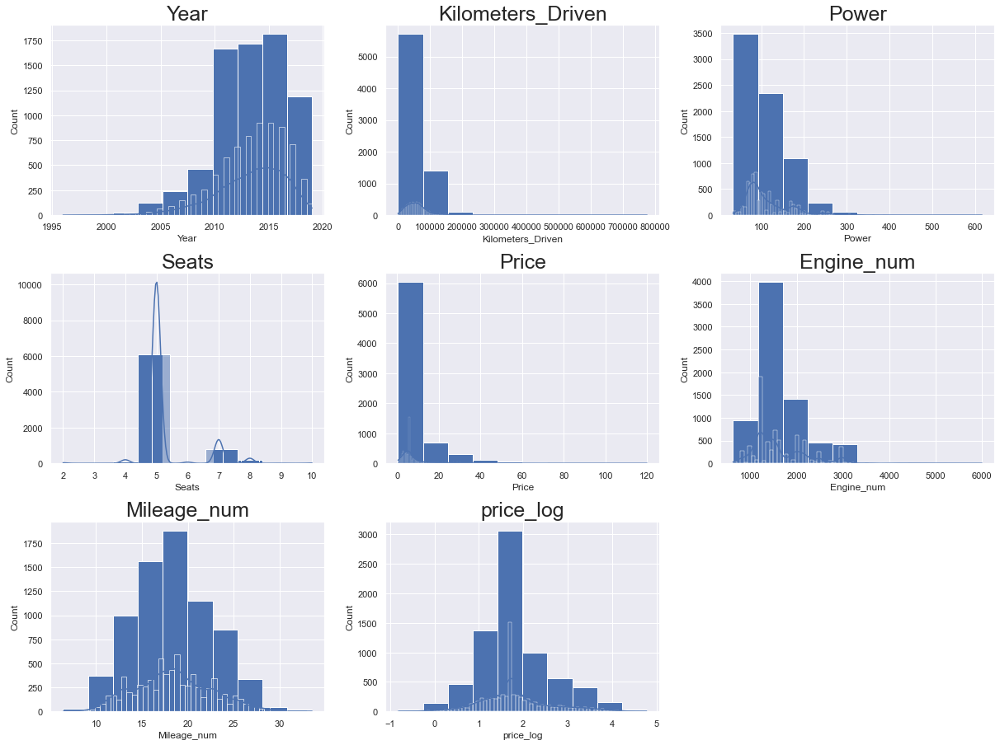

<IPython.core.display.Javascript object>

In [127]:
# From DSBA_SLF_MLS1_LifeExpectancyCaseStudy
all_col = df.select_dtypes(include=["float64", "int64"]).columns.tolist()

plt.figure(figsize=(17, 75))

for i in range(len(all_col)):
    plt.subplot(18, 3, i + 1)
    plt.hist(df[all_col[i]])
    sns.histplot(
        df[all_col[i]], kde=True
    )  # you can comment the previous line and run this one to get distribution curves
    plt.tight_layout()
    plt.title(all_col[i], fontsize=25)

plt.show()

In [128]:
### Code from Mounika of GreatLearning as given in the Uber Case study ###

# While doing uni-variate analysis of numerical variables we want to study their central tendency
# and dispersion.
# Let us write a function that will help us create boxplot and histogram for any input numerical
# variable.
# This function takes the numerical column as the input and returns the boxplots
# and histograms for the variable.
# Let us see if this help us write faster and cleaner code.
def histogram_boxplot(feature, figsize=(15, 10), bins=None):
    """Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        feature, ax=ax_box2, showmeans=True, color="red"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=F, ax=ax_hist2, bins=bins) if bins else sns.distplot(
        feature, kde=False, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        np.mean(feature), color="g", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        np.median(feature), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

Year                 None
Kilometers_Driven    None
Power                None
Seats                None
Price                None
Engine_num           None
Mileage_num          None
price_log            None
dtype: object

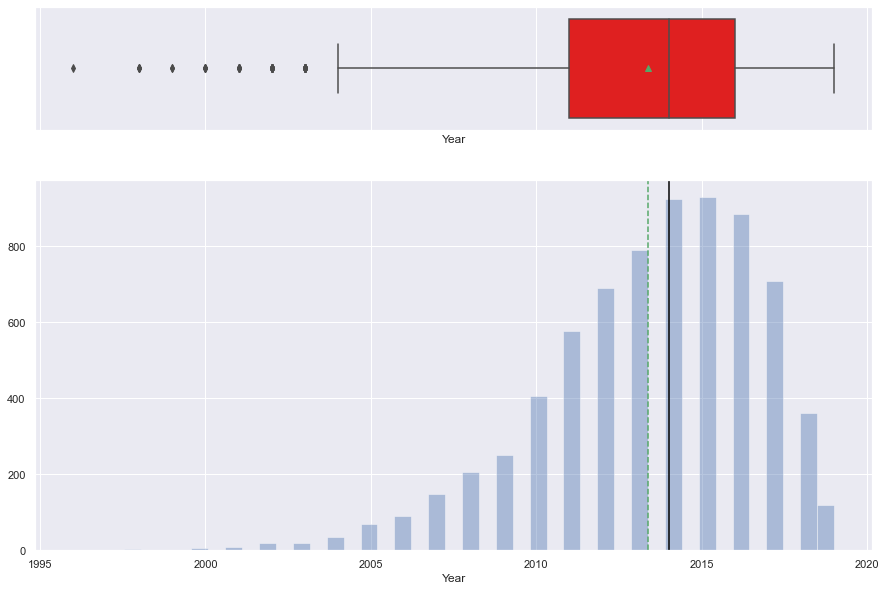

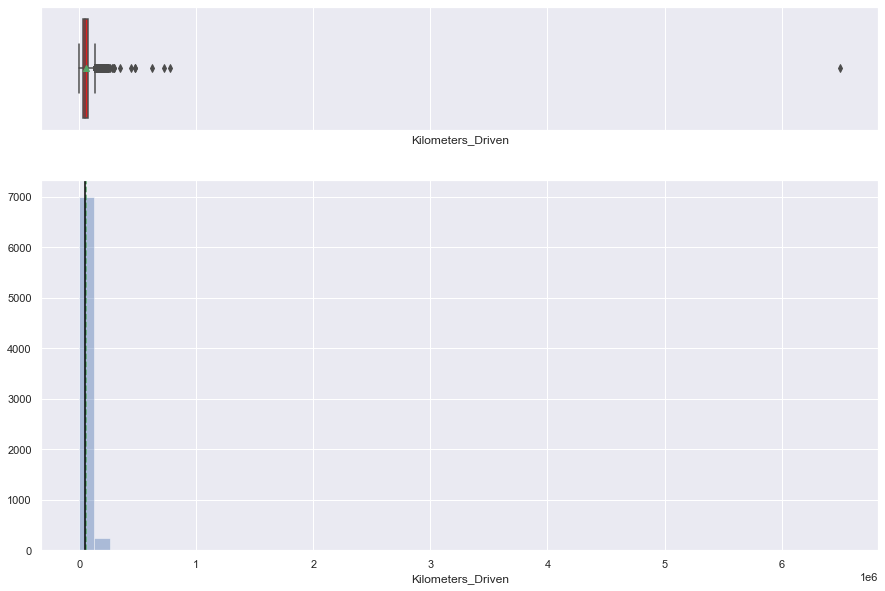

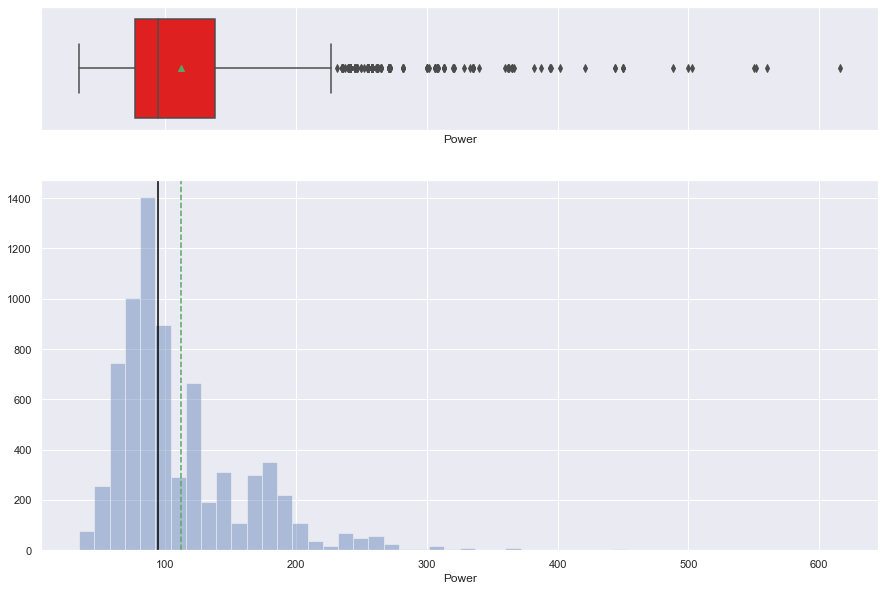

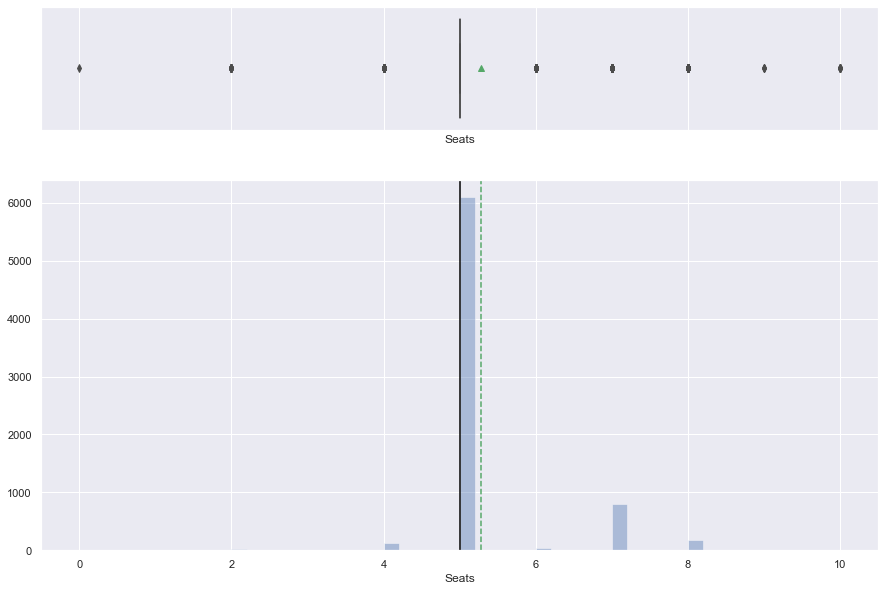

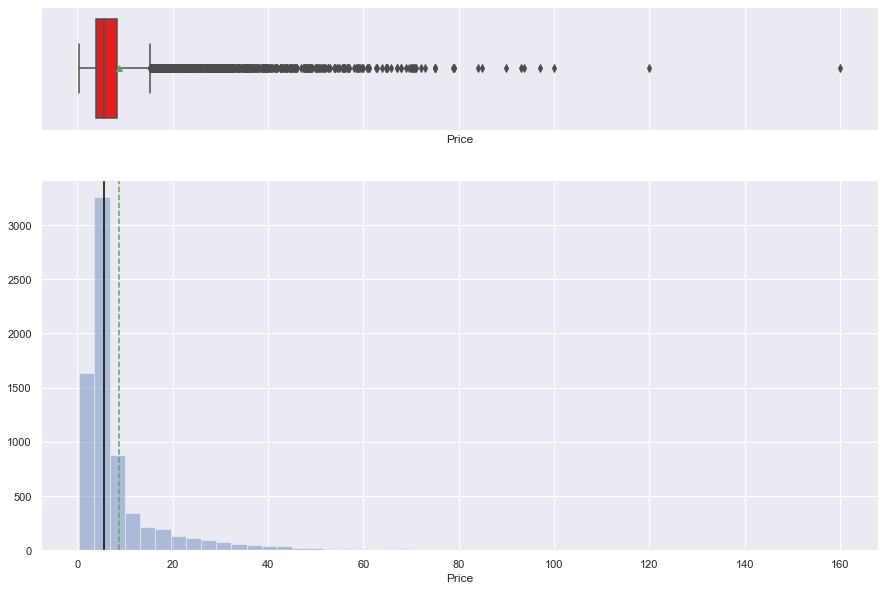

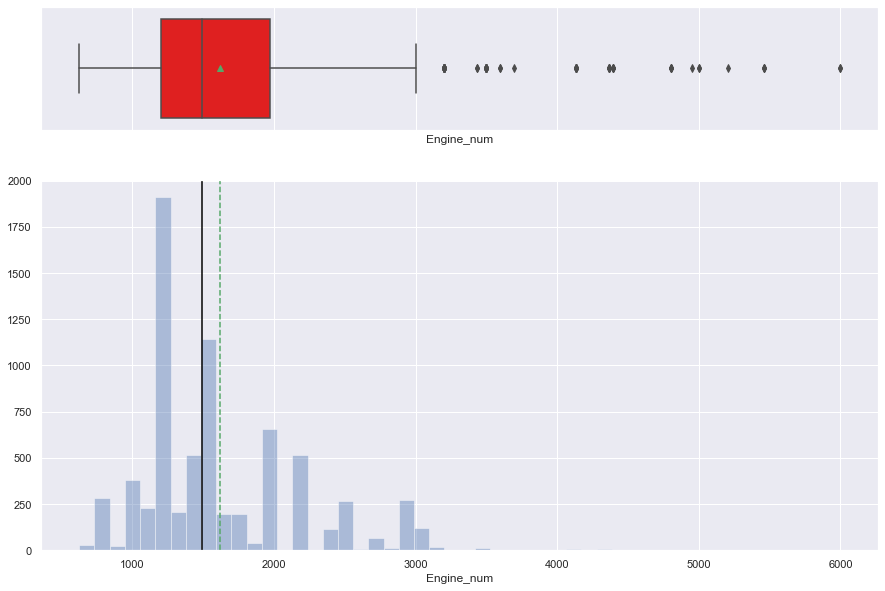

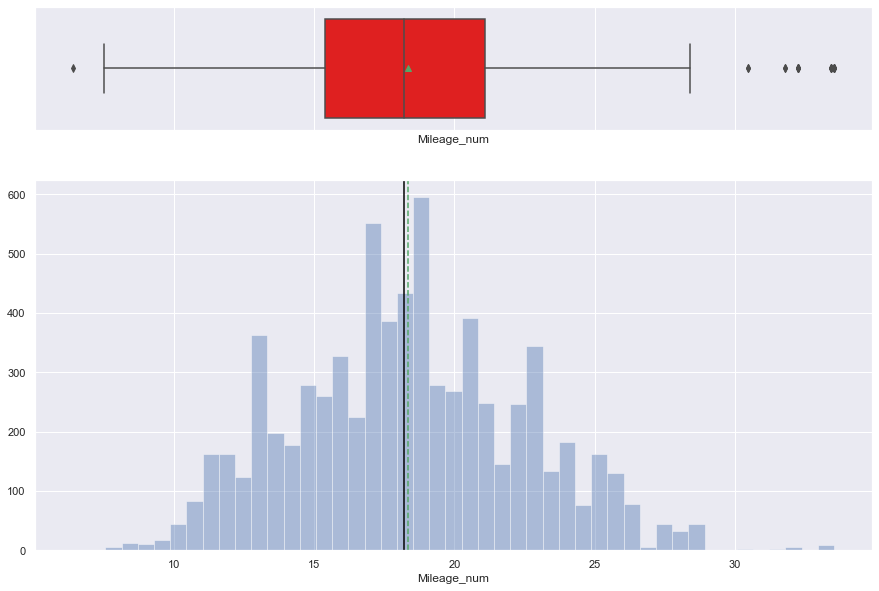

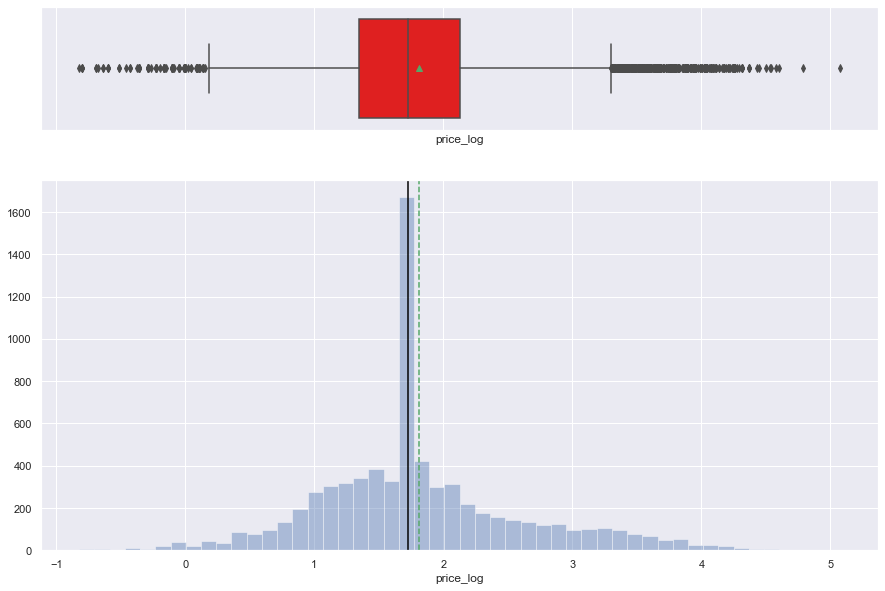

<IPython.core.display.Javascript object>

In [129]:
display(numerical_features.apply(lambda x: histogram_boxplot(x)))

## Bivariate

In [130]:
# Covariance analysis
df.cov()

,Year,Kilometers_Driven,Power,Seats,Price,Engine_num,Mileage_num,price_log
Year,10.59,-54876.52,4.16,0.03,9.15,-102.53,3.98,1.20
Kilometers_Driven,-54876.52,1406564098.90,-2580.42,6435.57,-58965.28,3509610.72,-22085.82,-5261.39
Power,4.16,-2580.42,2796.50,4.18,379.00,26799.62,-118.73,29.28
Seats,0.03,6435.57,4.18,0.65,0.41,193.12,-1.16,0.10
Price,9.15,-58965.28,379.00,0.41,102.44,3637.38,-12.61,6.87
Engine_num,-102.53,3509610.72,26799.62,193.12,3637.38,351346.92,-1564.60,297.06
Mileage_num,3.98,-22085.82,-118.73,-1.16,-12.61,-1564.60,17.09,-0.90
price_log,1.20,-5261.39,29.28,0.10,6.87,297.06,-0.90,0.63


<IPython.core.display.Javascript object>

In [131]:
# Correlation Analysis
corr = df.corr()
display(corr)

,Year,Kilometers_Driven,Power,Seats,Price,Engine_num,Mileage_num,price_log
Year,1.00,-0.45,0.02,0.01,0.28,-0.05,0.30,0.46
Kilometers_Driven,-0.45,1.00,-0.00,0.21,-0.16,0.16,-0.14,-0.18
Power,0.02,-0.00,1.00,0.10,0.71,0.85,-0.54,0.70
Seats,0.01,0.21,0.10,1.00,0.05,0.40,-0.35,0.15
Price,0.28,-0.16,0.71,0.05,1.00,0.61,-0.30,0.85
Engine_num,-0.05,0.16,0.85,0.40,0.61,1.00,-0.64,0.63
Mileage_num,0.30,-0.14,-0.54,-0.35,-0.30,-0.64,1.00,-0.27
price_log,0.46,-0.18,0.70,0.15,0.85,0.63,-0.27,1.00


<IPython.core.display.Javascript object>

Looking for anything close to one, anything above .8 is of interest.

''

<AxesSubplot:>

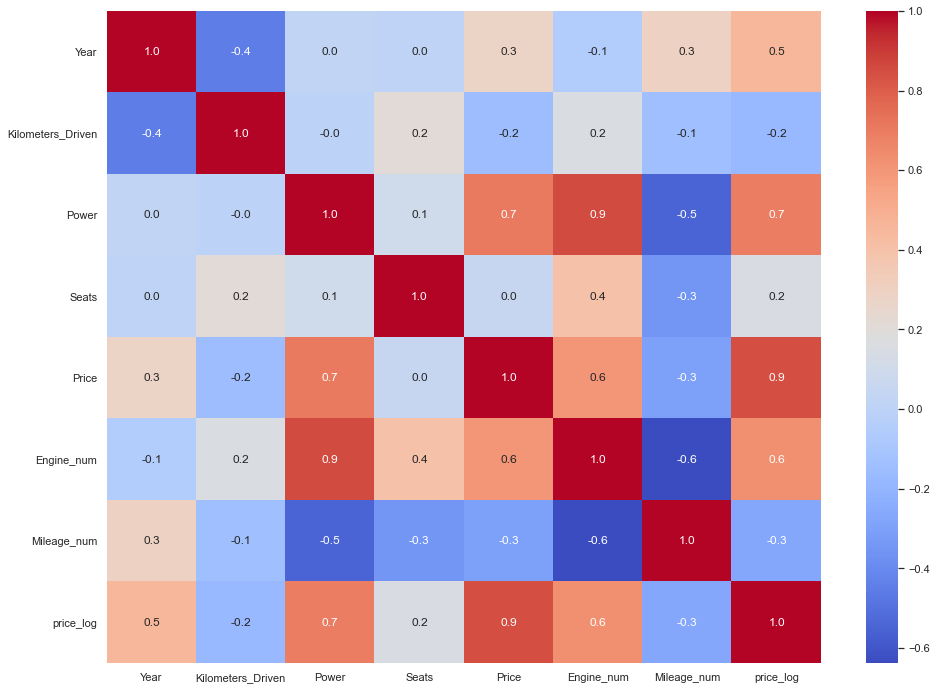

<IPython.core.display.Javascript object>

In [132]:
# Plot the heatmap of correlations
plt.figure(figsize=(16, 12))
display("")
sns.heatmap(
    corr,
    annot=True,
    cmap="coolwarm",
    fmt=".1f",
    ### Categorical variables   xticklabels=corr.columns,
    yticklabels=corr.columns,
)

**Observations:**

1. `Power` and `Engine` are highly positively correlated. One of them will be dropped for the Linear Reg. model.

2. `Power` and `Price` are the next in line.

3. `Price` and `Engine` & `Mileage` and `Engine` are 3rd at .6 (-.06) degree of correlation strength. The rest of data is not very correlated.

### EDA Report

In [133]:
# write Pandas Profile report
profile = ProfileReport(df, title="Pandas Profiling Report")

<IPython.core.display.Javascript object>

In [134]:
# create iframe version
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

## Feature of Interest: `Price`

 Identify the key variables that have a strong relationship with dependent variable

**Note** The independent variables are operating on a log-scale at this point.

##### Cross the top value from `Fuel_Type` and `Price` to get a best guess of linear relationship

<AxesSubplot:xlabel='Transmission', ylabel='Price'>

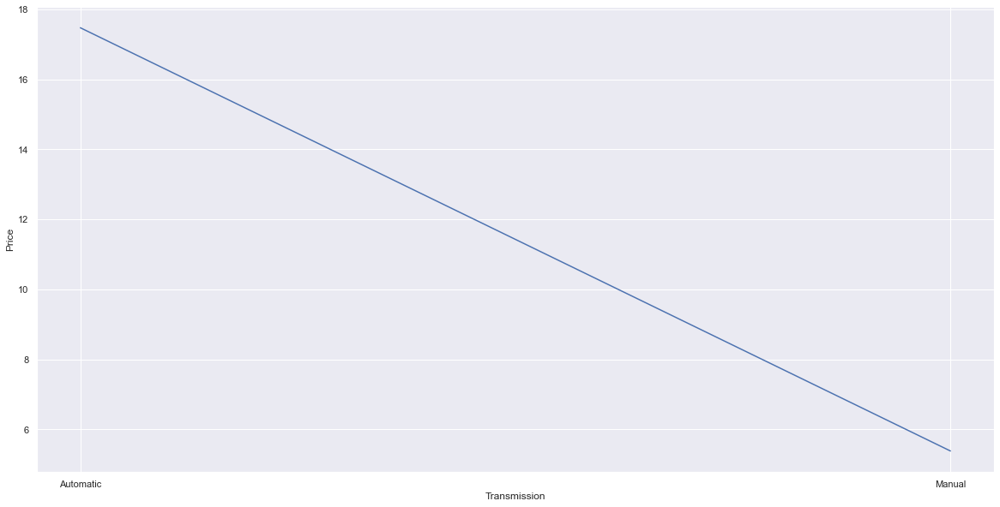

<IPython.core.display.Javascript object>

In [135]:
# create a lineplot
plt.figure(figsize=(20, 10))
sns.lineplot(y="Price", x="Transmission", data=df, ci=None)

##### Cross `Engine` and `Price` to get a best guess of linear relationship

<AxesSubplot:xlabel='Engine_num', ylabel='Price'>

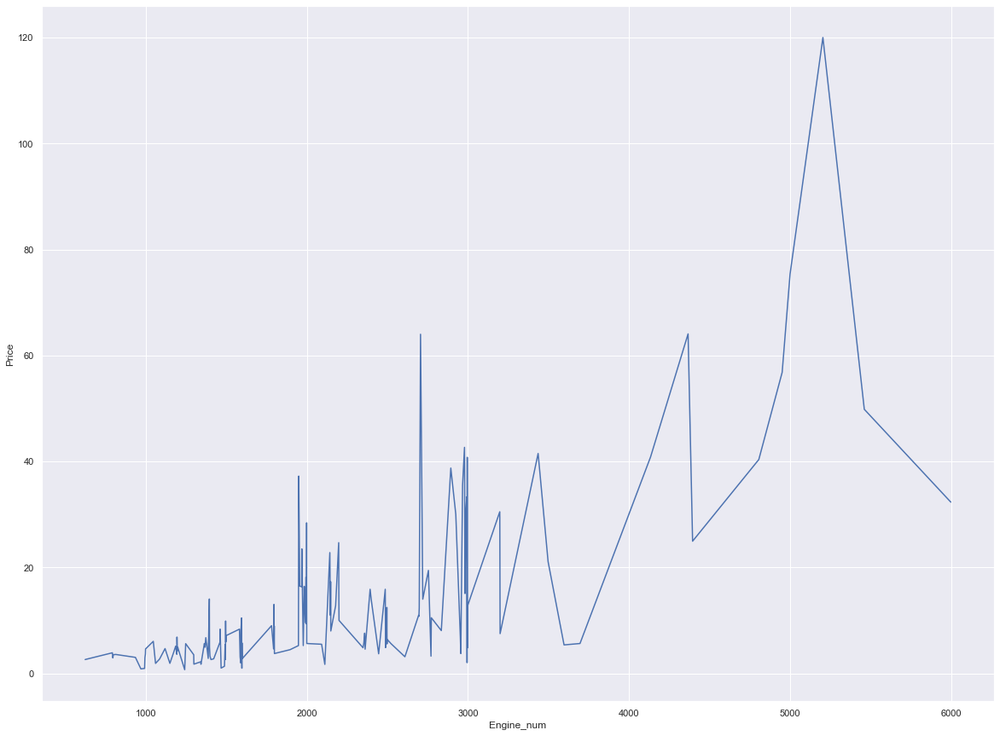

<IPython.core.display.Javascript object>

In [136]:
# create a lineplot
plt.figure(figsize=(20, 15))
sns.lineplot(y="Price", x="Engine_num", data=df, ci=None)

##### Cross `Power` and `Price` to get a best guess of linear relationship

<AxesSubplot:xlabel='Power', ylabel='Price'>

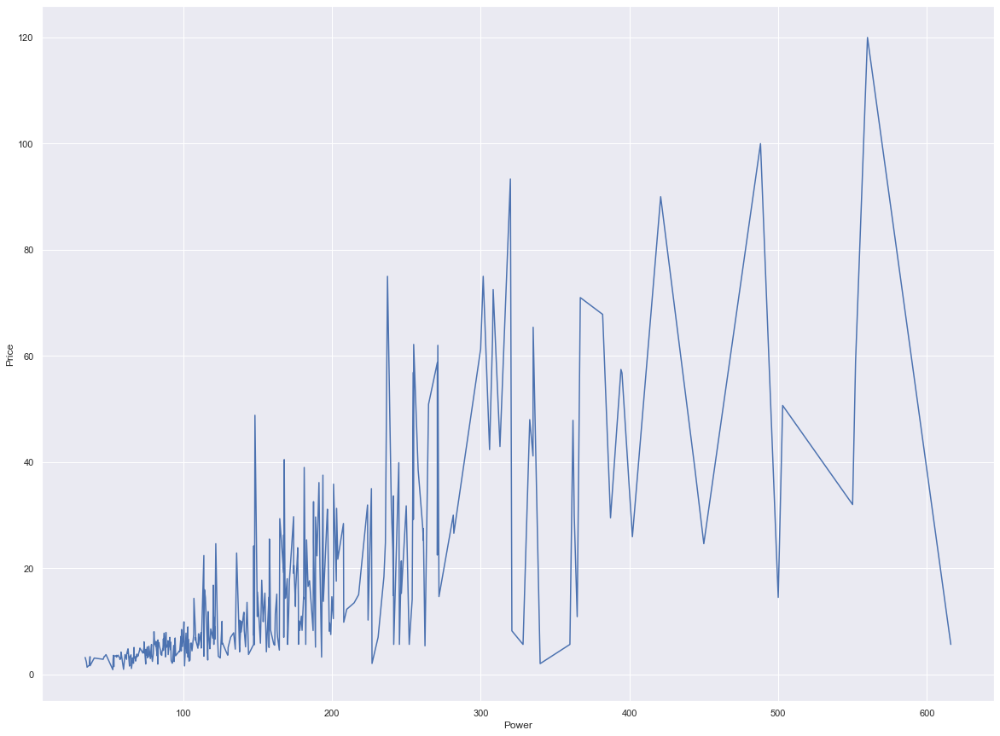

<IPython.core.display.Javascript object>

In [137]:
# create a lineplot
plt.figure(figsize=(20, 15))
sns.lineplot(y="Price", x="Power", data=df, ci=None)

**Temporal variables are specificly used based on the case and understanding how and when to apply them is due to time and lots of practice with them. It's always up to the DS to decide which vars to use and not. It's a subjective process.**

<AxesSubplot:xlabel='Year', ylabel='Price'>

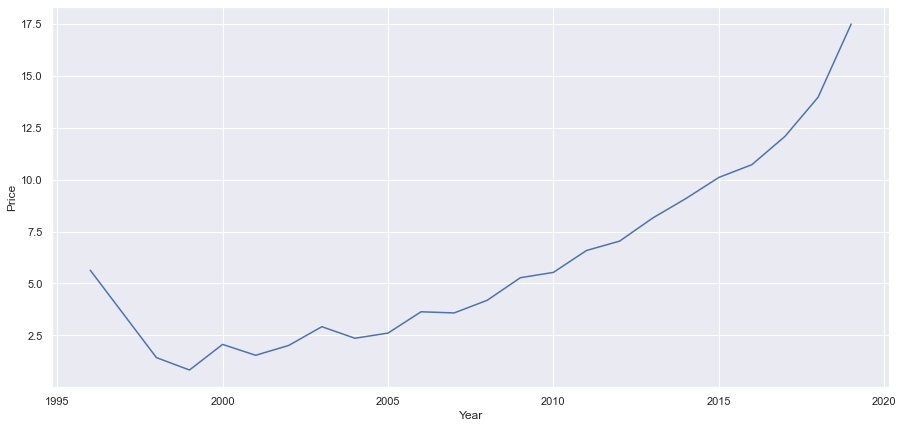

<IPython.core.display.Javascript object>

In [138]:
# average Price over the years
plt.figure(figsize=(15, 7))
sns.lineplot(x="Year", y="Price", data=df, ci=None)

**Observations**

- `Transmission` has a negative linear relationship with `Price` when moving from Automatic to Manual.
- `Engine` & `Power` appear to have positive linear relationships with `Price`.
- `Price` seems to increase over time.

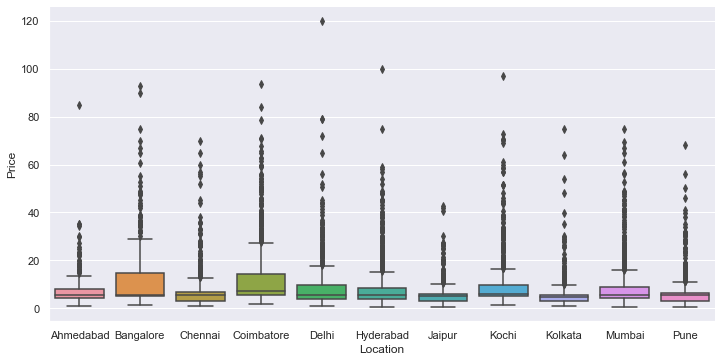

<IPython.core.display.Javascript object>

In [139]:
# barplot
sns.catplot(
    data=df, x=df["Location"], y=df["Price"], kind="box", orient="v", height=5, aspect=2
)

**Here are the correlations for looking into multicolinearity**

In [140]:
# Get correlation of each variable against price
df[df.columns[:]].corr().sort_values("Price", ascending=False)["Price"][:]

Price                1.00
price_log            0.85
Power                0.71
Engine_num           0.61
Year                 0.28
Seats                0.05
Kilometers_Driven   -0.16
Mileage_num         -0.30
Name: Price, dtype: float64

<IPython.core.display.Javascript object>

<AxesSubplot:>

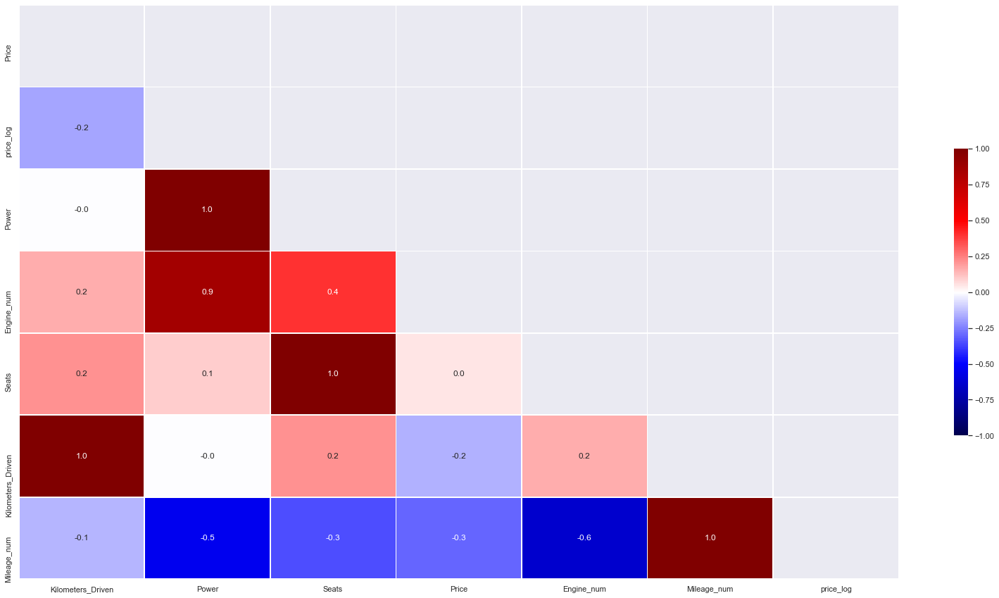

<IPython.core.display.Javascript object>

In [141]:
# GreatLearning code
numeric_columns = df.select_dtypes(include=np.number).columns.tolist()
numeric_columns.remove("Year")  # dropping year column as it is temporal variable
corr = (
    df[numeric_columns].corr().sort_values(by=["Price"], ascending=False)
)  # sorting correlations w.r.t Price

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(28, 15))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    corr,
    mask=np.triu(
        corr
    ),  # write a mask to exlucde anything that is less than 0.01 but not easy to work with
    cmap="seismic",
    annot=True,
    fmt=".1f",
    vmin=-1,
    vmax=1,
    center=0,
    square=False,
    linewidths=0.7,
    cbar_kws={"shrink": 0.5},
)

**Observations**

- Same correlations exist as previously stated between `Engine` and `Power` which may be why they are at the top.
- Because are closely related I will drop one of them to reduce Multicolinearity.
- No correlations are above .8 so I am not too worried about Multicorlinearity. I will drop later will needed.

`Price` as the dependent variable against every numeric variable colored for categoricals.

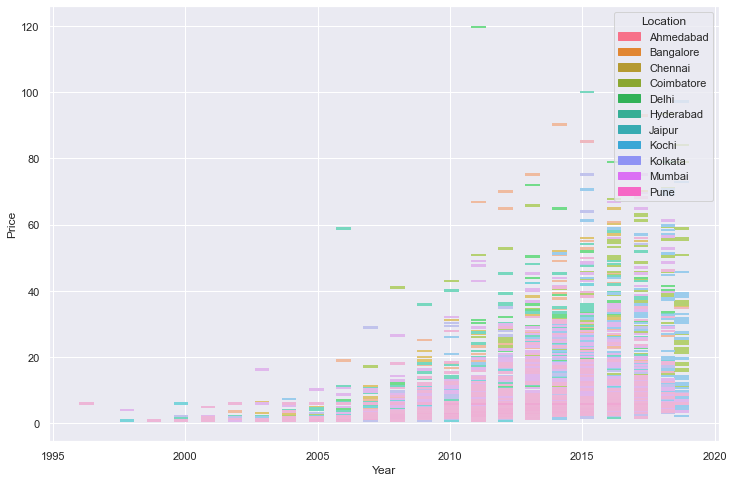

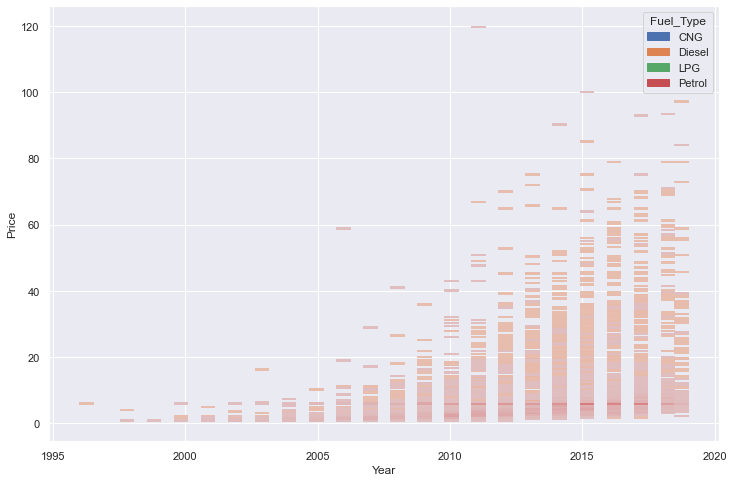

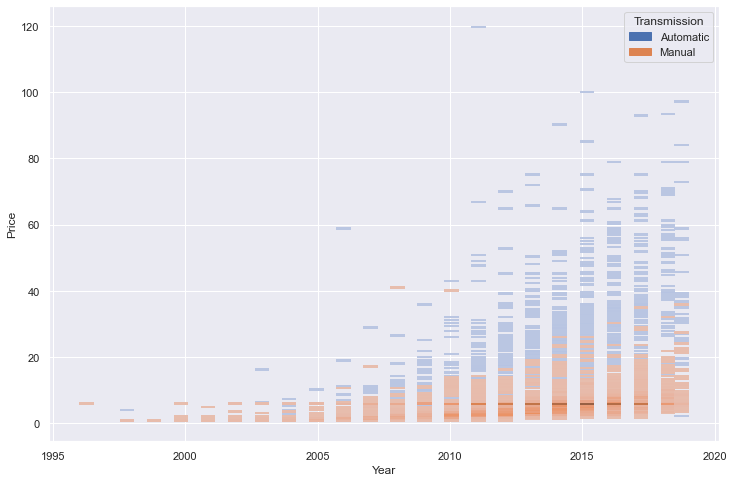

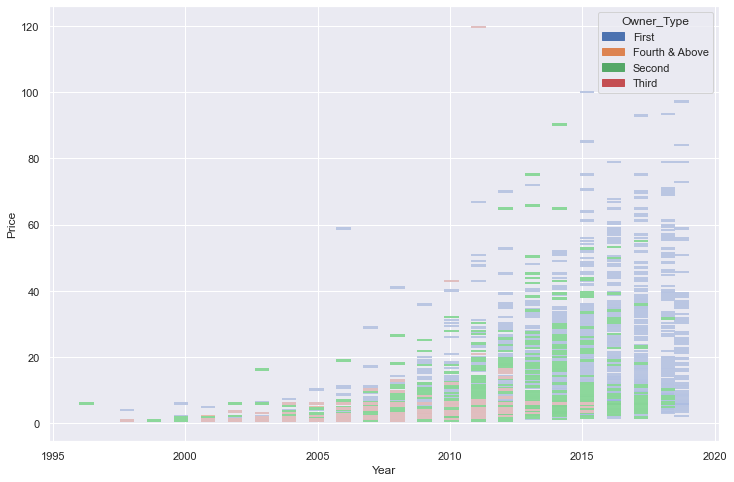

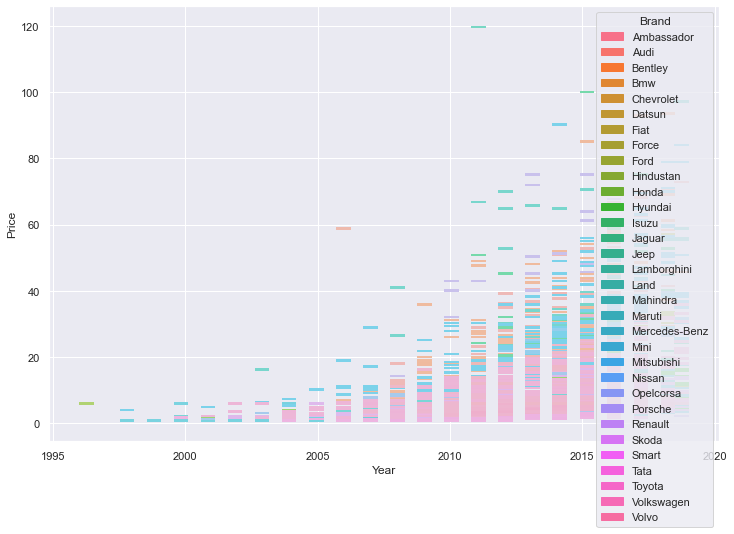

...

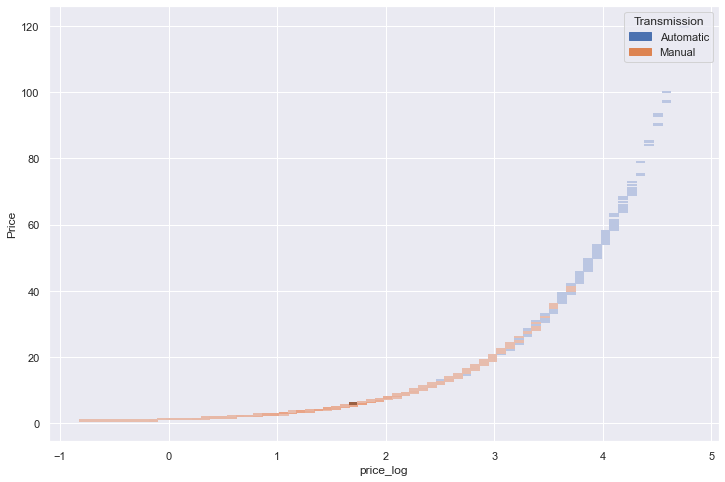

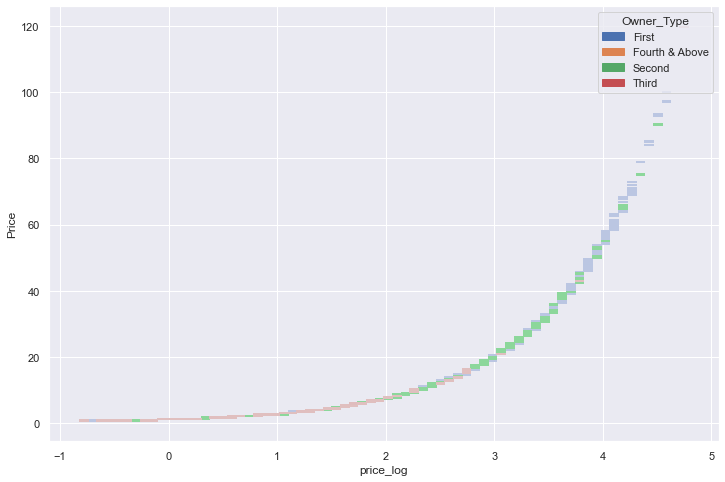

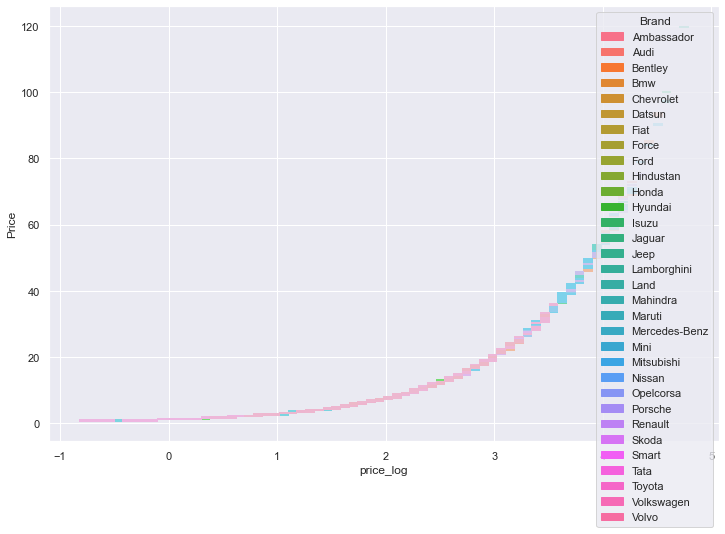

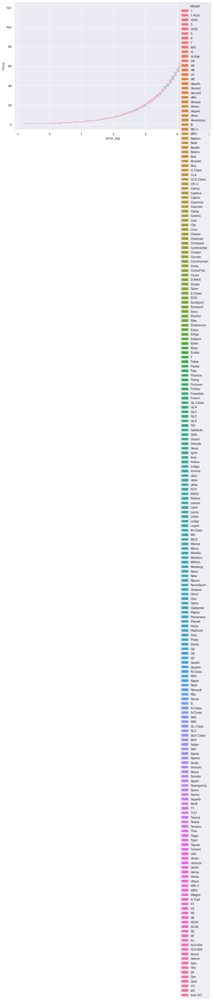

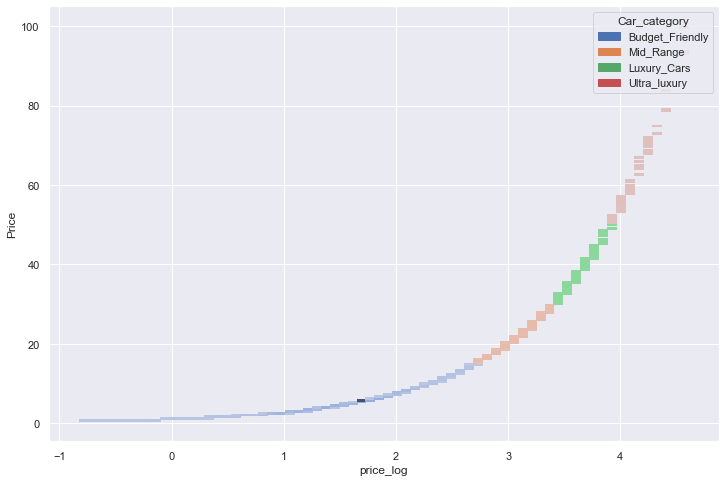

<IPython.core.display.Javascript object>

In [142]:
# Cross the numeric variables with Price and see the spread across the other categorical variables
for (column_name_c, column_data_c) in numerical_features.items():
    for (column_name, column_data) in categoricals.iteritems():
        sns.histplot(
            x=column_data_c,
            y=df.Price,
            data=df,
            hue=column_name,
            multiple="stack",
            shrink=0.8,
        )
        # plt.figure(figsize=(20,20))
        plt.show()

## Inferences
Key meaningful observations on the relationship between variables.

`S.No.` : 
 - Serial Number was added as an index column.

`Name` :
- Was changed into `Make` and `Model` to account for wrangling issues in visualization and will be useful to enconde for modeling.

`Location` : 
- Mumbai is the most popular city with over 800 records.
- Will need to be encoded for modeling and has a reasonable amount of categoricals to do so.
- Ahmedabad has the least records with 275 a spread of 525 records from Mumbai.

`Year` : 
- 2014 - 2016 are the most popular years for used cars that are for sale.
- Skew to the left with most years being above 2010.
- Older cars are not represented at all. Anything before 1995 doesn't make it into the dataset.

`Kilometers_driven` : 
 - The average kilometers driven in the car by the previous owner(s) in KM is 58699.06KM.
 - Is heavily skewed to the right with a variance of 7129993975.25. This may need treatment.
 - There is one vehicle at 6500000km driver which seems vastly unrealistic and will need to be treated.

`Fuel_Type` : 
 - The type of fuel used by the car. (Petrol, Diesel, Electric, CNG, LPG) with the vast majority being Diesel or Petrol.
 -  liquefied petroleum gas is included with a <1% repreentation.
 - 

`Transmission` : 
 - The type of transmission used by the cars are mostly Manual.
 - The automatic types only account for ~28% of all cars in the dataset.
 - These two types should be easy to build into the model after encoding.

`Owner` : 
 - Type of ownership is dominated by First owners.
 - There are nearly no cars that have passed more than 4 owners hands.
 - These 4 values should be easily handled with dummy variables for model building.

`Mileage` : 
 - The standard mileage offered by the car company ranges from 0 to 33.54.
 - The distribution is almost normal with a few outliers above 30mpL, this should make modeling easier.
 - A light negative correlation with `Power`.

`Engine` : 
 - The mean and median are fairly close at only 200 CC away from eachother. 50% lies above and below 1493.00 CC.
 - Is strongly negatively correlated with `Power` which is to be expected.
 - A slight negative correlation with `Mileage`.

`Power` : 
 - The maximum power of the engine in bhp in this dataset is 616bhp.
 - Quite a few outliers which look to be outside the 1.5*IQR - will need to handle before modeling.
 - 75% of the data lies below 138bhp.

`Seats` : 
 - 5 is the  number of seats in the car that dominates the dataset at 84% of all values.
 - There is one car with 0 seats which may have been a typo.
 - Seats is almost normally distributed which is easier for the modeling.

`New_Price` : 
 - The price of a new car of the same model in INR Lakhs.(1 Lakh = $100, 000 INR) is irrelevant as it's in a different market.
 - New Price has so many missing values (86%) that it was decided to drop the column for analysis.
 - As new car prices go up so do the sales of used cars and thus creating a shortage which should push up used car prices.

`Price` : The price of the used car in INR Lakhs (1 Lakh = $100, 000 INR)
 - Price has some correlation with `Power`.
 - The majority of the data is of used cars with 5.64Lakh value meaning over 500,000dollars which seams unrealistic but there are cars at the market price
 - The data is heavily right-skewed.
 
 `Brand`, `Model` and `Car_category`: has an obvious positive correlation with `Price`.

## Summary

Our main insights were:

    1. The `Price` estimate of central tendency (the mean (or other estimator) value) of used cars is much higher in Coimbatore and Bangalore than other locations.
    
    2. `Price` for Petrol vehicles are many outside of the mean in the positive direction.
    
    3.  Used cars with a Third owner tend to be before 2015 and have lower prices than other owners.

# <a id="link4">Model Building - Linear Regression</a>

1. Choose, train and evaluate an inferential model using Scikitlearn
2. Build the inferential model and comment on the model statistics using Statsmodel

## Dummy variables

**Encoding Categoricals**

***Notes from GreatLearning:***

"Many machine learning algorithms can support categorical values without further manipulation but there are many more algorithms that do not. 

Sometimes we want to one-hot encode where every level gets an indicator, but other times we want to drop one level to account for the fact that in a model we will have an intercept."

This is worth doing at the very end because for many earlier analysis tasks (e.g. visualization and value counts) it will be more convenient to keep categorical variables as a single column. Additionally, we'll want to make sure missing values are resolved by this point. 

In [143]:
ind_vars = df.select_dtypes(include=["object", "category"]).columns.tolist()
ind_vars

['Location',
 'Fuel_Type',
 'Transmission',
 'Owner_Type',
 'Brand',
 'Model',
 'Car_category']

<IPython.core.display.Javascript object>

With 217 Models to sort through I'm going to not take the effort of encoding them all and go ahead and drop that for our model. We still have Brand and Bins to help us make sense of the specific cars.

In [144]:
df.drop("Model", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [145]:
# get the size of the current df vs the original
(len(df) / 7253) * 100

99.90348821177444

<IPython.core.display.Javascript object>

In [146]:
# generate binary values using get_dummies dropping the 1st one
def encode_cat_vars(x):
    x = pd.get_dummies(
        x,
        columns=x.select_dtypes(include=["object", "category"]).columns.tolist(),
        drop_first=True,
    )
    return x


<IPython.core.display.Javascript object>

In [147]:
# apply function
ind_vars_num = encode_cat_vars(df)
ind_vars_num.head()

,Year,Kilometers_Driven,Power,Seats,Price,Engine_num,Mileage_num,price_log,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,Brand_Audi,Brand_Bentley,Brand_Bmw,Brand_Chevrolet,Brand_Datsun,Brand_Fiat,Brand_Force,Brand_Ford,Brand_Hindustan,Brand_Honda,Brand_Hyundai,Brand_Isuzu,Brand_Jaguar,Brand_Jeep,Brand_Lamborghini,Brand_Land,Brand_Mahindra,Brand_Maruti,Brand_Mercedes-Benz,Brand_Mini,Brand_Mitsubishi,Brand_Nissan,Brand_Opelcorsa,Brand_Porsche,Brand_Renault,Brand_Skoda,Brand_Smart,Brand_Tata,Brand_Toyota,Brand_Volkswagen,Brand_Volvo,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2010,72000,58.16,5,1.75,998,26.60,0.56,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2015,41000,126.20,5,12.50,1582,19.67,2.53,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2011,46000,88.70,5,4.50,1199,18.20,1.50,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2012,87000,88.76,7,6.00,1248,20.77,1.79,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2013,40670,140.80,5,17.74,1968,15.20,2.88,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


<IPython.core.display.Javascript object>

In [148]:
# check the df shape
ind_vars_num.shape

(7246, 59)

<IPython.core.display.Javascript object>

In [149]:
# get the size of the current df vs the original
(len(ind_vars_num) / 7253) * 100

99.90348821177444

<IPython.core.display.Javascript object>

In [150]:
# assign an object by another object
df = ind_vars_num

<IPython.core.display.Javascript object>

In [151]:
# get the size of the current df vs the original
(len(df) / 7253) * 100

99.90348821177444

<IPython.core.display.Javascript object>

We have ~60 columns to model with. We will probably cut this down considerably. We still have the majority of our data intact.

## Split Data
Split the data into train and test (can split training into Train and Validation since you do not report on the Training but only on the Test set.

At this point I will drop Price to look at price_log against each dependent variable.


In [152]:
# drop a column
df.drop("Price", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [153]:
# lets build our linear model
# independent variable by dropping out the Price variable
X = df.drop(["price_log"], axis=1)
# the dependent variable = Price
y = df[["price_log"]]

<IPython.core.display.Javascript object>

In [154]:
display(y.head())

,price_log
S.No.,
0,0.56
1,2.53
2,1.50
3,1.79
4,2.88


<IPython.core.display.Javascript object>

In [155]:
print(X.shape)
print(y.shape)

(7246, 57)
(7246, 1)


<IPython.core.display.Javascript object>

In [156]:
# Split X and y into training and test set in 70:30 ratio
# 70/30 split + psuedo randomness using random-seed to make a sort of scientific sample
# training and test set sizes should be equal
x_train, x_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=1
)

<IPython.core.display.Javascript object>

In [157]:
# print the size of each x split
print("Number of rows in train data =", x_train.shape[0])
print("Number of rows in train data =", x_test.shape[0])

Number of rows in train data = 5072
Number of rows in train data = 2174


<IPython.core.display.Javascript object>

In [158]:
# check the head
x_train.head()

,Year,Kilometers_Driven,Power,Seats,Engine_num,Mileage_num,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,Brand_Audi,Brand_Bentley,Brand_Bmw,Brand_Chevrolet,Brand_Datsun,Brand_Fiat,Brand_Force,Brand_Ford,Brand_Hindustan,Brand_Honda,Brand_Hyundai,Brand_Isuzu,Brand_Jaguar,Brand_Jeep,Brand_Lamborghini,Brand_Land,Brand_Mahindra,Brand_Maruti,Brand_Mercedes-Benz,Brand_Mini,Brand_Mitsubishi,Brand_Nissan,Brand_Opelcorsa,Brand_Porsche,Brand_Renault,Brand_Skoda,Brand_Smart,Brand_Tata,Brand_Toyota,Brand_Volkswagen,Brand_Volvo,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2080,2014,71000,126.32,5,1582,19.08,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
62,2015,58000,186.00,5,1796,11.74,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6978,2008,131000,105.00,5,1896,15.00,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3502,2015,54339,88.73,5,1396,22.54,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2156,2014,105044,100.60,7,2494,12.99,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


<IPython.core.display.Javascript object>

## ScikitLearn Model

In [159]:
# is a best practice keep code minimal, can change the function that the object is holding but then the rest can run smoothly
# gives LinearRegression model
linearregression = LinearRegression()  # build a regression model from scikitlearn
# fitting the linear regression model on the train data (70% of the whole data)
linearregression.fit(x_train, y_train)

LinearRegression()

<IPython.core.display.Javascript object>

In [160]:
# create the intercept
intercept = linearregression.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is -181.12333731112986


<IPython.core.display.Javascript object>

### Coefficients & Intercept 

In [161]:
# create coefficients and intercept on dataframe

coef_df = pd.DataFrame(
    np.append(linearregression.coef_[0], linearregression.intercept_[0]),
    index=x_train.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)

coef_df

,Coefficients
Year,0.09
Kilometers_Driven,-0.00
Power,0.00
Seats,0.01
Engine_num,0.00
Mileage_num,-0.01
Location_Bangalore,0.07
Location_Chennai,0.00
Location_Coimbatore,0.05
Location_Delhi,-0.05


<IPython.core.display.Javascript object>

## <a id='link5'>Statsmodels Model</a>

We will now perform linear regression using *statsmodels*, a Python module that provides functions for the estimation of many statistical models, as well as for conducting statistical tests, and statistical data exploration.

Using statsmodels, we will be able to check the statistical validity of our model.

### Model 1: Olsmodel, df , x_train

In [162]:
# Statsmodel api does not add a constant by default. We need to add it explicitly.
x_train = sm.add_constant(x_train)
# Add constant to test data
x_test = sm.add_constant(x_test)


def build_ols_model(train):
    # Create the model
    olsmodel = sm.OLS(y_train["price_log"], train)
    return olsmodel.fit()


olsmodel = build_ols_model(x_train)
print(olsmodel.summary())

                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.825
Model:                            OLS   Adj. R-squared:                  0.823
Method:                 Least Squares   F-statistic:                     429.1
Date:                Fri, 20 Aug 2021   Prob (F-statistic):               0.00
Time:                        06:55:51   Log-Likelihood:                -1622.4
No. Observations:                5072   AIC:                             3357.
Df Residuals:                    5016   BIC:                             3723.
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

<IPython.core.display.Javascript object>

### Interpreting the Regression

**Notes from GreatLearning:**

1. **Adjusted. R-squared**: It reflects the fit of the model.
    - Adjusted R-squared values generally range from 0 to 1, where a higher value generally indicates a better fit, assuming certain conditions are met.
    - In our case, the value for Adj. R-squared is **0.82**, which is good.


2. ***const* coefficient**: It is the Y-intercept.
    - It means that if all the dependent variable (features like `Brand`, `Engine`, `Seats` and so on) coefficients are zero, then the expected output (i.e., Y) would be equal to the *const* coefficient.
    - In our case, the value for *const* coefficient is ** -23.6193 **


3. MOST IMPORATNT THING! **Coefficient of an independent variable**: It represents the change in the output Y due to a change in the independent variable (everything else held constant).

- Negative values of the coefficient show that `Price` decreases with the increase of corresponding attribute value.
  These are: `Seats`, `Kilometers_Driven`, and others.

- Positive values of the coefficient show that `Price` increases with the increase of corresponding attribute value.
  These are: `Year, `Mileage`, and others.


5. **std err**: It reflects the level of accuracy of the coefficients.
    - The lower it is, the higher is the level of accuracy. We see that those cars with few records have lower scores.


6. **P>|t|**: It is p-value. P is low, not = 0, higher significance. 

- p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.
   
    * For each independent feature, there is a null hypothesis and an alternate hypothesis. Here $\beta_i$ is the coefficient of the $i$th independent variable.

        - $H_o$ : Independent feature is not significant ($\beta_i = 0$)
        - $H_a$ : Independent feature is that it is significant ($\beta_i \neq 0$)

    * (P>|t|) gives the p-value for each independent feature to check that null hypothesis. We are considering 0.05 (5%) as significance level.
        
        - A p-value of less than 0.05 is considered to be statistically significant.
        - But these variables might contain multicollinearity, which will affect the p-values.
        

7. **Confidence Interval**: It represents the range in which our coefficients are likely to fall (with a likelihood of 95%).

**Observations**:
- Our adjusted R^2 is 0.82 which accounts for ~82% of the error variance, which is good.
- There a number of high (above 0.05) p-values noticed.
- The constant coefficient is low at ~-181 points for every change in the dependent variable.

We have build a linear regression model which shows multicolinearity and is highly accurate.

But this is **not** our final model. We have to check the statistical validity of the model, and also make sure it satisfies the assumptions of linear regression.

### <a id="link6">Inferential Model Performance</a>

Evaluate the model on different performance metrics and comment on the performance and scope of improvement

**Let's check the performance of the model using different metrics (MAE, MAPE, RMSE, $R^2$).**

* We will be using metric functions defined in sklearn for RMSE, MAE, and $R^2$.
* We will define a function to calculate MAPE.
* We will create a function which will print out all the above metrics in one go.

In [163]:
# defining function for MAPE from GreatLearning
import math

# RMSE
def rmse(predictions, targets):
    return np.sqrt(((targets - predictions) ** 2).mean())


# MAPE
def mape(predictions, targets):
    return np.mean(np.abs((targets - predictions)) / targets) * 100


# MAE
def mae(predictions, targets):
    return np.mean(np.abs((targets - predictions)))


# Model Performance on test and train data
def model_pref(olsmodel, x_train, x_test):

    # Insample Prediction
    y_pred_train_pricelog = olsmodel.predict(x_train)
    y_pred_train_Price = y_pred_train_pricelog
    y_train_Price = y_train["price_log"]

    # Prediction on test data
    y_pred_test_pricelog = olsmodel.predict(x_test)
    y_pred_test_Price = y_pred_test_pricelog
    y_test_Price = y_test["price_log"]

    print(
        pd.DataFrame(
            {
                "Data": ["Train", "Test"],
                "RMSE": [
                    rmse(y_pred_train_Price, y_train_Price),
                    rmse(y_pred_test_Price, y_test_Price),
                ],
                "MAE": [
                    mae(y_pred_train_Price, y_train_Price),
                    mae(y_pred_test_Price, y_test_Price),
                ],
                "MAPE": [
                    mape(y_pred_train_Price, y_train_Price),
                    mape(y_pred_test_Price, y_test_Price),
                ],
            }
        )
    )

<IPython.core.display.Javascript object>

- The mean absolute percentage error (MAPE) measures the accuracy of predictions as a percentage, and can be calculated as the average absolute percent error for each predicted value minus actual values divided by actual values. It works best if there are no extreme values in the data and none of the actual values are 0.


- The mean absolute error (MAE) is the simplest regression error metric to understand. We'll calculate the residual for every data point, taking only the absolute value of each so that negative and positive residuals do not cancel out. We then take the average of all these residuals. Effectively, MAE describes the typical magnitude of the residuals.


- The root mean square error (RMSE) is just like the MAE, but squares the difference before summing them all instead of using the absolute value, and then takes the square root of the value.


- $R^2$ (or coefficient of determination) represents the proportion of variance (of y) that has been explained by the independent variables in the model. It provides an indication of goodness of fit of the model. Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that always predicts the expected value (or mean) of y, disregarding the input features, would get a $R^2$ of 0.0.

In [164]:
# Checking model performance
model_pref(olsmodel, x_train, x_test)

    Data  RMSE  MAE  MAPE
0  Train  0.33 0.25   inf
1   Test  0.33 0.25   inf


<IPython.core.display.Javascript object>

**Observations**
* Root Mean Squared Error of train and test data is slightly different, indicating that our model is overfitting the test data. 

* Mean Absolute Error indicates that our current model is able to predict used cars prices within mean error of .25(log-odds) lakhs on test data.

* Mean Absolute Percentage Error is inf because it is dividing by 0 in some cases.

The units of both RMSE and MAE are same - Lakhs in this case. But RMSE is greater than MAE because it peanalises the outliers more.



# <a id="link5">Statistics: Linear Regression Assumption Tests</a>

We need to deal with multicollinearity and check the other assumptions of linear regression first, and then look at the p-values.

Perform tests for the assumptions of the linear regression. We will be checking the following Linear Regression assumptions to prevent error in inference or insights:

**1. No Multicollinearity** (correlation is too tight between two variables and inflates the co-efficient)

**2. Mean of residuals should be 0**

**3. No Heteroscedasticity**

**4. Linearity of variables**

**5. Normality of error terms** (important for calculating co-efficients)

### No Multicollinearity

* Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent. If the correlation between variables is high, it can cause problems when we fit the model and interpret the results. When we have multicollinearity the linear model, The coefficients that the model suggests are unreliable.


* There are different ways of detecting (or testing) multicollinearity. One such way is by using Variation Inflation Factor.


* **Variance  Inflation  factor**:  Variance inflation factors measure the inflation in the variances of the regression parameter estimates due to collinearities that exist among the  predictors.  It  is  a  measure  of  how  much  the  variance  of  the  estimated  regression coefficient $\beta_k$ is "inflated" by  the  existence  of  correlation  among  the  predictor variables in the model. 


* **General Rule of thumb**: If VIF is 1 then there is no correlation among the $k$th predictor and the remaining predictor variables, and  hence, the variance of $\beta_k$ is not inflated at all. Whereas, if VIF exceeds 5 or is close to exceeding 5, we say there is moderate multicollinearity, and if it is 10 or exceeding 10, it shows signs of high multicollinearity.

In [165]:
def checking_vif(train):
    vif = pd.DataFrame()
    vif["feature"] = train.columns

    # calculating VIF for each feature
    vif["VIF"] = [
        variance_inflation_factor(train.values, i) for i in range(len(train.columns))
    ]
    return vif


# print(checking_vif(x_train))

<IPython.core.display.Javascript object>

Features having a VIF score >5 will be dropped/treated till all the features have a VIF score <5

In [166]:
# Check VIF
checking_vif(x_train)

,feature,VIF
0,const,770317.64
1,Year,2.04
2,Kilometers_Driven,1.62
3,Power,8.78
4,Seats,2.53
5,Engine_num,10.05
6,Mileage_num,3.89
7,Location_Bangalore,2.42
8,Location_Chennai,3.03
9,Location_Coimbatore,3.48


<IPython.core.display.Javascript object>

* `Engine`, others, and `Power` has a VIF score of much greater than 5. Clearly these 2 variables are correlated with each other.
* `Brand` have lots of multicolinearity. 
This does seem to make intuitive sense because the number of CC's and bhp would have a significant overlap as size is related to horsepower since a large engine should in theory produce more power.

I will need to drop some columns to make this handle correctly.

### Model 2: olsmodel1, df1,xtrain1

#### Handling large independent variables. 
Since `Brand` is binned by economic categories that we created earlier lets drop them and create a lighter model to test.

In [167]:
# get a list of columns that do not have "Brand" in the title
cols = [c for c in df.columns if c.title()[:5] != "Brand"]

<IPython.core.display.Javascript object>

In [168]:
# create a new dataframe and read the head
df1 = df[cols]
df1.head()

,Year,Kilometers_Driven,Power,Seats,Engine_num,Mileage_num,price_log,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2010,72000,58.16,5,998,26.60,0.56,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1,2015,41000,126.20,5,1582,19.67,2.53,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0
2,2011,46000,88.70,5,1199,18.20,1.50,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0
3,2012,87000,88.76,7,1248,20.77,1.79,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
4,2013,40670,140.80,5,1968,15.20,2.88,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0


<IPython.core.display.Javascript object>

In [169]:
# We will have to create the x and y datasets again
ind_vars = df1.drop(["price_log"], axis=1)
dep_var = df1[["price_log"]]

# Dummy encoding
ind_vars_num = encode_cat_vars(ind_vars)

# Splitting data into train and test
x_train1, x_test1, y_train1, y_test1 = train_test_split(
    ind_vars_num, dep_var, test_size=0.3, random_state=1
)

print("Number of rows in train data =", x_train1.shape[0])
print("Number of rows in train data =", x_test1.shape[0], "\n\n")

# Statsmodel api does not add a constant by default. We need to add it explicitly.
x_train1 = sm.add_constant(x_train1)
# Add constant to test data
x_test1 = sm.add_constant(x_test1)

# Fit linear model on new dataset and print the summary()
olsmodel1 = build_ols_model(x_train1)
print(olsmodel1.summary())

Number of rows in train data = 5072
Number of rows in train data = 2174 


                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                     816.8
Date:                Fri, 20 Aug 2021   Prob (F-statistic):               0.00
Time:                        06:55:53   Log-Likelihood:                -1852.7
No. Observations:                5072   AIC:                             3759.
Df Residuals:                    5045   BIC:                             3936.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<IPython.core.display.Javascript object>

The R squared and adjusted r squared values have decreased which indicates that we have been able to capture less of the information of the previous model after reducing the number of predictor features. 

As we try to decrease overfitting, the r squared of our train model is expected to decrease.

#### Check VIF

In [170]:
# Check VIF
print(checking_vif(x_train1))

                      feature       VIF
0                       const 714972.56
1                        Year      1.90
2           Kilometers_Driven      1.57
3                       Power      6.53
4                       Seats      1.89
5                  Engine_num      8.10
6                 Mileage_num      3.26
7          Location_Bangalore      2.41
8            Location_Chennai      3.00
9         Location_Coimbatore      3.46
10             Location_Delhi      3.09
11         Location_Hyderabad      3.73
12            Location_Jaipur      2.67
13             Location_Kochi      3.46
14           Location_Kolkata      3.09
15            Location_Mumbai      3.88
16              Location_Pune      3.50
17           Fuel_Type_Diesel     28.45
18              Fuel_Type_LPG      1.16
19           Fuel_Type_Petrol     29.39
20        Transmission_Manual      1.96
21  Owner_Type_Fourth & Above      1.02
22          Owner_Type_Second      1.18
23           Owner_Type_Third      1.12


<IPython.core.display.Javascript object>

We have a large number of high VIF scores that need treatment.

#### Check Model Performance

In [171]:
# Checking model performance
model_pref(olsmodel1, x_train1, x_test1)  # No Overfitting.

    Data  RMSE  MAE  MAPE
0  Train  0.35 0.26   inf
1   Test  0.33 0.26   inf


<IPython.core.display.Javascript object>

* The RMSE has increased on both test and training sets meaning residual distance has increased.
* The RMSE values not being closer indicates model fit as same as last model (+2points) and not overfitting.
* MAE increased on training and test compared to the last model meaning our typical magnitude of the residuals has increased.

### Model 3: df2, x_train2-3, Dropping `Engine_num` and others

#### Removing Multicollinearity

To remove multicollinearity

1. Drop every column one by one that has VIF score greater than 5.
2. Look at the adjusted R-squared of all these models.
3. Drop the variable that makes least change in adjusted R-squared.
4. Check the VIF scores again.
5. Continue till you get all VIF scores under 5.

**Our highest VIF offenders are in order:**

Fuel_Type_Petrol   29.39

Fuel_Type_Diesel    28.45

Engine_num    8.10

In [173]:
# get a column of column names
high_vif_columns = [
    "Engine_num",
    "Fuel_Type_Diesel",
    "Fuel_Type_Petrol",
]

# input the last model's test and train df's into the function
treating_multicollinearity(high_vif_columns, x_train1, x_test1)

                col  Adj_rsq_after_dropping_col  Test RMSE
2  Fuel_Type_Petrol                        0.81       0.33
1  Fuel_Type_Diesel                        0.81       0.34
0        Engine_num                        0.80       0.34





<IPython.core.display.Javascript object>

Our Adjusted R-squared stays the same if we remove `Engine`. This is a clear indication that we have been able to create a very good model that is able to explain variance in price of used cars with up to 81% accurary.

However, RMSE has increased if we remove `Fuel Type` meaning the gap in our residuals has grown and we want this to be as low as possible to be accurate in how the model predicts the response. 

"Lower values of RMSE indicate better fit. RMSE is a good measure of how accurately the model predicts the response, and it is the most important criterion for fit if the main purpose of the model is prediction."<a href="https://www.theanalysisfactor.com/assessing-the-fit-of-regression-models/">Source</a>

Let's drop one just to see.

**Drop`Fuel_Type_Petrol`**

In [174]:
# we drop the one with the highest vif values and check the adjusted R-squared
x_train2 = x_train1.drop("Fuel_Type_Petrol", axis=1)
x_train2.head()

,const,Year,Kilometers_Driven,Power,Seats,Engine_num,Mileage_num,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_LPG,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,,,,,,,,,,,,,,
2080,1.00,2014,71000,126.32,5,1582,19.08,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
62,1.00,2015,58000,186.00,5,1796,11.74,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6978,1.00,2008,131000,105.00,5,1896,15.00,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0
3502,1.00,2015,54339,88.73,5,1396,22.54,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,0,0,0
2156,1.00,2014,105044,100.60,7,2494,12.99,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0


<IPython.core.display.Javascript object>

In [175]:
# create VIF scores
vif_series2 = pd.Series(
    [variance_inflation_factor(x_train2.values, i) for i in range(x_train2.shape[1])],
    index=x_train2.columns,
)
print("VIF Scores: \n\n{}\n".format(vif_series2))

VIF Scores: 

const                       714843.18
Year                             1.90
Kilometers_Driven                1.57
Power                            6.52
Seats                            1.89
Engine_num                       7.99
Mileage_num                      3.08
Location_Bangalore               2.41
Location_Chennai                 3.00
Location_Coimbatore              3.46
Location_Delhi                   3.09
Location_Hyderabad               3.73
Location_Jaipur                  2.67
Location_Kochi                   3.46
Location_Kolkata                 3.09
Location_Mumbai                  3.88
Location_Pune                    3.50
Fuel_Type_Diesel                 2.11
Fuel_Type_LPG                    1.01
Transmission_Manual              1.96
Owner_Type_Fourth & Above        1.02
Owner_Type_Second                1.18
Owner_Type_Third                 1.12
Car_category_Mid_Range           1.45
Car_category_Luxury_Cars         1.38
Car_category_Ultra_luxury        1.2

<IPython.core.display.Javascript object>

We have lowered the Fuel_Type_Diesel VIF and brought them closer to 5. Now we have `Power` and `Engine_num` to handle.

**Create Model 3 and score**

In [176]:
# we drop the one with the highest vif values and check the adjusted R-squared
high_vif_columns = [
    "Engine_num",
    # "Fuel_Type_Diesel",
    "Fuel_Type_Petrol",
    "Power",
]

# create a new dataframe and read the head
df2 = df1.drop(high_vif_columns, axis=1)
df2.head()

# We will have to create the x and y datasets again
ind_vars = df2.drop(["price_log"], axis=1)
dep_var = df2[["price_log"]]

# Dummy encoding
ind_vars_num = encode_cat_vars(ind_vars)

# Splitting data into train and test
x_train3, x_test3, y_train3, y_test3 = train_test_split(
    ind_vars_num, dep_var, test_size=0.3, random_state=1
)

# Statsmodel api does not add a constant by default. We need to add it explicitly.
x_train3 = sm.add_constant(x_train3)
# Add constant to test data
x_test3 = sm.add_constant(x_test3)

<IPython.core.display.Javascript object>

In [177]:
# create VIF scores
vif_series3 = pd.Series(
    [variance_inflation_factor(x_train3.values, i) for i in range(x_train3.shape[1])],
    index=x_train3.columns,
)
print("VIF Scores: \n\n{}\n".format(vif_series3))

VIF Scores: 

const                       714213.66
Year                             1.89
Kilometers_Driven                1.56
Seats                            1.58
Mileage_num                      2.01
Location_Bangalore               2.41
Location_Chennai                 3.00
Location_Coimbatore              3.46
Location_Delhi                   3.09
Location_Hyderabad               3.73
Location_Jaipur                  2.67
Location_Kochi                   3.45
Location_Kolkata                 3.08
Location_Mumbai                  3.88
Location_Pune                    3.49
Fuel_Type_Diesel                 1.56
Fuel_Type_LPG                    1.01
Transmission_Manual              1.68
Owner_Type_Fourth & Above        1.01
Owner_Type_Second                1.18
Owner_Type_Third                 1.12
Car_category_Mid_Range           1.38
Car_category_Luxury_Cars         1.26
Car_category_Ultra_luxury        1.12
dtype: float64



<IPython.core.display.Javascript object>

We passed the Multicolinearity Test and can create our new model.

In [178]:
print("Number of rows in train data =", x_train3.shape[0])
print("Number of rows in train data =", x_test3.shape[0], "\n\n")

# Fit linear model on new dataset and print the summary()
olsmodel2 = build_ols_model(x_train3)
print(olsmodel2.summary())

Number of rows in train data = 5072
Number of rows in train data = 2174 


                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.780
Method:                 Least Squares   F-statistic:                     782.9
Date:                Fri, 20 Aug 2021   Prob (F-statistic):               0.00
Time:                        06:55:54   Log-Likelihood:                -2186.4
No. Observations:                5072   AIC:                             4421.
Df Residuals:                    5048   BIC:                             4577.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<IPython.core.display.Javascript object>

In [179]:
# Checking model performance
model_pref(olsmodel2, x_train3, x_test3)  # No Overfitting.

    Data  RMSE  MAE  MAPE
0  Train  0.37 0.29   inf
1   Test  0.37 0.29   inf


<IPython.core.display.Javascript object>

**Adj. R-squared:** decreased 2% from the previous model as expected but is still a respectable 78% accuracy score.

**RMSE:**: Increased on training and test saying that our fit has decreased. The training and test sets have moved closer to each other indicating that the model is not overfitting the training data anymore. But RMSE is greater than MAE because it peanalises the outliers more.

**MAE:**: Increased on training and test saying that our fit has decreased. Meaning that our current model is able to predict used cars prices within mean error of 29% lakhs on test data.

**MAPE:** Has 0's in it so it returns an error.

### Model 4: df3, x_train4, dropping all high p-values

#### Increase statistical significance

Remove those variable where p-value is above 0.05 and re-run the model, thus making the A-R^2 GO UP (reduced error).

In [180]:
# Drop 'Kilometers_Driven_log' from train and test
cols_to_drop = ["Kilometers_Driven","Location_Hyderabad","Fuel_Type_LPG","Location_Mumbai","Owner_Type_Fourth & Above","Location_Kochi","Location_Bangalore", "Location_Chennai", "Location_Coimbatore", "Location_Delhi", "Mileage_num"] #"Kilometers_Driven_log"

# we drop the one with the highest vif values and check the adjusted R-squared
x_train4 = x_train3.drop(cols_to_drop, axis=1)


# lock the new data frame
#x_train3 = x_train2.loc[:, ~x_train2.columns.str.startswith(col_to_drop)]
#x_test3 = x_test2.loc[:, ~x_test2.columns.str.startswith(col_to_drop)]


<IPython.core.display.Javascript object>

In [181]:
x_train4.head()

,const,Year,Seats,Location_Jaipur,Location_Kolkata,Location_Pune,Fuel_Type_Diesel,Transmission_Manual,Owner_Type_Second,Owner_Type_Third,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,
2080,1.00,2014,5,0,0,0,1,0,1,0,0,0,0
62,1.00,2015,5,0,0,0,0,0,0,0,1,0,0
6978,1.00,2008,5,0,0,0,1,1,0,0,0,0,0
3502,1.00,2015,5,0,0,1,1,1,1,0,0,0,0
2156,1.00,2014,7,1,0,0,1,1,0,0,0,0,0


<IPython.core.display.Javascript object>

In [182]:
# create VIF scores
vif_series3 = pd.Series(
    [variance_inflation_factor(x_train4.values, i) for i in range(x_train4.shape[1])],
    index=x_train4.columns,
)
print("VIF Scores: \n\n{}\n".format(vif_series3))

VIF Scores: 

const                       478325.68
Year                             1.26
Seats                            1.12
Location_Jaipur                  1.04
Location_Kolkata                 1.05
Location_Pune                    1.06
Fuel_Type_Diesel                 1.20
Transmission_Manual              1.45
Owner_Type_Second                1.15
Owner_Type_Third                 1.10
Car_category_Mid_Range           1.31
Car_category_Luxury_Cars         1.21
Car_category_Ultra_luxury        1.08
dtype: float64



<IPython.core.display.Javascript object>

In [183]:
print("Number of rows in train data =", x_train4.shape[0])
# print("Number of rows in train data =", x_test4.shape[0], "\n\n")

# Fit linear model on new dataset and print the summary()
olsmodel4 = build_ols_model(x_train4)
print(olsmodel4.summary())

Number of rows in train data = 5072
                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                     1310.
Date:                Fri, 20 Aug 2021   Prob (F-statistic):               0.00
Time:                        06:55:54   Log-Likelihood:                -2455.8
No. Observations:                5072   AIC:                             4938.
Df Residuals:                    5059   BIC:                             5022.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

<IPython.core.display.Javascript object>

**Observations**

- We have removed multicolinearity.

* We can see adj. R-squared for *olsmod1* is 0.807 and *olsmod4* is 0.799, a reduction after removing `Power` vs `Engine` and others and thus *olsmod4* will be what we move foward with.

* Now the above model has insignificant variables.

**Now no feature has p-value greater than 0.05, so we'll consider the features in *X_train4* as the final ones and *olsres4* as final model.**

## Mean of the Residuals should be 0

Shows that the line of best fit is accurately drawn.

In [184]:
# get the residual factors and then the mean
residuals = olsmodel4.resid
np.mean(residuals)

-1.294271065190537e-11

<IPython.core.display.Javascript object>

* Mean of redisuals is very close to 0. The second assumption is also satisfied.

## No Heteroscedasticity

* Test - goldfeldquandt test

* **Homoscedacity**: If the variance of the residuals are symmetrically distributed across the regression line, then the data is said to homoscedastic.

* **Heteroscedacity**: If the variance is unequal for the residuals across the regression line, then the data is said to be heteroscedastic. In this case the residuals can form an arrow shape or any other non symmetrical shape.

For goldfeldquandt test, the null and alternate hypotheses are as follows:

- Null hypothesis : Residuals are homoscedastic
- Alternate hypothesis : Residuals have heteroscedasticity

alpha = 0.05 

In [185]:
# create goldfeldquandt test
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(residuals, x_train3)
lzip(name, test)

[('F statistic', 1.0562479984087707), ('p-value', 0.08516681687499524)]

<IPython.core.display.Javascript object>

Since p-value > 0.05 we cannot reject the Null Hypothesis that the residuals are homoscedastic. 

Assumptions 3 is also satisfied by our olsmodel3.

**Since p-value > 0.05, we can say that the residuals are homoscedastic. This assumption is therefore met in the data.**

## Linearity of Variables

**Why the test?**
* Linearity describes a straight-line relationship between two variables, predictor variables must have a linear relation with the dependent variable.

**How to check linearity?**

* Make a plot of fitted values vs residuals, if they don't follow any pattern, they we say the model is linear, otherwise model is showing signs of non-linearity.

**How to fix if this assumption is not followed?**

* We can try to transform the variables and make the relationships linear.

In [186]:
# get the residual factors and then the mean
residual = olsmodel4.resid
fitted = olsmodel4.fittedvalues  # predicted values

<IPython.core.display.Javascript object>

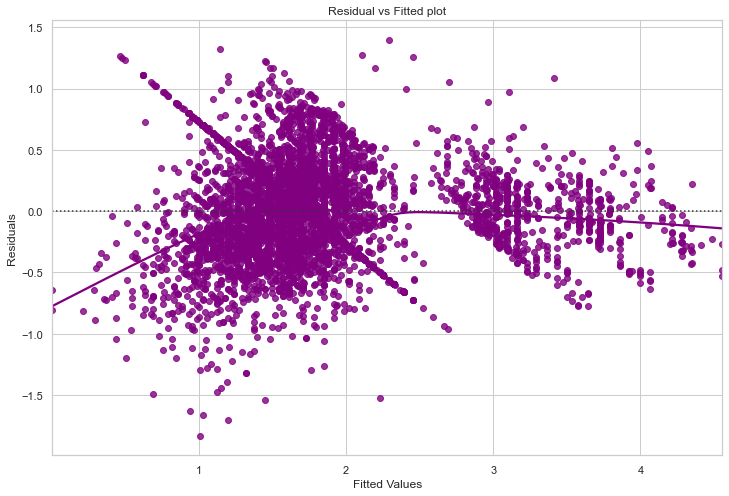

<IPython.core.display.Javascript object>

In [187]:
# create a residual plot
sns.set_style("whitegrid")
sns.residplot(fitted, residual, color="purple", lowess=True)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residual vs Fitted plot")
plt.show()

* Scatter plot shows the distribution of residuals (errors) vs fitted values (predicted values).

* If there exist any pattern in this plot, we consider it as signs of non-linearity in the data and a pattern means that the model doesn't capture non-linear effects.

* **We do see a negative linear pattern mixed with a uniform pattern so we will need to fix this but as I do not know the best way to do this I will continue.**

## Normality of Error Terms

**What is the test?**

* Error terms/Residuals should be normally distributed

* If the error terms are non- normally distributed, confidence intervals may become too wide or narrow. Once confidence interval becomes unstable, it leads to difficulty in estimating coefficients based on minimization of least squares.

**What do non-normality indicate?**

* It suggests that there are a few unusual data points which must be studied closely to make a better model.

**How to Check the Normality?**

* It can be checked via QQ Plot, Residuals following normal distribution will make a straight line plot otherwise not.

* Other test to check for normality : Shapiro-Wilk test.

**What is the residuals are not-normal?**

* We can apply transformations like log, exponential, arcsinh, etc. as per our data.

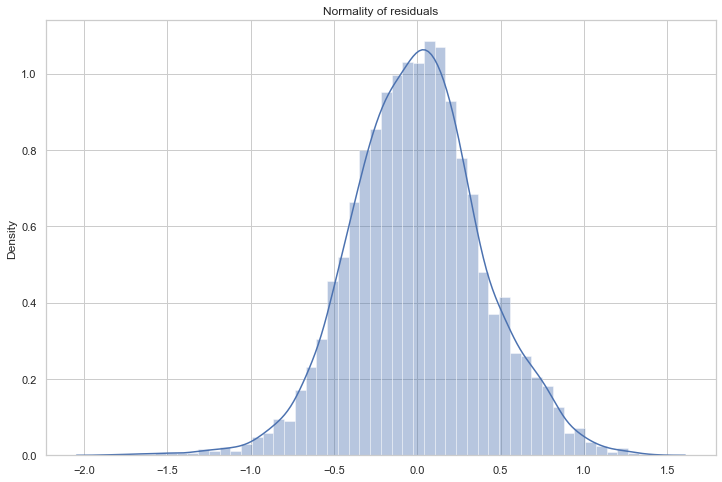

<IPython.core.display.Javascript object>

In [188]:
# create a histogram of residuals
sns.distplot(residual)
plt.title("Normality of residuals")
plt.show()

### QQPlot
The QQ plot of residuals can be used to visually check the normality assumption. The normal probability plot of residuals should approximately follow a straight line.

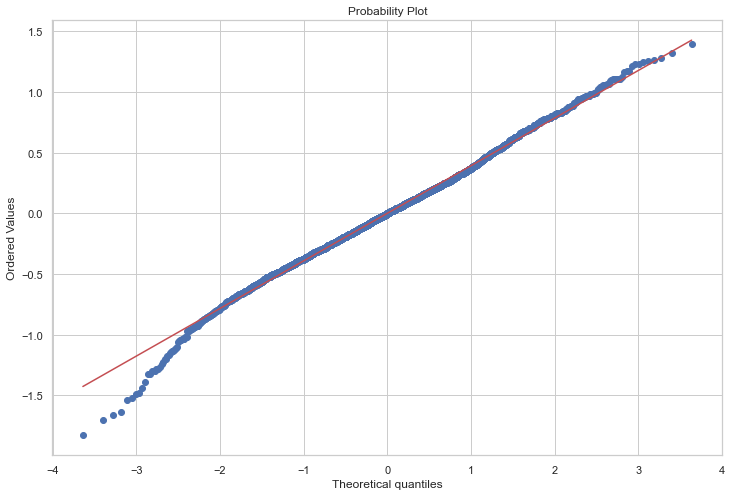

<IPython.core.display.Javascript object>

In [189]:
# create a probability plot
stats.probplot(residual, dist="norm", plot=pylab)
plt.show()

The residuals have a close to normal distribution. Assumption 5 is also satisfied.
We should further investigate these values in the tails where we have made huge residual errors.

Now that we have seen that olsmodel3 follows all the linear regression assumptions. Let us use that model to draw inferences.

### Shapiro Test

In [190]:
# get Shapiro test results
stats.shapiro(residual)

ShapiroResult(statistic=0.996060311794281, pvalue=2.0631184260988533e-10)

<IPython.core.display.Javascript object>

##### Observations:

* The residuals are normal as per visual test, but as per QQ plot they are approximately normal.
* The issue with shapiro test is when dataset is big, even for small deviations, it shows data as not normal.
* The Shapiro test outputs a high negative number which is below a p=0.05 value. No departure from normality is found.

**Now we have checked all the assumptions and they are satisfied, so we can move towards the prediction part.**

# <a id="Link6"> Best Model Predicting </a>

### Model Prediction

**Let us now make predictions on the test set (*X_test*) with the model, and compare the actual output values with the predicted values.**

In [191]:
# create a new dataframe and read the head
df3 = df2.drop(labels=high_vif_columns and cols_to_drop, axis=1)
df3.head()

# We will have to create the x and y datasets again
ind_vars = df3.drop(["price_log"], axis=1)
dep_var = df3[["price_log"]]

# Dummy encoding
ind_vars_num = encode_cat_vars(ind_vars)

# Splitting data into train and test
x_train5, x_test5, y_train5, y_test5 = train_test_split(
    ind_vars_num, dep_var, test_size=0.3, random_state=1
)

# Statsmodel api does not add a constant by default. We need to add it explicitly.
x_train5 = sm.add_constant(x_train5)
# Add constant to test data
x_test5 = sm.add_constant(x_test5)

<IPython.core.display.Javascript object>

In [192]:
x_test5.shape

(2174, 13)

<IPython.core.display.Javascript object>

In [193]:
x_test5.head()

,const,Year,Seats,Location_Jaipur,Location_Kolkata,Location_Pune,Fuel_Type_Diesel,Transmission_Manual,Owner_Type_Second,Owner_Type_Third,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,
5043,1.00,2014,5,0,0,0,0,1,0,0,0,0,0
5670,1.00,2014,5,0,1,0,1,1,0,0,0,0,0
2782,1.00,2014,5,1,0,0,1,1,0,0,0,0,0
3659,1.00,2015,5,0,0,0,0,0,0,0,0,0,0
2869,1.00,2014,5,0,0,0,1,1,0,0,0,0,0


<IPython.core.display.Javascript object>

In [194]:
y_test5.shape

(2174, 1)

<IPython.core.display.Javascript object>

In [195]:
# create linear model on training data
reg = LinearRegression().fit(x_train5, y_train5)

reg.predict(x_test5)  # Predict using the linear model. # predictions on the test set

reg.score(
    x_test5, y_test5
)  # return R2 coefficient of determination  of the prediction. (0-1)

0.7601503856141686

<IPython.core.display.Javascript object>

- We can observe here that our model has returned pretty good prediction results (~76% accuracy), and the actual and predicted values are comparable.

In [196]:
# get df columns
x_train5.columns

Index(['const', 'Year', 'Seats', 'Location_Jaipur', 'Location_Kolkata',
       'Location_Pune', 'Fuel_Type_Diesel', 'Transmission_Manual',
       'Owner_Type_Second', 'Owner_Type_Third', 'Car_category_Mid_Range',
       'Car_category_Luxury_Cars', 'Car_category_Ultra_luxury'],
      dtype='object')

<IPython.core.display.Javascript object>

In [197]:
# Get the range of the y-variable
cols = [np.exp(y_train5), np.exp(y_test5)]
for i in cols:
    display(i.max() - i.min())

price_log   96.63
dtype: float64

price_log   119.55
dtype: float64

<IPython.core.display.Javascript object>

In [198]:
# Selecting columns from test data that we used to create our final model
X_test_final = x_test5[x_train5.columns]

<IPython.core.display.Javascript object>

In [199]:
# look at the head
X_test_final.head()

,const,Year,Seats,Location_Jaipur,Location_Kolkata,Location_Pune,Fuel_Type_Diesel,Transmission_Manual,Owner_Type_Second,Owner_Type_Third,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury
S.No.,,,,,,,,,,,,,
5043,1.00,2014,5,0,0,0,0,1,0,0,0,0,0
5670,1.00,2014,5,0,1,0,1,1,0,0,0,0,0
2782,1.00,2014,5,1,0,0,1,1,0,0,0,0,0
3659,1.00,2015,5,0,0,0,0,0,0,0,0,0,0
2869,1.00,2014,5,0,0,0,1,1,0,0,0,0,0


<IPython.core.display.Javascript object>

**Observations**

- Dependent variable is in a log-scale so we will have to interpret accordingly.
- The low price is 96Lakhs and the high price is 119.55Lakhs on the test set.
- 

In [206]:
# Checking model performance on test set (seen 70% data)
print("Test Performance\n")
model_pref(olsmodel4, x_train5, x_test5)

Test Performance

    Data  RMSE  MAE  MAPE
0  Train  0.39 0.31   inf
1   Test  0.39 0.30   inf


<IPython.core.display.Javascript object>

**RMSE:**: Increased on training and test from model3 saying that our fit has decreased.

**MAE:**: Decreased from model3 on training and test saying that our fit has increased. Meaning that our current model is able to predict used cars prices within mean error of .30 lakhs on test data.

**MAPE:** Has 0's in it so it returns an error.

# <a link = 'link7'>Inferences</a>

In [207]:
# let us print the model summary
olsmodel4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                     1310.
Date:                Fri, 20 Aug 2021   Prob (F-statistic):               0.00
Time:                        07:08:54   Log-Likelihood:                -2455.8
No. Observations:                5072   AIC:                             4938.
Df Residuals:                    5059   BIC:                             5022.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      -139.6884      3.818    -36.584      0.000    -147.174    -132.203
Year                          0.0700      0.002     36.948      0.000       0.066       0.074
Seats                         0.1005      0.007     13.816      0.000       0.086       0.115
Location_Jaipur              -0.1543      0.022     -6.959      0.000      -0.198      -0.111
Location_Kolkata             -0.1679      0.020     -8.453      0.000      -0.207      -0.129
Location_Pune                -0.1017      0.018     -5.569      0.000      -0.138      -0.066
Fuel_Type_Diesel              0.2352      0.012     19.383      0.000       0.211       0.259
Transmission_Manual          -0.4019      0.015    -27.147      0.000      -0.431      -0.373
Owner_Type_Second            -0.0538      0.016     -3.334      0.001      -0.085      -0.022
Owner_Type_Third             -0.1939      0.040     -4.812      0.000      -0.273      -0.115
Car_category_Mid_Range        0.9782      0.023     42.935      0.000       0.934       1.023
Car_category_Luxury_Cars      1.3994      0.032     43.309      0.000       1.336       1.463
Car_category_Ultra_luxury     1.8896      0.052     36.527      0.000       1.788       1.991
==============================================================================
Omnibus:                       44.173   Durbin-Watson:                   2.011
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               69.903
Skew:                          -0.027   Prob(JB):                     6.62e-16
Kurtosis:                       3.573   Cond. No.                     1.39e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.39e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<IPython.core.display.Javascript object>

# <a id="link8">Insights and Recommendations</a>

***olsres4* is our final model which follows all the assumptions, and can be used for interpretations.**

The general linear regression formula is:
Y = B0 + B1*X1 + B2*X2 + e.

Our linear regression formula would be:
Price=8.37789660802926E-74(consant) +	3.10588904098151(Car_category_Luxury_Cars)+	2.25128237881789(Car_category_Mid-Range)+	1.1304321576378(Fuel_Type_Diesel)+	1.08784644134162(Year)+	1.08231254791372(Fuel_Type_LPG)+	1.04759807906853(Location_Hyderabad)+	1.00611864288793(Location_Mumbai)+	1.00040008001067(Engine_num)+	0.982062821165706(Seats)+	0.948759440367809(Owner_Type_Second)+	0.937067463377403(Location_Pune)+	0.898345985825023(Location_Jaipur)+	0.856329540247798(Location_Kolkata)+	0.838282603224233(Owner_Type_Third)+	0.812207036711939(Transmission_Manual)+	0.99999975690003(Kilometers_Driven)

1. With our linear regression model we have been able to capture ~76% information in our data. $R^2$ is 0.75, i.e., the model variance of its errors is 75% less than the variance of the dependent variable. So overall, the model is satisfactory.

**It is important to note here that correlation is not equal to causation. That is to say that increase in Mileage does not lead to a drop in prices. It can be understood in such a way that the cars with high mileage do not have a high power engine and therefore have low prices.**

2. The model indicates that the most significant predictors of price of used cars are - 
        - `Car_category_Ultra_luxury`
        - `Car_category_Luxury_Cars`
        - `Car_category_Mid-Range`
        - `Fuel_Type_Diesel`
        - `Year`
        
        The following features have a positive influence on Price:
        - `Year`
        - `Power`
        - `Fuel_Type_Diesel`

        The following features have a negative influence on Price:
        - `Transmission_Manual`
        -`Seats`
        -`Owner_Type_Third`

        The features of greatest impact are :
        - `Transmission_Manual` - in the negative direction.           
        - `Car_category_Ultra_luxury` - in the positive direction.

**It is important to note here that the predicted values are log(x) and therefore coefficients have to be converted accordingly to understand their influence in price.**  

"Only independent/predictor variable(s) is log-transformed. Divide the coefficient by 100. This tells us that a 1% increase in the independent variable increases (or decreases) the dependent variable by (coefficient/100) units. Example: the coefficient is 0.198. 0.198/100 = 0.00198. For every 1% increase in the independent variable, our dependent variable increases by about 0.002. For x percent increase, multiply the coefficient by log(1.x). Example: For every 10% increase in the independent variable, our dependent variable increases by about 0.198 * log(1.10) = 0.02."
<a href="https://data.library.virginia.edu/interpreting-log-transformations-in-a-linear-model/">Source</a>


3. Newer cars sell for higher prices. 1 unit increase in the year of manufacture leads to [ exp(0.1145) = 1.12 Lakh ] increase in the price of the vehicle, when everything else is constant.

4. As the number of seats increases, the price of the car increases - exp(0.0145) = 1.01 Lakhs

5. Kilometers Driven have a negative relationship with the price which is intuitive. A car that has been driven more will have more wear and tear and hence sell at a lower price, everything else being 0.

6. The categorical variables are a little hard to interpret. But it can be seen that all the car_category variables in the dataset have a positive relationship with the Price and the magnitude of this positive relationship increases as the brand category moves to the luxury brands. It will not be incorrect to interpret that the dropped car_category variable for budget friendly cars would have a negative relationship with the price because the other 3 are increasingly positive.

## Recommendations

1. Work on getting a dataset with a significant amount of New Car prices to come up with a new model. Develop a strategy to harvest cleaner and clearer datasets on an on-going basis.

2. Flag any Electric vehicles as high-cost and Hindustan brand as low-cost. Other Fuel_Types have similar effects to eachother and will tend to be lower cost. The other Makes/Brands will be higher costing but all about the same as they have the same effect on Price.

3. With Automatic and Manuals having similar effects, you can safely disregard distinguishing them when giving recommendations.

4. When looking to predict used car prices, use the price category data to navigate customers towards the prices they can expect to pay.

5. Some southern markets tend to have higher prices. It might be a good strategy to plan growth in southern cities using this information. Markets like Kolkata(coeff = -0.15log) are very risky and we need to be careful about investments in this area.

# <a id = 'link9'>Project Improvement</a>

## Notes

1. I could have tried log transformations to make the independent more normal instead of the dependent.

2. I could have removed categorical or numeric types/columns where only one record existed. This has a similar effect as outliers in that one variable can skew the inferences in a direction.

3. I could have done a PCA feature analysis to reduce the number of input features which would possibily have changed the R^2 value and coefficients.


## Add-On-Analysis
Analysising predictions where we were way off the mark.

In [209]:
# Extracting the rows from original data frame df where indexes are same as the training data of best model
original_df = df[df.index.isin(x_train5.index.values)].copy()

# Extracting predicted values from the final model
residuals = olsmodel4.resid
fitted_values = olsmodel4.fittedvalues

# Add new columns for predicted values
original_df["Predicted price_log "] = fitted_values
original_df["Predicted Price"] = fitted_values.apply(math.exp)
original_df["residuals"] = residuals
original_df["Abs_residuals"] = residuals.apply(math.exp)
original_df["Difference in Lakhs"] = np.abs(
    original_df["price_log"] - original_df["Predicted Price"]
)

# Let us look at the top 20 predictions where our model made highest extimation errors (on train data)
original_df.sort_values(by=["Difference in Lakhs"], ascending=False).head(100)

,Year,Kilometers_Driven,Power,Seats,Engine_num,Mileage_num,price_log,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,Brand_Audi,Brand_Bentley,Brand_Bmw,Brand_Chevrolet,Brand_Datsun,Brand_Fiat,Brand_Force,Brand_Ford,Brand_Hindustan,Brand_Honda,Brand_Hyundai,Brand_Isuzu,Brand_Jaguar,Brand_Jeep,Brand_Lamborghini,Brand_Land,Brand_Mahindra,Brand_Maruti,Brand_Mercedes-Benz,Brand_Mini,Brand_Mitsubishi,Brand_Nissan,Brand_Opelcorsa,Brand_Porsche,Brand_Renault,Brand_Skoda,Brand_Smart,Brand_Tata,Brand_Toyota,Brand_Volkswagen,Brand_Volvo,Car_category_Mid_Range,Car_category_Luxury_Cars,Car_category_Ultra_luxury,Predicted price_log,Predicted Price,residuals,Abs_residuals,Difference in Lakhs
S.No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5038,2019,24013,148.31,7,1999,12.81,4.03,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.55,95.00,-0.53,0.59,90.97
5067,2019,17201,187.70,7,2179,12.51,4.08,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.55,95.00,-0.48,0.62,90.92
1583,2019,6773,245.00,7,2967,14.75,4.29,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.55,95.00,-0.26,0.77,90.71
282,2018,11287,241.40,7,2967,12.07,4.25,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.48,88.57,-0.23,0.79,84.32
327,2017,97430,245.00,7,2967,14.75,4.14,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.41,82.58,-0.28,0.76,78.44
3705,2019,29311,170.00,5,2143,17.90,3.93,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.35,77.71,-0.42,0.66,73.77
3043,2019,25899,147.50,5,2179,12.63,4.02,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.35,77.71,-0.33,0.72,73.69
1505,2019,26013,255.00,5,2993,12.65,4.58,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.35,77.71,0.22,1.25,73.13
4345,2016,45180,241.40,7,2967,12.07,3.92,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.34,77.00,-0.43,0.65,73.08


<IPython.core.display.Javascript object>

* An Ultra Luxury used car, whose used model sells at 56.26 Lakhs and was predicted to be sold at 95 Lakhs. It is not apparent after looking at numerical predictors, why our model predicted such high value here. This could be because all other Ultra Luxury vehicles in our data seem to have sold at higher prices.

* There are no instances of false predictions for Mid_Range vehicles.

* There are no instances where the model predicts lesser than the actual selling price. These could be a cause for concern. The model predicting higher than potential selling price is not good for business in the used car market where a lower-price point is the main attraction.

Let's take a look at the model's missed predictions for the Ultra Luxury used vehicles.

<AxesSubplot:xlabel='Difference in Lakhs', ylabel='price_log'>

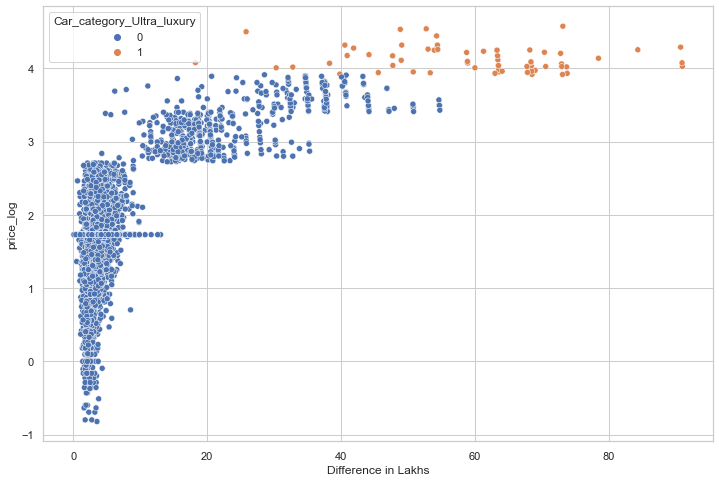

<IPython.core.display.Javascript object>

In [212]:
# scatter plot of predications
sns.scatterplot(
    original_df["Difference in Lakhs"],
    original_df["price_log"],
    hue=original_df["Car_category_Ultra_luxury"],
)

**Observations**
- There is a clear grouping between the Mid-Range, Luxury, and Ultra Luxury vehicle categories demarcated by price difference.

- Most outliers are the Ultra Luxury models. Our model predicts that resale value of Ultra Luxury cars is higher compared to Mid and Luxury cars. This is probably the cause of these outliers.

- Our model seems to be very good at predicting Mid-range, and perhaps therefore Budget as well, vehicle prices.

----------------- END -----------------------------------